In [ ]:
from utils import *
from genetic import *
from constants import *
from CFSFDP_clustering import *

# Data Preprocessing and Splitting Workflow

This section demonstrates a comprehensive pipeline for loading, preprocessing, and splitting different heart-related datasets. The goal is to produce consistent training, validation, and testing subsets, as well as helpful metadata about the features.

## Overview

1. **Dataset Selection**  
   We support multiple datasets, including the Framingham, Cleveland, BMC, and an already-encoded version of BMC. Depending on the `name` passed to the `choose_dataset` function, the correct dataset is downloaded and loaded into a Pandas DataFrame.

2. **Data Types and Removal of Features**  
   Each dataset has a predefined dictionary (`dataTypeDict`) categorizing features as continuous, binary, categorical, or removable.  
   - *Removable features* (e.g., `currentSmoker` in Framingham) are dropped from the dataset altogether.  
   - Remaining features are assigned the correct type to help guide downstream transformations.

3. **Normalization and Missing Values**  
   - **Normalization**: Controlled by the `normal=True` argument, standardizes numeric features.  
   - **Missing Value Imputation**: An optional KNN tuner (`knn_tuner=True`) finds an optimal number of neighbors to impute missing values. Otherwise, a default `k` is used.

4. **Encoding and Feature Engineering**  
   - **One-Hot Encoding**: If `beOne=True`, categorical columns are expanded into multiple binary columns.  
   - **Cluster Analysis**: Instances of minority and majority classes are clustered to identify “inland,” “borderline,” and “trapped” regions.  
   - **Feature Selection (CatBoost)**: When `feature_selection=True`, CatBoost determines feature importance, and the bottom few features are removed.

5. **Data Splitting**  
   We apply a proportion of the data (based on `split_ratio`) to create:
   - A **validation** set.  
   - A **test** set.  
   - The remainder, which forms our **training** set.  

6. **Returned Objects**  
   The function returns the processed training (`df`), validation (`df_validation`), and test (`df_test`) DataFrames, plus dictionaries and masks that further describe the dataset (e.g., `dataTypeDict`, `describeData`, `features_mask`, and `islands`).

In [ ]:
from scipy.sparse import data

def choose_dataset(
    name='framingham',
    normal=True,
    beOne=True,
    feature_selection=False,
    knn_tuner=False,
    split_ratio=0.3,
    k=5
):
    """
    Downloads, processes, and returns the selected dataset along with additional
    metadata like dataTypeDict, describeData, and features_mask.

    Arguments:
        name (str): The name of the dataset to work with.
            Possible values: 'framingham', 'cleveland', 'bmc', 'encoded_bmc'.
        normal (bool): Whether or not to normalize the dataset.
        beOne (bool): Whether or not to apply one-hot encoding to categorical features.
        feature_selection (bool): Whether or not to perform feature selection using CatBoost.
        knn_tuner (bool): If True, finds the best number of neighbors for KNN imputation.
        split_ratio (float): The proportion of data to hold out for validation/test sets.
        k (int): The default number of neighbors for KNN imputation, used if knn_tuner=False.

    Returns:
        df (pd.DataFrame): The main training dataframe (after removing validation/test).
        df_validation (pd.DataFrame): A subset of data designated for validation.
        df_test (pd.DataFrame): A subset of data designated for testing.
        dataTypeDict (dict): A dictionary with feature names as keys and feature types as values.
        describeData (dict): A dictionary summarizing dataset statistics, derived from get_describeData().
        features_mask (np.array): A boolean mask indicating which features are categorical.
        islands (dict): Structure containing the cluster information for minority/majority classes.
    """

    # Paths to zipped dataset files
    dataset_zip_files_names = {
        'framingham': 'framingham-heart-study-dataset.zip',
        'cleveland': 'heart-disease-cleveland.zip',
        'bmc': 'heart-failure-clinical-data.zip',
        'encoded_bmc': '',
    }

    # Paths to CSV files once unzipped
    dataset_csv_files_names = {
        'framingham': 'framingham.csv',
        'cleveland': 'Heart_disease_cleveland_new.csv',
        'bmc': 'heart_failure_clinical_records_dataset.csv',
        'encoded_bmc': '/content/gdrive/MyDrive/encoded/encoded.csv'
    }

    # 1. Download or load the selected dataset
    if name == 'framingham':
        framingham_dataset()  # Downloads/loads Framingham data
        dataTypeDict = {
            'male': 'binary',
            'age': 'continuous',
            'education': 'category',
            'currentSmoker': 'removeable',
            'cigsPerDay': 'continuous',
            'BPMeds': 'removeable',
            'prevalentStroke': 'removeable',
            'prevalentHyp': 'binary',
            'diabetes': 'removeable',
            'totChol': 'continuous',
            'sysBP': 'continuous',
            'diaBP': 'continuous',
            'BMI': 'continuous',
            'heartRate': 'continuous',
            'glucose': 'continuous',
        }

    elif name == 'cleveland':
        cleveland_dataset()  # Downloads/loads Cleveland Heart data
        dataTypeDict = {
            'age': 'continuous',
            'sex': 'binary',
            'cp': 'category',
            'chol': 'continuous',
            'trestbps': 'continuous',
            'fbs': 'binary',
            'restecg': 'category',
            'thalach': 'continuous',
            'exang': 'binary',
            'oldpeak': 'continuous',
            'slope': 'category',
            'ca': 'category',
            'thal': 'category',
        }

    elif name == 'bmc':
        bmc_dataset()  # Downloads/loads BMC data
        dataTypeDict = {
            'age': 'continuous',
            'anaemia': 'binary',
            'creatinine_phosphokinase': 'continuous',
            'diabetes': 'binary',
            'ejection_fraction': 'continuous',
            'high_blood_pressure': 'binary',
            'platelets': 'continuous',
            'serum_creatinine': 'continuous',
            'serum_sodium': 'continuous',
            'sex': 'binary',
            'smoking': 'binary',
            'time': 'continuous',
        }

    elif name == 'encoded_bmc':
        # Already encoded version of BMC data
        dataTypeDict = {
            'col0': 'continuous',
            'col1': 'continuous',
            'col2': 'continuous',
            'col3': 'continuous',
            'col4': 'continuous',
            'col5': 'continuous',
        }

    # 2. Extract/Load the dataset into a dataframe
    if dataset_zip_files_names[name] == "":
        # Some datasets might come already unzipped (e.g., encoded_bmc)
        df = pd.read_csv(dataset_csv_files_names[name])
        df = df[df.columns[1:]]
    else:
        # Extract zip files into /content/dataset/ path if needed
        extract_zipFiles(dataset_zip_files_names[name], "/content/dataset/")
        df = pd.read_csv(f'/content/dataset/{dataset_csv_files_names[name]}')

    # 3. Rename the target column based on dataset
    if name == 'framingham':
        df = df.rename({'TenYearCHD': 'target'}, axis=1)
    if name == 'bmc':
        df = df.rename({'DEATH_EVENT': 'target'}, axis=1)

    # 4. Remove "removeable" features from dataframe and dataTypeDict
    keys = list(dataTypeDict.keys())
    for key in keys:
        if dataTypeDict[key] == 'removeable':
            df.pop(key)
            del dataTypeDict[key]

    # 5. Apply normalization if requested
    if normal:
        df = normailizer(df)

    # 6. (Optional) Tune KNN Imputer if requested
    if knn_tuner:
        # Identify columns with missing values
        missing_values = df.isnull().any()
        columns_with_missing_values = missing_values[missing_values].index.tolist()
        index_numbers = [df.columns.get_loc(col) for col in columns_with_missing_values]

        # Convert df to numpy for KNN tuner
        x = df.to_numpy()

        # Search for best number of neighbors by MSE
        tune = tune_knn(
            x_fold=x,
            columns=[i for i in range(12)]  # Example usage
        )
        tune = np.array(tune)
        kn_modified = np.argmin(tune) + 1
        print(f'The best number of neighbors: {kn_modified}')

        # Plot MSE vs. number of neighbors
        plt.plot(range(1, 31), tune)
        plt.xlabel('Number of Neighbors', fontsize=11)
        plt.ylabel('MSE (Mean Squared Error)', fontsize=11)

        # Create an imputer with the best K
        imputer = Imputer(df, k=kn_modified)
    else:
        # Use the default value of k
        imputer = Imputer(df, k=k)

    # 7. Perform data cleaning/imputation using the chosen K
    missValCols = dict(df.isna().sum())
    imputer.clean(missValCols, dataTypeDict)
    df = imputer.df

    # 8. One-Hot Encoding (OHE) for categorical features, if requested
    if beOne:
        for col in df.columns[:-1]:
            if dataTypeDict[col] == 'category':
                encoder = OneHotEncoder(sparse=False)
                encoded = encoder.fit_transform(df[col].to_numpy().reshape(-1, 1))
                df.drop(columns=[col], inplace=True)

                # Generate new feature names for the one-hot vectors
                encoded_features = [f'{col}_{i}' for i in range(1, np.shape(encoded)[1] + 1)]
                df[encoded_features] = encoded

                # Update dataTypeDict accordingly
                del dataTypeDict[col]
                for encoded_feature in encoded_features:
                    dataTypeDict[encoded_feature] = 'binary'

    # 9. Move "target" column to the last position
    target = df.target
    df.drop(columns=['target'], inplace=True)
    df['target'] = target

    # 10. Generate metadata about dataset features
    describeData, features_mask = get_describeData(df, dataTypeDict)

    # 11. Separate minority and majority instances
    df_minor = df[df.target == 1].reset_index(drop=True)
    df_major = df[df.target == 0].reset_index(drop=True)

    # 12. Cluster minority and majority classes
    # (For advanced oversampling or further analysis)
    minor_coordinates = df_minor[df.columns[:-1]].to_numpy()
    minorities_cfs = cluster_coordinates(minor_coordinates, features_mask=features_mask, neighbors_num=k, plot=False)

    major_coordinates = df_major[df.columns[:-1]].to_numpy()
    majorities_cfs = cluster_coordinates(major_coordinates, features_mask=features_mask, neighbors_num=k, plot=False)

    # 13. Identify regions: 'inland', 'borderline', and 'trapped' for each class
    minor_inlands = minorities_cfs.regions['inland']
    minor_borderline = minorities_cfs.regions['borderline']
    minor_trapped = minorities_cfs.regions['trapped']

    major_inlands = majorities_cfs.regions['inland']
    major_borderline = majorities_cfs.regions['borderline']
    major_trapped = majorities_cfs.regions['trapped']

    # 14. Split data (both minor and major) into validation/test based on split_ratio
    #     and keep track of the main training indices

    # -- Minor class splitting
    minor_validation_test_inlands = np.random.choice(
        minor_inlands,
        round(len(minor_inlands) * split_ratio),
        replace=False
    )
    minor_validation_inlands = minor_validation_test_inlands[:round(len(minor_validation_test_inlands)//2)]
    minor_test_inlands = minor_validation_test_inlands[round(len(minor_validation_test_inlands)//2):]
    main_minor_inlands = ~np.in1d(minor_inlands, minor_validation_test_inlands)
    main_minor_inlands = minor_inlands[main_minor_inlands]

    minor_validation_test_borderline = np.random.choice(
        minor_borderline,
        round(len(minor_borderline) * split_ratio),
        replace=False
    )
    minor_validation_borderline = minor_validation_test_borderline[:round(len(minor_validation_test_borderline)//2)]
    minor_test_borderline = minor_validation_test_borderline[round(len(minor_validation_test_borderline)//2):]
    main_minor_borderline = ~np.in1d(minor_borderline, minor_validation_test_borderline)
    main_minor_borderline = minor_borderline[main_minor_borderline]

    minor_validation_test_trapped = np.random.choice(
        minor_trapped,
        round(len(minor_trapped) * split_ratio),
        replace=False
    )
    minor_validation_trapped = minor_validation_test_trapped[:round(len(minor_validation_test_trapped)//2)]
    minor_test_trapped = minor_validation_test_trapped[round(len(minor_validation_test_trapped)//2):]
    main_minor_trapped = ~np.in1d(minor_trapped, minor_validation_test_trapped)
    main_minor_trapped = minor_trapped[main_minor_trapped]

    # -- Major class splitting
    major_validation_test_inlands = np.random.choice(
        major_inlands,
        round(len(major_inlands) * split_ratio),
        replace=False
    )
    major_validation_inlands = major_validation_test_inlands[:round(len(major_validation_test_inlands)//2)]
    major_test_inlands = major_validation_test_inlands[round(len(major_validation_test_inlands)//2):]
    main_major_inlands = ~np.in1d(major_inlands, major_validation_test_inlands)
    main_major_inlands = major_inlands[main_major_inlands]

    major_validation_test_borderline = np.random.choice(
        major_borderline,
        round(len(major_borderline) * split_ratio),
        replace=False
    )
    major_validation_borderline = major_validation_test_borderline[:round(len(major_validation_test_borderline)//2)]
    major_test_borderline = major_validation_test_borderline[round(len(major_validation_test_borderline)//2):]
    main_major_borderline = ~np.in1d(major_borderline, major_validation_test_borderline)
    main_major_borderline = major_borderline[main_major_borderline]

    major_validation_test_trapped = np.random.choice(
        major_trapped,
        round(len(major_trapped) * split_ratio),
        replace=False
    )
    major_validation_trapped = major_validation_test_trapped[:round(len(major_validation_test_trapped)//2)]
    major_test_trapped = major_validation_test_trapped[round(len(major_validation_test_trapped)//2):]
    main_major_trapped = ~np.in1d(major_trapped, major_validation_test_trapped)
    main_major_trapped = major_trapped[main_major_trapped]

    # 15. Build validation set for minority and majority classes
    df_validation_minor = df_minor.iloc[minor_validation_inlands]
    df_validation_minor = df_validation_minor.append(df_minor.iloc[minor_validation_borderline])
    df_validation_minor = df_validation_minor.append(df_minor.iloc[minor_validation_trapped])

    df_validation_major = df_major.iloc[major_validation_inlands]
    df_validation_major = df_validation_major.append(df_major.iloc[major_validation_borderline])
    df_validation_major = df_validation_major.append(df_major.iloc[major_validation_trapped])

    df_validation = df_validation_minor.append(df_validation_major)

    # 16. Build test set for minority and majority classes
    df_test_minor = df_minor.iloc[minor_test_inlands]
    df_test_minor = df_test_minor.append(df_minor.iloc[minor_test_borderline])
    df_test_minor = df_test_minor.append(df_minor.iloc[minor_test_trapped])

    df_test_major = df_major.iloc[major_test_inlands]
    df_test_major = df_test_major.append(df_major.iloc[major_test_borderline])
    df_test_major = df_test_major.append(df_major.iloc[major_test_trapped])

    df_test = df_test_minor.append(df_test_major)

    # 17. Prepare an islands dictionary to keep track of "inland", "borderline", and "trapped" clusters
    islands = {}

    # 18. Merge back the remaining minority data into df for training
    df = df_minor.iloc[main_minor_inlands].reset_index(drop=True)
    size_minor_inlands = len(main_minor_inlands)
    islands['minor'] = {'inland': np.array(range(0, size_minor_inlands))}

    df = df.append(df_minor.iloc[main_minor_borderline].reset_index(drop=True))
    size_minor_inlands_borderline = size_minor_inlands + len(main_minor_borderline)
    islands['minor']['borderline'] = np.array(range(size_minor_inlands, size_minor_inlands_borderline))

    df = df.append(df_minor.iloc[main_minor_trapped].reset_index(drop=True))
    size_minor_inlands_borderline_trapped = size_minor_inlands_borderline + len(main_minor_trapped)
    islands['minor']['trapped'] = np.array(range(size_minor_inlands_borderline, size_minor_inlands_borderline_trapped))

    # 19. Merge back the remaining majority data into df for training
    df = df.append(df_major.iloc[main_major_inlands].reset_index(drop=True))
    size_major_inlands = len(main_major_inlands)
    islands['major'] = {"inland": np.array(range(0, size_major_inlands))}

    df = df.append(df_major.iloc[main_major_borderline].reset_index(drop=True))
    size_major_inlands_borderline = size_major_inlands + len(main_major_borderline)
    islands['major']['borderline'] = np.array(range(size_major_inlands, size_major_inlands_borderline))

    # Store cluster structures for future reference
    islands['minor']['clusters'] = minorities_cfs.clusters
    islands['major']['clusters'] = majorities_cfs.clusters

    # 20. (Optional) Feature selection via CatBoost
    if feature_selection:
        cat_df = df.copy()
        # Cast categorical columns to int for CatBoost
        cat_df[cat_df.columns[:-1][features_mask]] = cat_df[cat_df.columns[:-1][features_mask]].astype(int)
        categorical_features = np.where(features_mask == True)[0]

        catboost_dataset = Pool(
            data=cat_df[cat_df.columns[:-1]],
            label=cat_df.target,
            cat_features=categorical_features
        )
        model = CatBoostClassifier(
            iterations=500,
            depth=6,
            learning_rate=0.1,
            loss_function='Logloss',
            cat_features=categorical_features
        )
        model.fit(catboost_dataset, verbose=False)

        # Get feature importance and visualize
        feature_importance = model.get_feature_importance(catboost_dataset)
        feature_names = df.columns[:-1]

        plt.figure(figsize=(10, 6))
        plt.barh(feature_names, feature_importance, color='skyblue')
        plt.xlabel('Feature Importance')
        plt.title('CatBoost Feature Importance')
        plt.gca().invert_yaxis()
        plt.show()

        # Keep top K features; remove ~3 least important
        top_k_features = [feature for _, feature in sorted(zip(feature_importance, feature_names), reverse=True)[:-3]]
        bottom_features = [feature for _, feature in sorted(zip(feature_importance, feature_names))[:3]]

        df = df[top_k_features + ['target']]
        df_test = df_test[top_k_features + ['target']]

        # Update metadata dictionaries and masks
        describeData, features_mask = get_describeData(df, dataTypeDict)
        for key in bottom_features:
            del dataTypeDict[key]

    # 21. Reset index for train, validation, and test dataframes
    df_test = df_test.reset_index(drop=True)
    df_validation = df_validation.reset_index(drop=True)
    df = df.reset_index(drop=True)

    # 22. Update metadata after any last transformations
    describeData, features_mask = get_describeData(df, dataTypeDict)

    # Return relevant structures
    return (
        df,
        df_validation,
        df_test,
        dataTypeDict,
        describeData,
        features_mask,
        islands
    )


In [ ]:
try:
  df, df_validation, df_test, dataTypeDict, describeData, features_mask, islands = choose_dataset('bmc')
except:
  df, df_validation, df_test, dataTypeDict, describeData, features_mask, islands = choose_dataset('bmc')

### Clustering

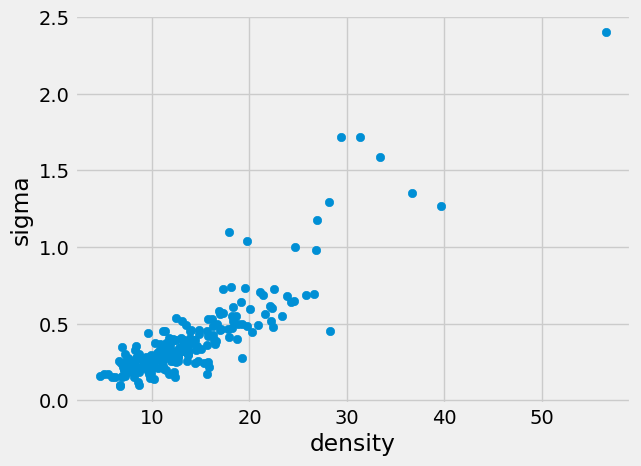

In [ ]:
"""Cluster dataset"""
coordinates = df[df.columns[:-1]].to_numpy()
cfs = cluster_coordinates(coordinates, features_mask=features_mask, neighbors_num=5, plot=True)

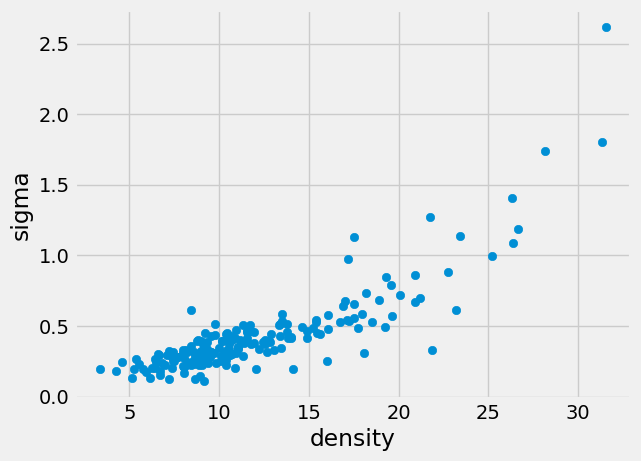

In [ ]:
"""Cluster Majorities"""
major_coordinates = df[df.target==0][df.columns[:-1]].to_numpy()
majorities_cfs = cluster_coordinates(major_coordinates, features_mask=features_mask, neighbors_num=5, plot=True)

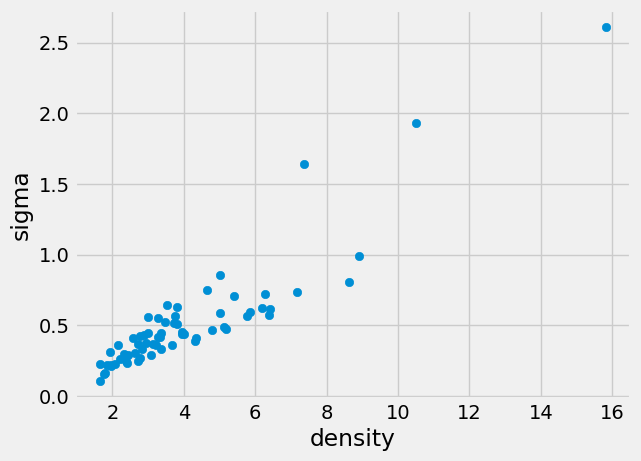

In [ ]:
"""Cluster Minorities"""
minor_coordinates = df[df.target==1][df.columns[:-1]].to_numpy()
minorities_cfs = cluster_coordinates(minor_coordinates, features_mask=features_mask, neighbors_num=5, plot=True)

#

In [ ]:
x=df[df.columns[:-1]].to_numpy()
y=df[df.columns[-1]].to_numpy()

In [ ]:
ml_models = {
      'LR':LogisticRegression(),
      'ANN':MLPClassifier(alpha=1e-05, hidden_layer_sizes=(16, 8, 4), random_state=1, solver='lbfgs',max_iter=300),
      'SVM':SVC(kernel="poly", random_state=2021, probability = True),
      'NB':MultinomialNB(),
      'DT':DecisionTreeClassifier(),
      'RF':RandomForestClassifier(n_estimators=256,random_state=2021,),
      'Ada':AdaBoostClassifier(n_estimators=250, random_state=2021),
      'GB': GradientBoostingClassifier(random_state=42, n_estimators=250, max_depth=6),
      'XGB': xgb.XGBClassifier(objective='binary:logistic', max_depth=8, n_estimators=250, random_state=42),
      'Cat': CatBoostClassifier(iterations=500,  max_depth=6,  learning_rate=0.01, loss_function='Logloss',random_state=42, verbose=False),
}

In [ ]:
ratios = {
    "5050":[0.5, 0.5],
    "8020":[0.8, 0.2],
    "10000":[1.0, 0.0],
    "2080":[0.2, 0.8],
    "00100":[0.0, 1.0],
}

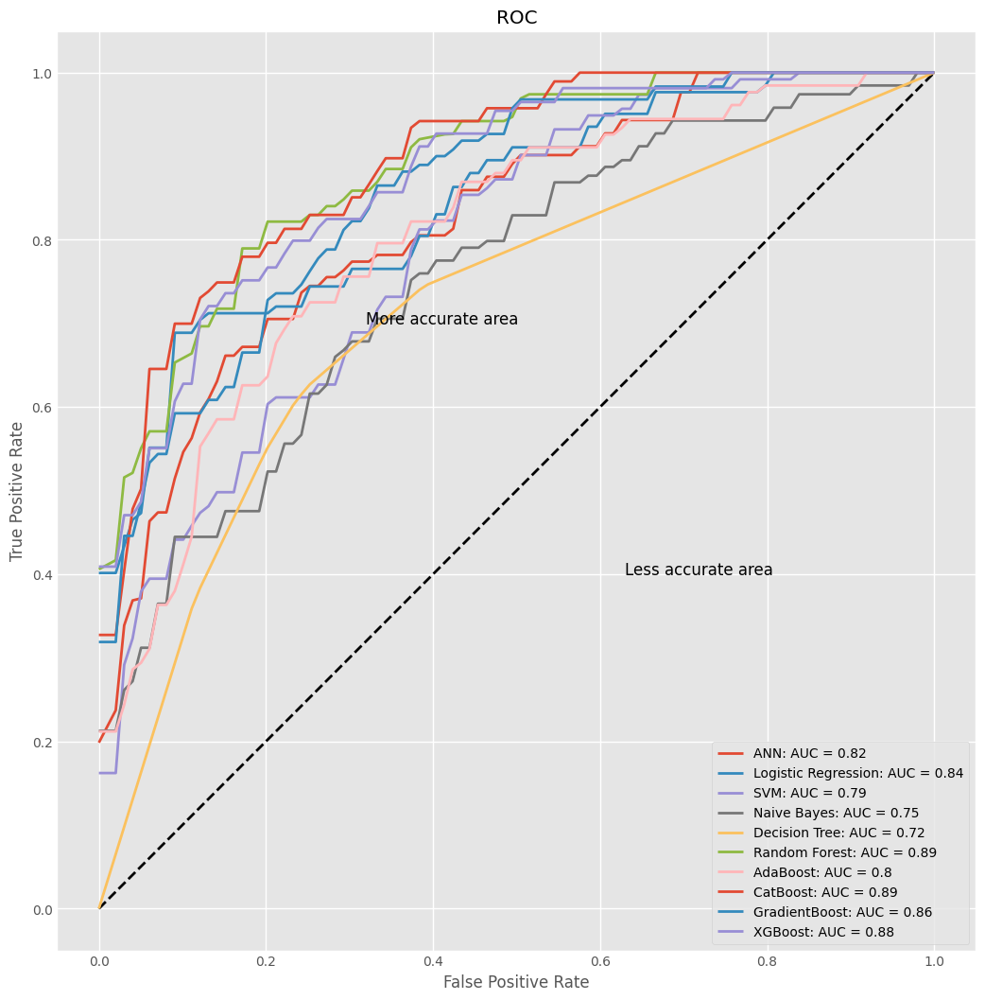

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.752211,0.656804,0.810556,0.651373,0.632792,0.823185
Logistic Regression,0.694048,0.752202,0.661667,0.526623,0.613346,0.844756
SVM,0.723299,0.546211,0.825714,0.595653,0.554204,0.791518
Naive Bayes,0.674405,0.082629,0.983333,0.68,0.135777,0.753686
Decision Tree,0.727551,0.673277,0.762698,0.594138,0.616173,0.71796
Random Forest,0.818282,0.790394,0.843254,0.703889,0.736344,0.887174
AdaBoost,0.429082,0.984615,0.143333,0.371203,0.531014,0.802018
CatBoost,0.814031,0.698483,0.883016,0.731036,0.706349,0.891238
GradientBoost,0.776956,0.679328,0.82254,0.655929,0.660995,0.857543
XGBoost,0.805697,0.693625,0.867302,0.708781,0.695652,0.876745


In [ ]:
result_= k_fold_results(df[df.columns[:-1]],df[df.columns[-1]], create_models(df), n_splits=5)
result_.T

In [ ]:
for ml_name, ml_obj in ml_models.items():
  for ratio_name, ratio in ratios.items():
    x=df[df.columns[:-1]].to_numpy()
    y=df[df.columns[-1]].to_numpy()
    model = ml_obj
    over = oversampling(df, x, y, len(df.columns[:-1]), fitness_ml_model=model, alpha_ratio=ratio[0], beta_ratio=ratio[1], k=5, features_mask=features_mask, genetic_iteration=200)
    syn = over.distro(desire=130)
    new_df = pd.DataFrame(over.x,columns=df.columns[:-1])
    new_df['target'] = over.y

    print(len(new_df[new_df[df.columns[-1]]==0]))
    print(len(new_df[new_df[df.columns[-1]]==1]))
    new_df.to_csv(f'/content/gdrive/MyDrive/new_df_{ml_name}_{ratio_name}.csv', index=False)

Processing: 67it [00:46,  1.44it/s]


129
127


Processing: 67it [00:49,  1.36it/s]


129
127


Processing: 67it [00:17,  3.85it/s]


129
127


Processing: 67it [00:16,  4.05it/s]


129
127


Processing: 67it [00:15,  4.41it/s]


129
127


Processing: 67it [00:15,  4.19it/s]


129
127


Processing: 67it [00:16,  3.97it/s]


129
127


Processing: 67it [00:16,  3.98it/s]


129
127


Processing: 67it [00:15,  4.31it/s]


129
127


Processing: 67it [00:17,  3.92it/s]


129
127


Processing: 67it [00:17,  3.87it/s]


129
127


Processing: 67it [00:15,  4.39it/s]


129
127


Processing: 67it [00:15,  4.41it/s]


129
127


Processing: 67it [00:16,  3.98it/s]


129
127


Processing: 67it [00:15,  4.38it/s]


129
127


Processing: 67it [00:16,  4.17it/s]


129
127


Processing: 67it [00:17,  3.90it/s]


129
127


Processing: 67it [00:15,  4.34it/s]


129
127


Processing: 67it [00:15,  4.36it/s]


129
127


Processing: 67it [00:16,  4.09it/s]


129
127


Processing: 67it [00:15,  4.25it/s]


129
127


Processing: 67it [00:15,  4.28it/s]


129
127


Processing: 67it [00:15,  4.42it/s]


129
127


Processing: 67it [00:14,  4.51it/s]


129
127


Processing: 67it [00:15,  4.46it/s]


129
127


Processing: 67it [03:17,  2.94s/it]


129
127


Processing: 67it [03:18,  2.96s/it]


129
127


Processing: 67it [03:18,  2.96s/it]


129
127


Processing: 67it [03:19,  2.98s/it]


129
127


Processing: 67it [03:18,  2.96s/it]


129
127


Processing: 67it [07:20,  6.57s/it]


129
127


Processing: 67it [07:18,  6.54s/it]


129
127


Processing: 67it [07:26,  6.67s/it]


129
127


Processing: 67it [07:22,  6.60s/it]


129
127


Processing: 67it [07:17,  6.53s/it]


129
127


Processing: 67it [00:19,  3.50it/s]


129
127


Processing: 67it [00:20,  3.24it/s]


129
127


Processing: 67it [00:19,  3.41it/s]


129
127


Processing: 67it [00:21,  3.18it/s]


129
127


Processing: 67it [00:21,  3.16it/s]


129
127


Processing: 67it [00:23,  2.87it/s]


129
127


Processing: 67it [00:31,  2.13it/s]


129
127


Processing: 67it [00:24,  2.71it/s]


129
127


Processing: 67it [00:24,  2.79it/s]


129
127


Processing: 67it [00:25,  2.67it/s]


129
127


Processing: 67it [00:21,  3.08it/s]


129
127


Processing: 67it [00:21,  3.06it/s]


129
127


Processing: 67it [00:20,  3.22it/s]


129
127


Processing: 67it [00:21,  3.07it/s]


129
127


Processing: 67it [00:21,  3.08it/s]


129
127


In [ ]:
def deep_model(hd, summary=False):
    input_shape = (len(hd.columns) - 1,)  # Exclude the target column from the input shape
    input_ = tf.keras.layers.Input(shape=input_shape)  # Use 'shape' instead of 'input_shape'

    x = tf.keras.layers.Dense(32, activation='relu')(input_)

    x = tf.keras.layers.Dense(16, activation='relu')(x)
    x = tf.keras.layers.Dense(8, activation='relu')(x)
    x = tf.keras.layers.Dense(4, activation='relu')(x)

    x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    model = tf.keras.models.Model(inputs=input_, outputs=x)
    if summary:
        print(model.summary())

    return model


In [ ]:
class Stacking():
  def __init__(self, meta_threshold=0.2):
    self.meta_threshold = meta_threshold
    self.random_forest = RandomForestClassifier(max_depth=12,n_estimators=250,random_state=2021)
    self.xgboost = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
    self.catboost = CatBoostClassifier(learning_rate=0.1, loss_function='Logloss',random_state=42, verbose=False)
    self.gb = GradientBoostingClassifier(random_state=2021)
    self.lr = LogisticRegression()
    self.svm = SVC(kernel='poly',random_state=2021, probability = True)
    self.meta_classifier = self.deep_meta_model(1)

  def deep_meta_model(self, shape):
    input_shape = (shape,)  # Exclude the target column from the input shape
    input_ = tf.keras.layers.Input(shape=input_shape)  # Use 'shape' instead of 'input_shape'

    x = tf.keras.layers.Dense(256, activation='relu')(input_)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)

    # Dropout for regularization
    # x = tf.keras.layers.Dropout(0.1)(x)

    x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

    model = tf.keras.models.Model(inputs=input_, outputs=x)
    return model

  def deep_model(self, shape):
    input_shape = (shape,)  # Exclude the target column from the input shape
    input_ = tf.keras.layers.Input(shape=input_shape)  # Use 'shape' instead of 'input_shape'

    x = tf.keras.layers.Dense(32, activation='relu')(input_)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(32, activation='relu')(x)
    x = tf.keras.layers.Dense(32, activation='relu')(x)
    x = tf.keras.layers.Dense(32, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
    model = tf.keras.models.Model(inputs=input_, outputs=x)

    return model

  def stacked_training(self, x_train, y_train):
    self.random_forest.fit(x_train,y_train)
    self.xgboost.fit(x_train,y_train)
    self.catboost.fit(x_train,y_train)
    self.gb.fit(x_train,y_train)
    # self.deep_classifier = self.deep_model(np.shape(x_train)[1])
    # self.deep_classifier.compile(optimizer='adam', loss='binary_crossentropy')
    # self.deep_classifier.fit(x_train,y_train, epochs=40, verbose=False)
    self.lr.fit(x_train,y_train)
    self.svm.fit(x_train,y_train)

  def stacked_predictions(self, x):
    rf_predictions = self.random_forest.predict_proba(x)[:,1]
    xgboost_predictions = self.xgboost.predict_proba(x)[:,1]
    catboost_predictions = self.catboost.predict_proba(x)[:,1]
    gb_predictions = self.gb.predict_proba(x)[:,1]
    # deep_predictions = self.deep_classifier.predict(x)
    lr_predictions = self.lr.predict(x)
    svm_predictions = self.svm.predict(x)
    meta_classifier_input = np.column_stack((lr_predictions, rf_predictions, xgboost_predictions, gb_predictions))
    meta_classifier_input = np.mean(meta_classifier_input, axis=1)
    # meta_classifier_input = np.column_stack((lr_predictions, svm_predictions))

    return meta_classifier_input

  def fit(self, x,y, epochs=120, verbose=False):
    x_train, x_meta, y_train, y_meta = train_test_split(x, y, test_size=0.20, random_state=42, stratify=y)
    self.stacked_training(x_train, y_train)
    meta_classifier_input = self.stacked_predictions(x_meta)

    self.meta_classifier.compile( loss='binary_crossentropy')
    self.meta_classifier.fit(meta_classifier_input, y_meta, epochs=epochs, verbose=False)


  def predict(self, x):
    meta_classifier_input = self.stacked_predictions(x)
    return self.meta_classifier.predict(meta_classifier_input)


  def predict(self, x):
    meta_classifier_input = self.stacked_predictions(x)
    return self.meta_classifier.predict(meta_classifier_input)

In [ ]:
def create_models(df):
  models={
      # 'Deep Learning':deep_model(df),
      'ANN':MLPClassifier(alpha=1e-04, hidden_layer_sizes=(5, 2), random_state=1, solver='lbfgs',max_iter=300),
      'Logistic Regression':LogisticRegression(class_weight='balanced'),
      'SVM':SVC(kernel="poly", random_state=2021, probability = True),
      'Naive Bayes':MultinomialNB(),
      'Decision Tree':DecisionTreeClassifier(),
      'Random Forest':RandomForestClassifier(max_depth=12, n_estimators=256, random_state=2021),
      'AdaBoost': AdaBoostClassifier(n_estimators=250, random_state=2021),
      'CatBoost': CatBoostClassifier(iterations=500, learning_rate=0.01, loss_function='Logloss',random_state=2021, verbose=False),
      'GradientBoost': GradientBoostingClassifier(random_state=2021, n_estimators=250, max_depth=6),
      'XGBoost': xgb.XGBClassifier(objective='binary:logistic', max_depth=8, n_estimators=250, random_state=42),
      # 'LGBMClassifier': LGBMClassifier()
      }

  return models

## Framingham Dataset

.

.

.

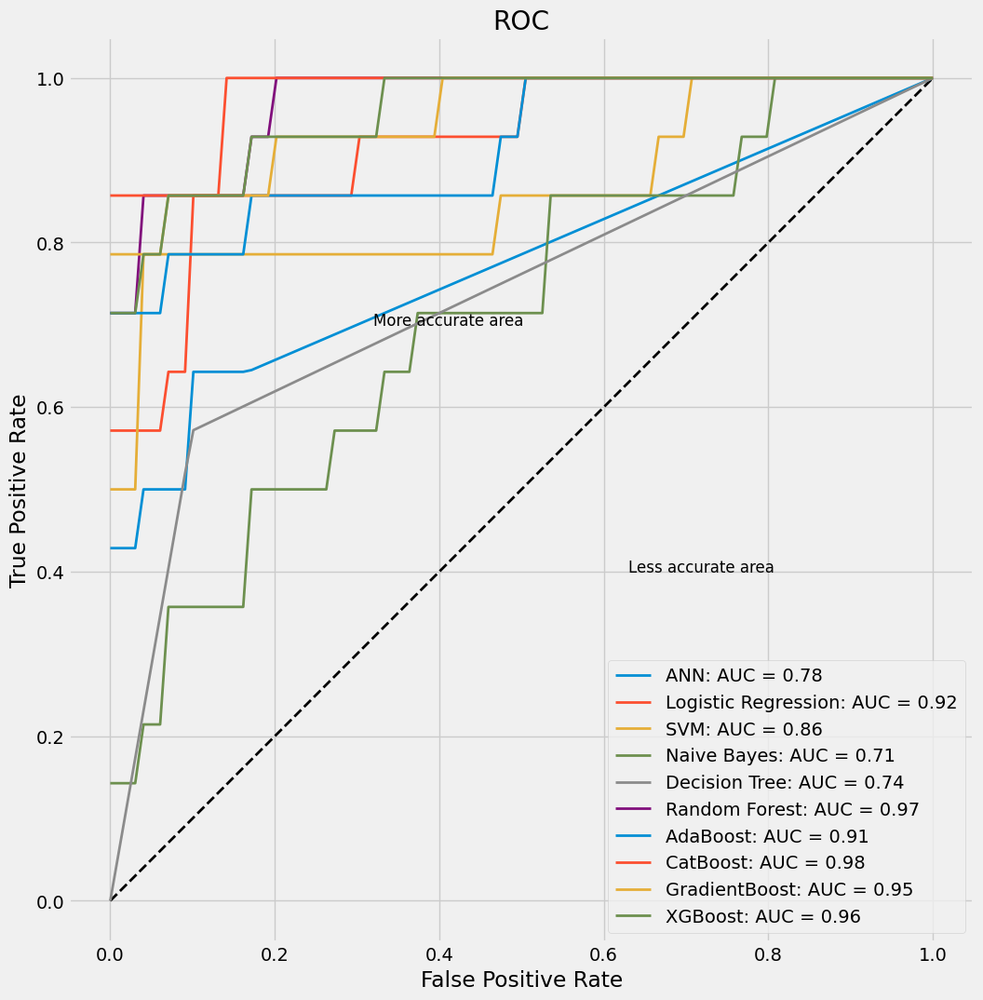

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.428571,0.966667,0.857143,0.571429,0.775438
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.917749
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.858947
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.707792
Decision Tree,0.795455,0.571429,0.9,0.727273,0.64,0.73569
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.968975
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.914141
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.980519
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.952742
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.957431


In [ ]:
new_df_LR_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_10000.csv')
result_LR_10000= k_fold_results(new_df_LR_10000[new_df_LR_10000.columns[:-1]],new_df_LR_10000[new_df_LR_10000.columns[-1]], create_models(new_df_LR_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_10000.T

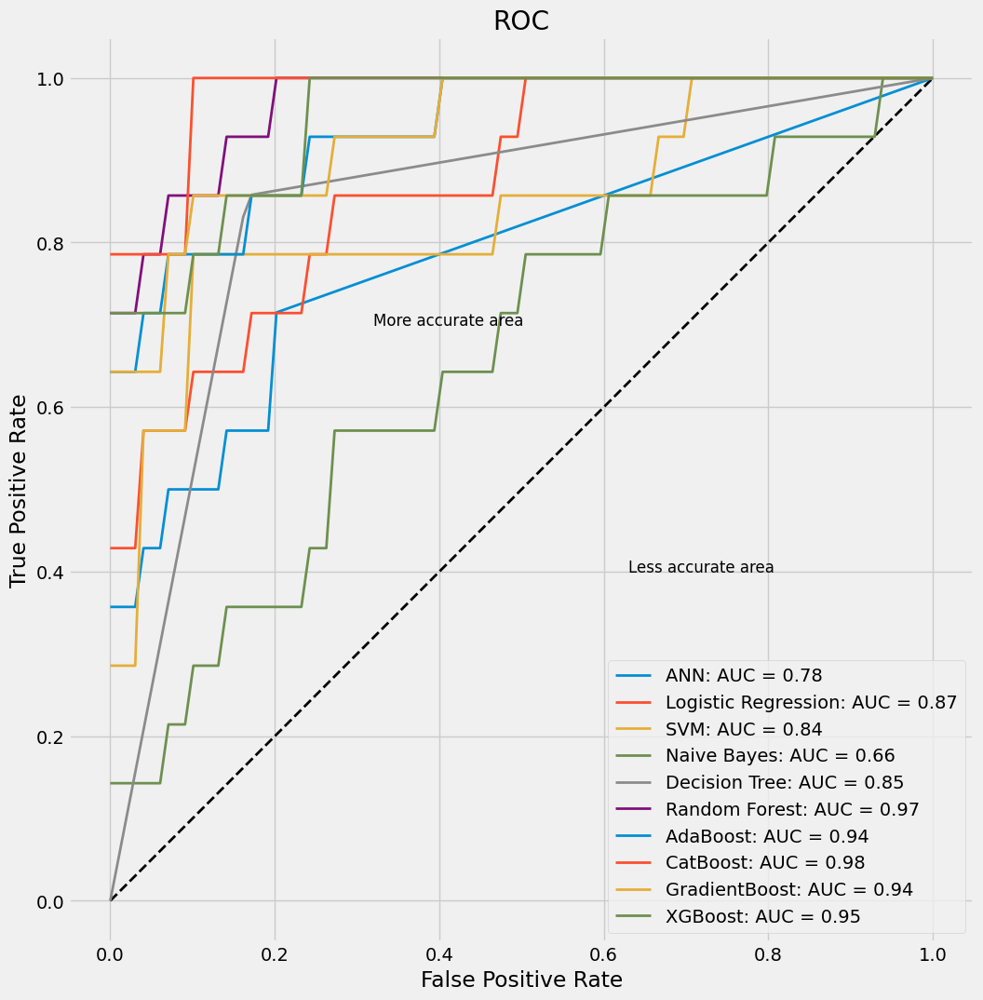

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.727273,0.571429,0.8,0.571429,0.571429,0.783481
Logistic Regression,0.818182,0.5,0.966667,0.875,0.636364,0.870851
SVM,0.795455,0.571429,0.9,0.727273,0.64,0.838384
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.65873
Decision Tree,0.840909,0.857143,0.833333,0.705882,0.774194,0.845175
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.968975
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.935426
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.979437
GradientBoost,0.840909,0.642857,0.933333,0.818182,0.72,0.936147
XGBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.949495


In [ ]:
new_df_LR_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_2080.csv')
result_LR_2080= k_fold_results(new_df_LR_2080[new_df_LR_2080.columns[:-1]],new_df_LR_2080[new_df_LR_2080.columns[-1]], create_models(new_df_LR_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_2080.T

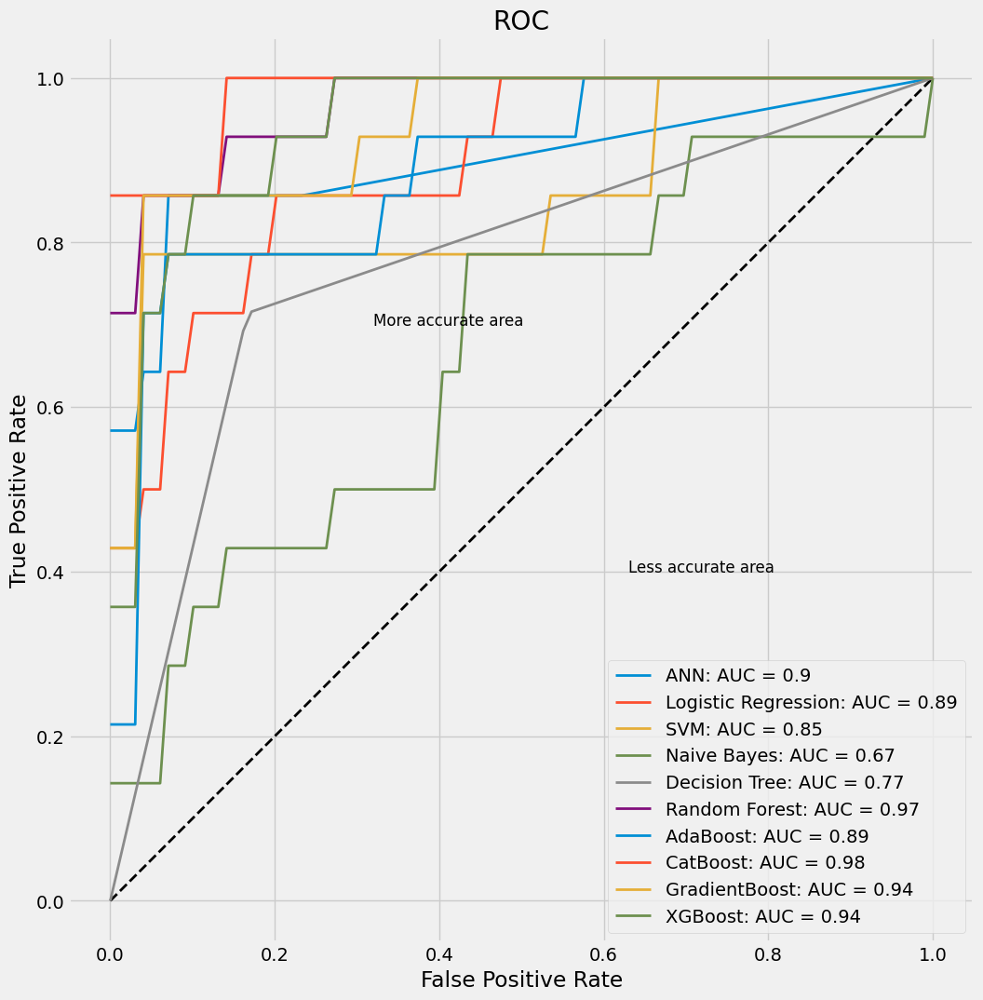

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.840909,0.642857,0.933333,0.818182,0.72,0.895311
Logistic Regression,0.795455,0.5,0.933333,0.777778,0.608696,0.891053
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.854978
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.66811
Decision Tree,0.795455,0.714286,0.833333,0.666667,0.689655,0.773759
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.966089
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.887085
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.980519
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.937229
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.942641


In [ ]:
new_df_LR_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_5050.csv')
result_LR_5050=k_fold_results(new_df_LR_5050[new_df_LR_5050.columns[:-1]],new_df_LR_5050[new_df_LR_5050.columns[-1]], create_models(new_df_LR_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_5050.T

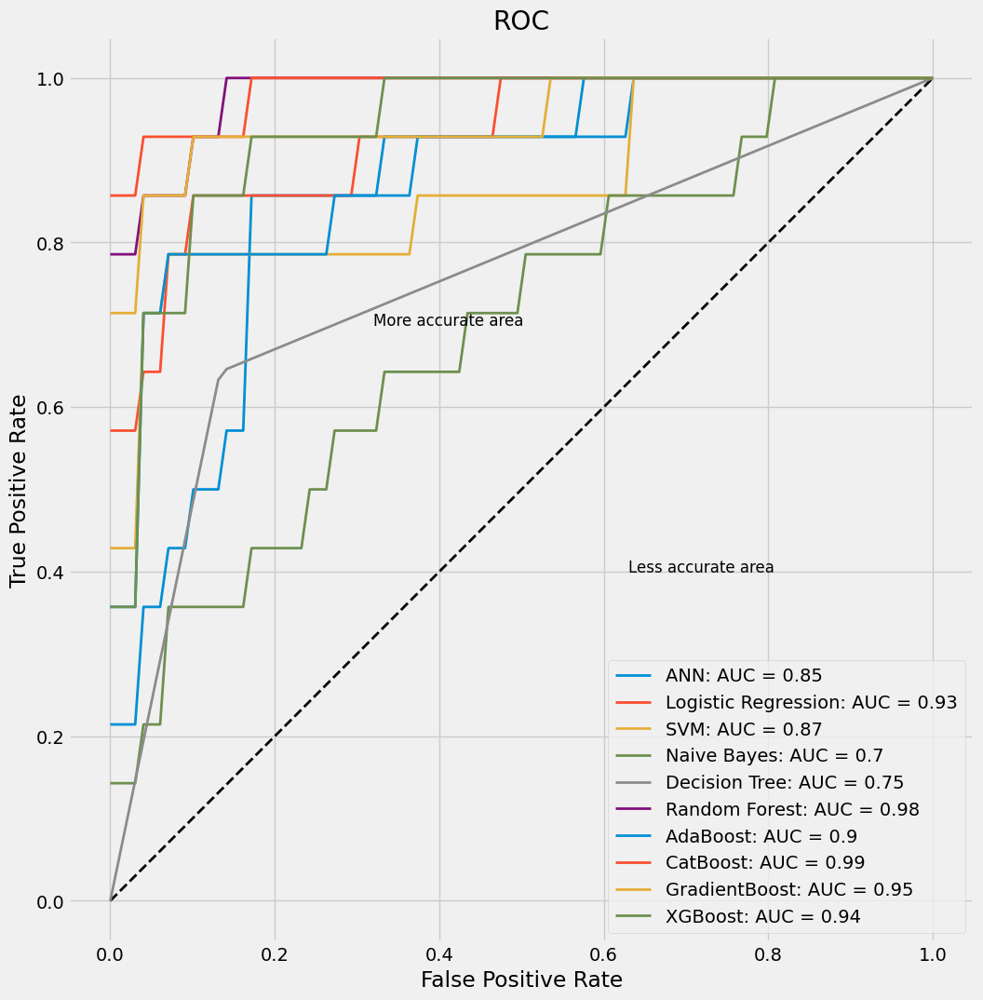

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.75,0.571429,0.833333,0.615385,0.592593,0.854618
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.926407
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.868687
Naive Bayes,0.727273,0.214286,0.966667,0.75,0.333333,0.695527
Decision Tree,0.795455,0.642857,0.866667,0.692308,0.666667,0.754726
Random Forest,0.909091,0.714286,1.0,1.0,0.833333,0.98088
AdaBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.899351
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.98557
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.950216
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.938312


In [ ]:
new_df_LR_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_8020.csv')
result_LR_8020=k_fold_results(new_df_LR_8020[new_df_LR_8020.columns[:-1]],new_df_LR_8020[new_df_LR_8020.columns[-1]], create_models(new_df_LR_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_8020.T

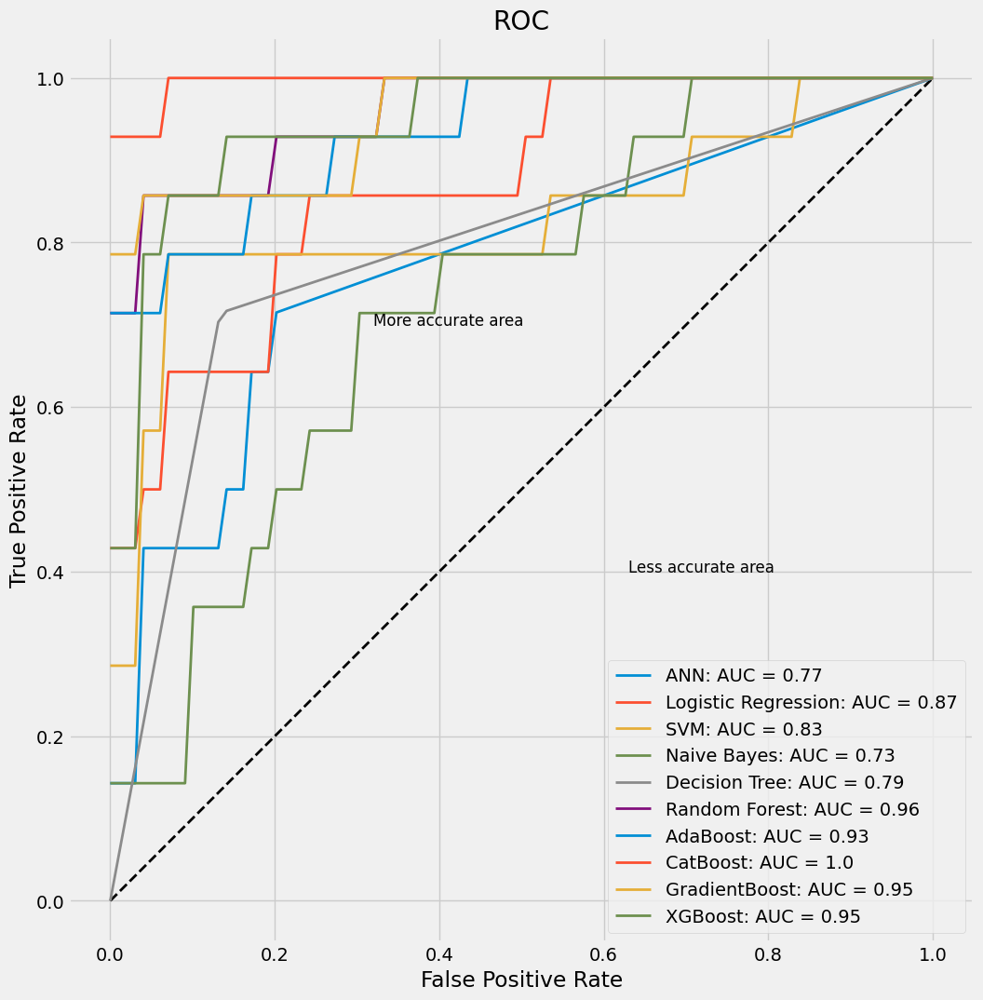

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.642857,0.833333,0.642857,0.642857,0.770854
Logistic Regression,0.818182,0.5,0.966667,0.875,0.636364,0.869408
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.828283
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.729437
Decision Tree,0.818182,0.714286,0.866667,0.714286,0.714286,0.790435
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.957431
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.933622
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99531
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.952742
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.946609


In [ ]:
new_df_LR_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_00100.csv')
result_LR_00100=k_fold_results(new_df_LR_00100[new_df_LR_00100.columns[:-1]],new_df_LR_00100[new_df_LR_00100.columns[-1]], create_models(new_df_LR_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_00100.T

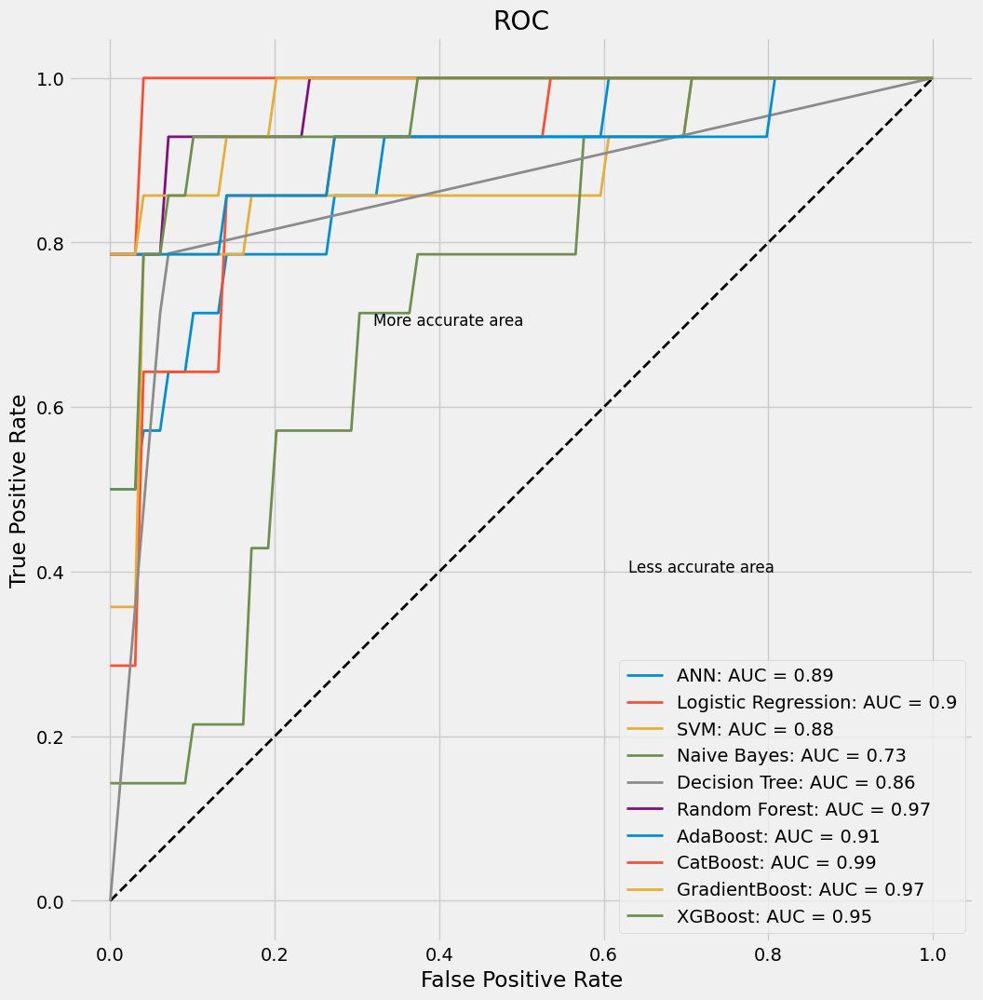

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.890693
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.901154
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.87987
Naive Bayes,0.681818,0.142857,0.933333,0.5,0.222222,0.728716
Decision Tree,0.886364,0.785714,0.933333,0.846154,0.814815,0.859382
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.973665
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.913781
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992424
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.973665
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.95202


In [ ]:
new_df_SVM_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_10000.csv')
result_SVM_10000=k_fold_results(new_df_SVM_10000[new_df_SVM_10000.columns[:-1]],new_df_SVM_10000[new_df_SVM_10000.columns[-1]], create_models(new_df_SVM_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_10000.T

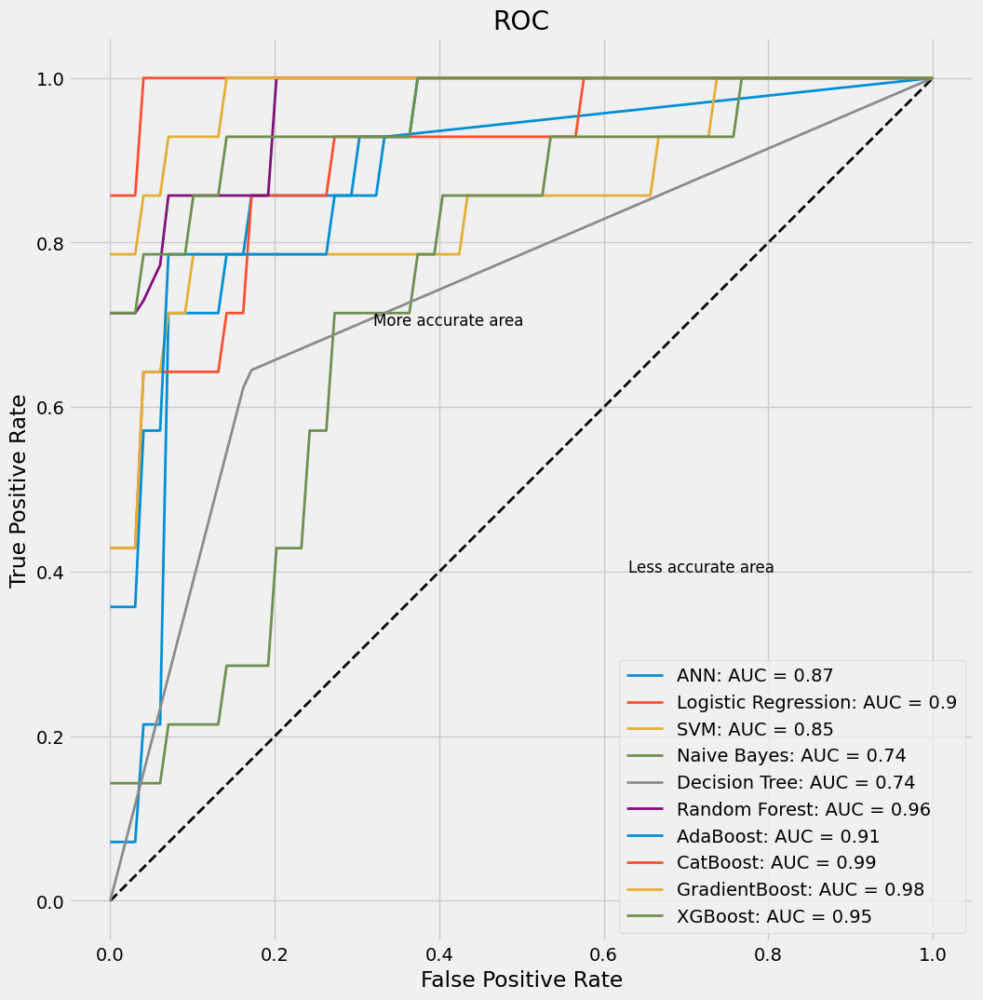

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.869408
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.89899
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.850649
Naive Bayes,0.681818,0.142857,0.933333,0.5,0.222222,0.738095
Decision Tree,0.772727,0.642857,0.833333,0.642857,0.642857,0.738052
Random Forest,0.886364,0.785714,0.933333,0.846154,0.814815,0.963597
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.911616
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.983045
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.954545


In [ ]:
new_df_SVM_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_2080.csv')
result_SVM_2080= k_fold_results(new_df_SVM_2080[new_df_SVM_2080.columns[:-1]],new_df_SVM_2080[new_df_SVM_2080.columns[-1]], create_models(new_df_SVM_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_2080.T

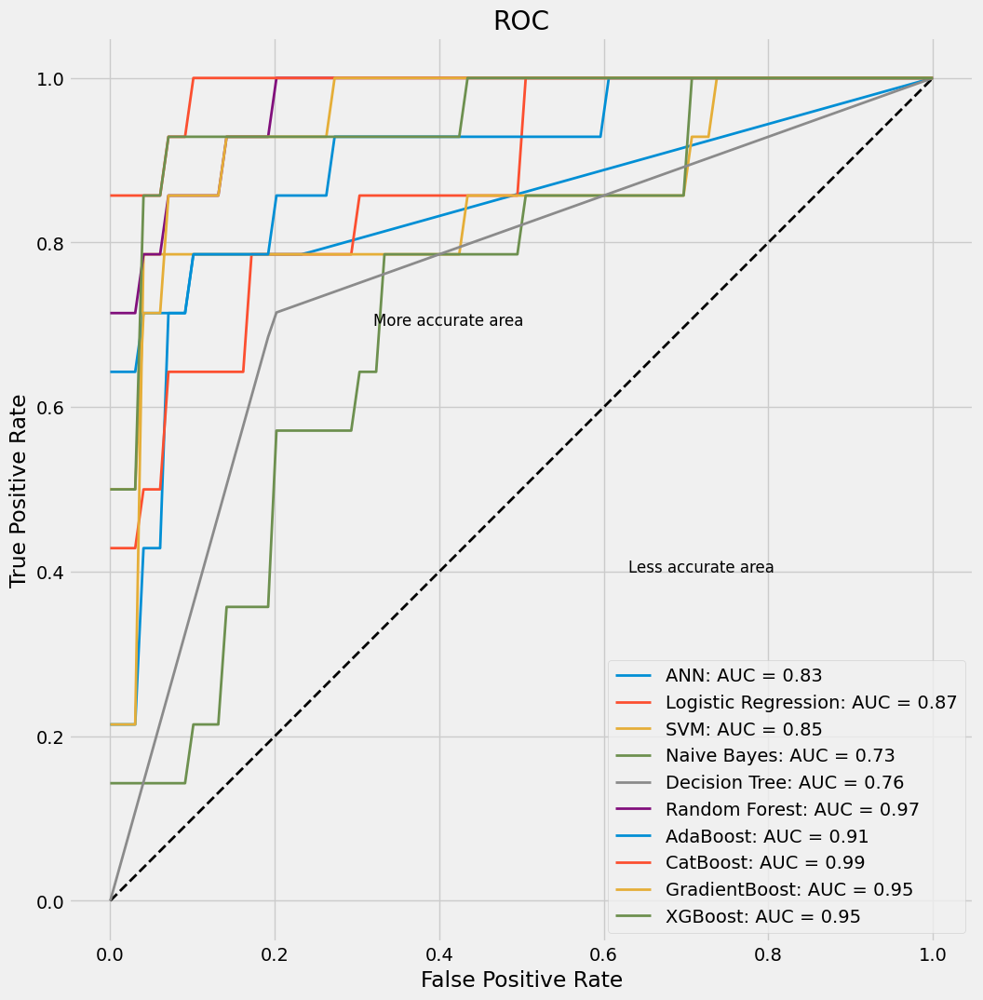

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.840909,0.714286,0.9,0.769231,0.740741,0.834669
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.871573
SVM,0.886364,0.714286,0.966667,0.909091,0.8,0.846681
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.727273
Decision Tree,0.772727,0.714286,0.8,0.625,0.666667,0.757117
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.968975
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.914502
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.988456
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.954185
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.95202


In [ ]:
new_df_SVM_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_5050.csv')
result_SVM_5050=k_fold_results(new_df_SVM_5050[new_df_SVM_5050.columns[:-1]],new_df_SVM_5050[new_df_SVM_5050.columns[-1]], create_models(new_df_SVM_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_5050.T

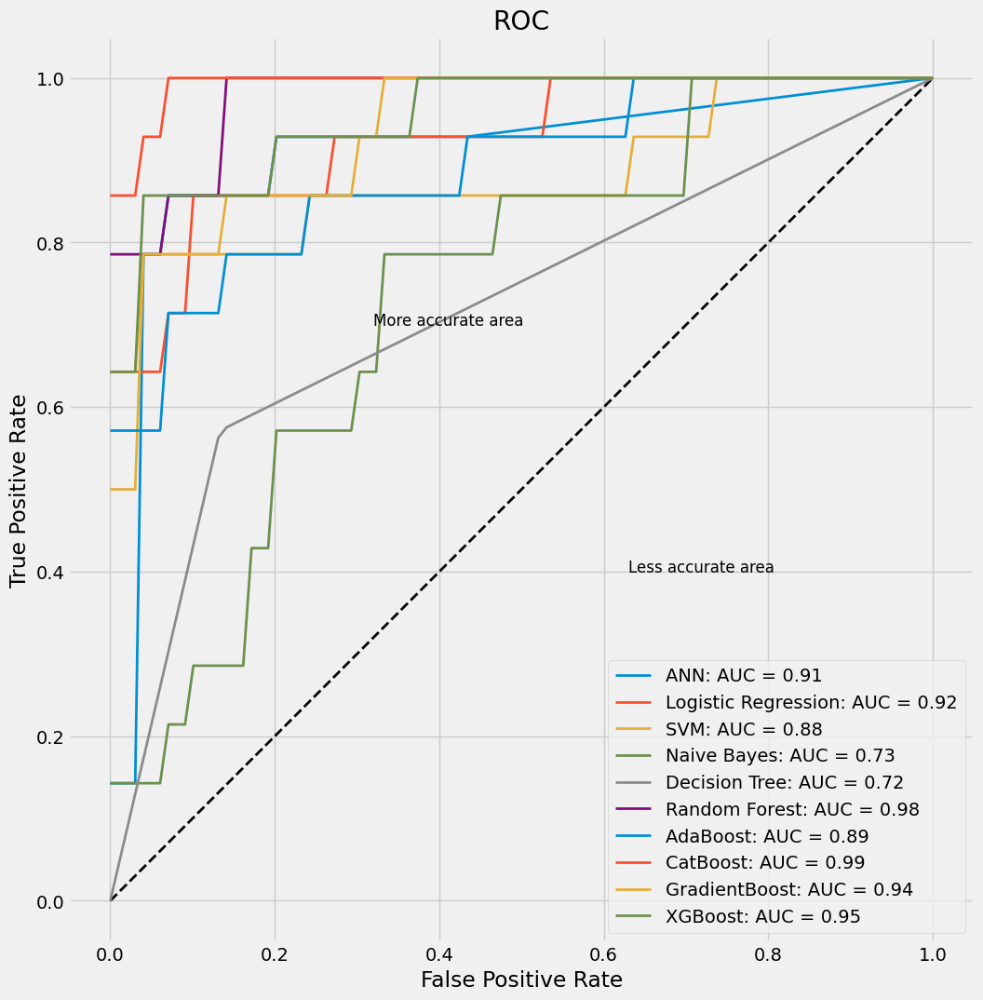

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.886364,0.714286,0.966667,0.909091,0.8,0.907324
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.924603
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.875541
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.734488
Decision Tree,0.772727,0.571429,0.866667,0.666667,0.615385,0.719017
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97583
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.888167
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.863636,0.642857,0.966667,0.9,0.75,0.940476
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.95202


In [ ]:
new_df_SVM_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_8020.csv')
result_SVM_8020=k_fold_results(new_df_SVM_8020[new_df_SVM_8020.columns[:-1]],new_df_SVM_8020[new_df_SVM_8020.columns[-1]], create_models(new_df_SVM_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_8020.T

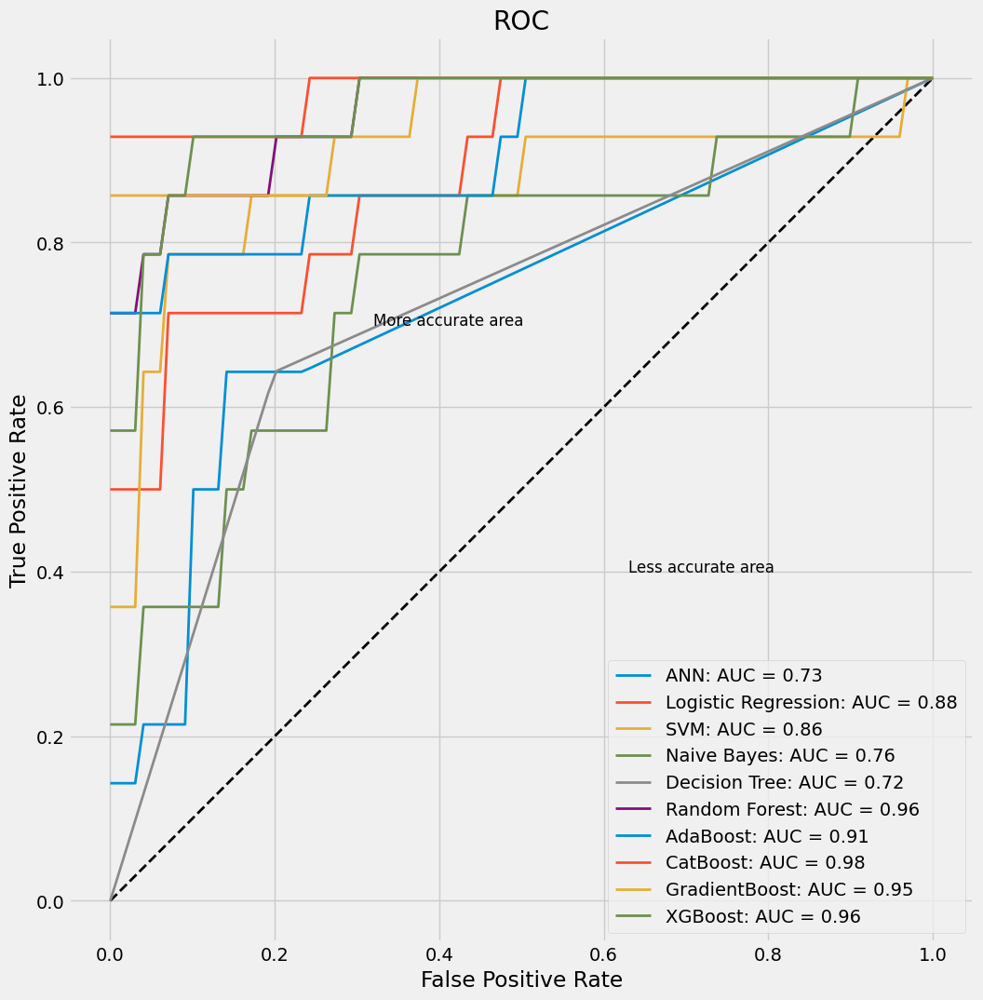

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.75,0.428571,0.9,0.666667,0.521739,0.730341
Logistic Regression,0.795455,0.5,0.933333,0.777778,0.608696,0.883478
SVM,0.818182,0.5,0.966667,0.875,0.636364,0.863997
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.756494
Decision Tree,0.75,0.642857,0.8,0.6,0.62069,0.721406
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.957431
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.909091
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.983045
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.954545
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.959596


In [ ]:
new_df_SVM_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_00100.csv')
result_SVM_00100=k_fold_results(new_df_SVM_00100[new_df_SVM_00100.columns[:-1]],new_df_SVM_00100[new_df_SVM_00100.columns[-1]], create_models(new_df_SVM_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_00100.T

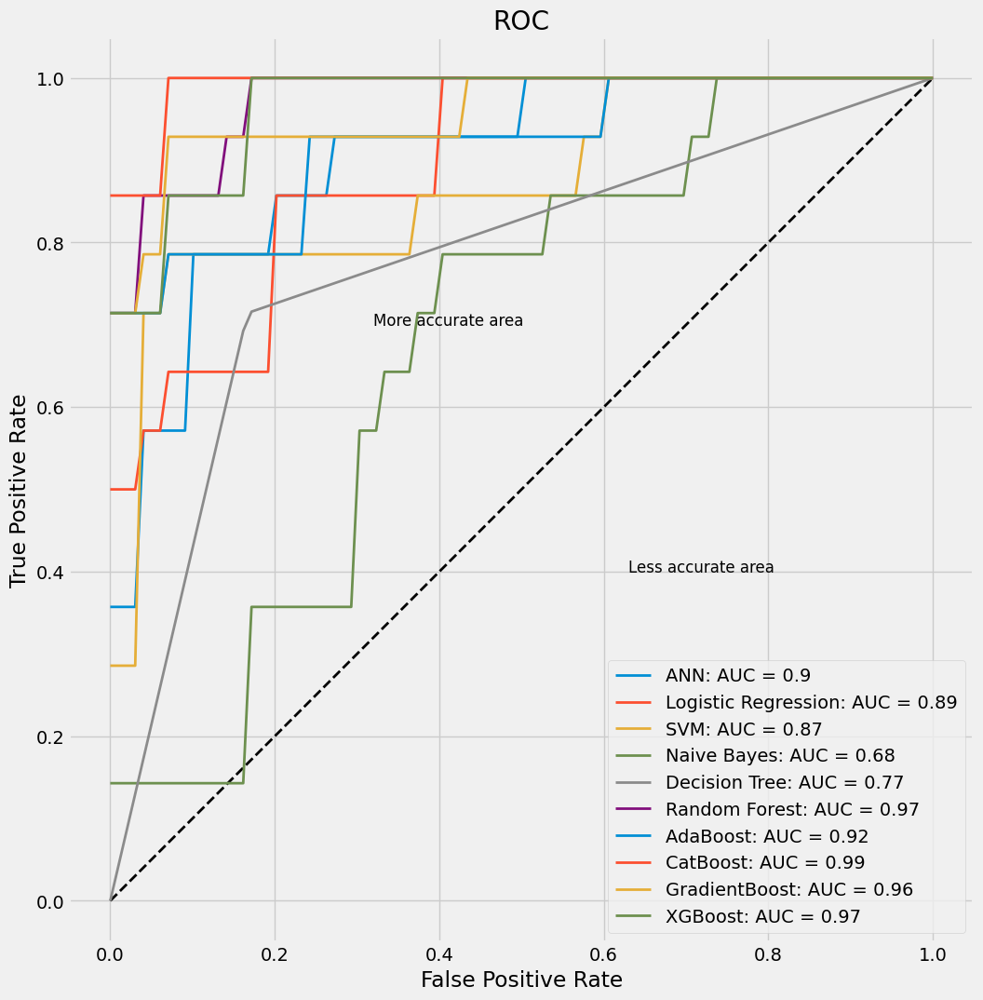

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.571429,0.9,0.727273,0.64,0.902958
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.893579
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.87013
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.681818
Decision Tree,0.795455,0.714286,0.833333,0.666667,0.689655,0.773759
Random Forest,0.909091,0.714286,1.0,1.0,0.833333,0.973304
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.91847
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.886364,0.642857,1.0,1.0,0.782609,0.957431
XGBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.966811


In [ ]:
new_df_NB_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_10000.csv')
result_NB_10000=k_fold_results(new_df_NB_10000[new_df_NB_10000.columns[:-1]],new_df_NB_10000[new_df_NB_10000.columns[-1]], create_models(new_df_NB_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_10000.T

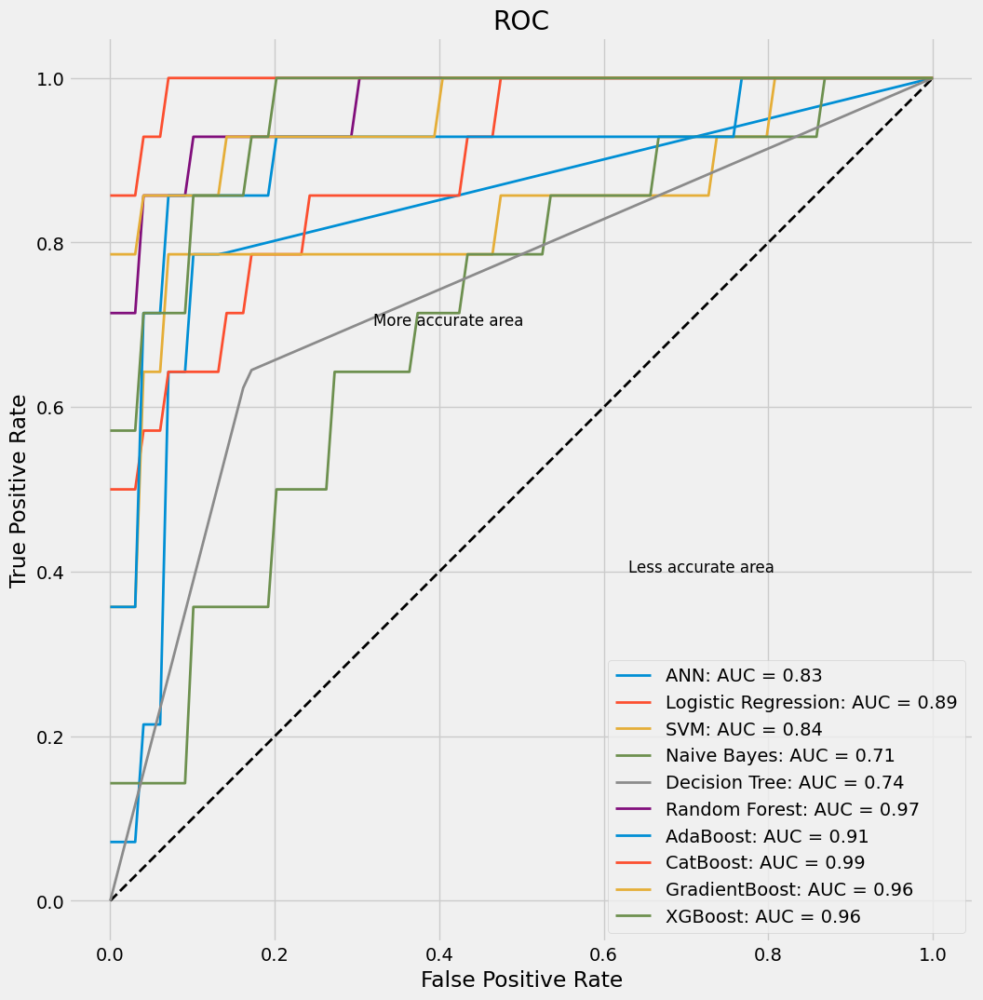

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.5,0.933333,0.777778,0.608696,0.831676
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.889971
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.837302
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.709235
Decision Tree,0.772727,0.642857,0.833333,0.642857,0.642857,0.738052
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.966811
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.909452
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.959235
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.955267


In [ ]:
new_df_NB_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_2080.csv')
result_NB_2080= k_fold_results(new_df_NB_2080[new_df_NB_2080.columns[:-1]],new_df_NB_2080[new_df_NB_2080.columns[-1]], create_models(new_df_NB_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_2080.T

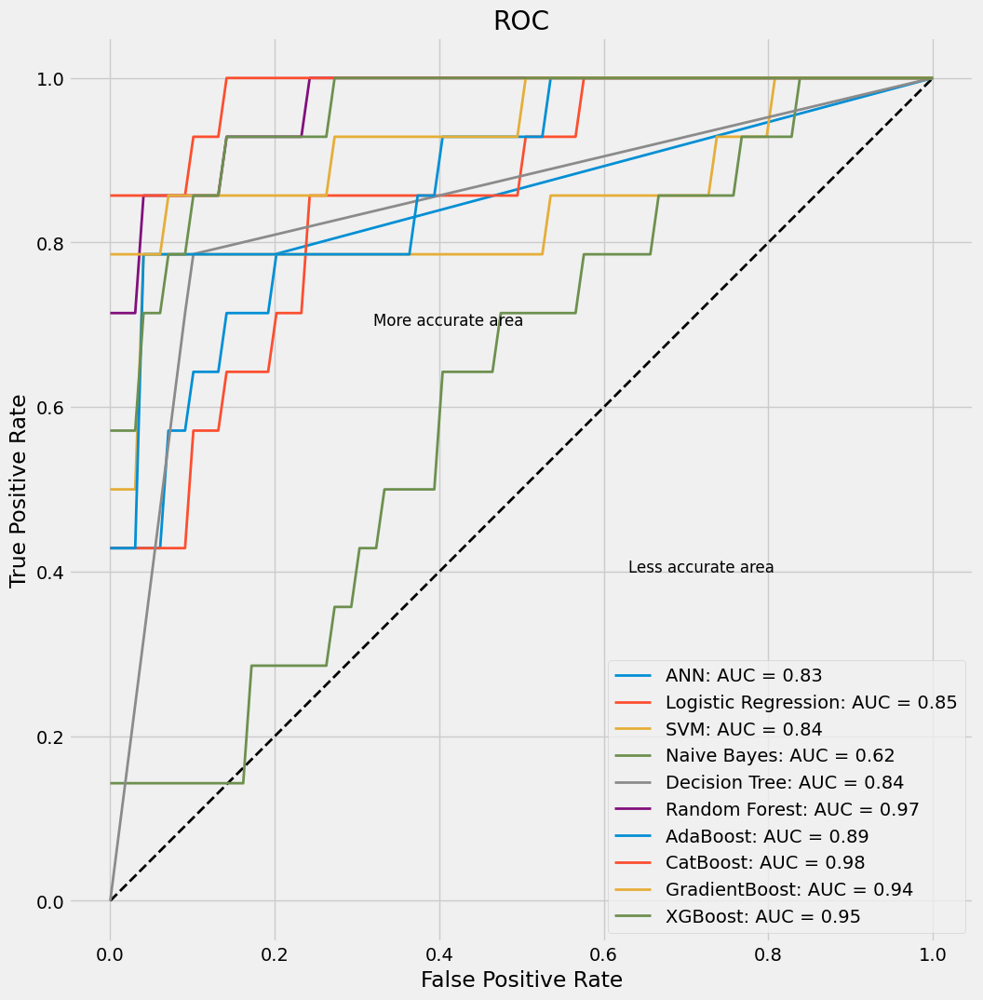

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.571429,0.9,0.727273,0.64,0.831387
Logistic Regression,0.772727,0.5,0.9,0.7,0.583333,0.852092
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.842352
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.619769
Decision Tree,0.863636,0.785714,0.9,0.785714,0.785714,0.842822
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.968254
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.894661
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.983405
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.940476
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.954545


In [ ]:
new_df_NB_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_5050.csv')
result_NB_5050=k_fold_results(new_df_NB_5050[new_df_NB_5050.columns[:-1]],new_df_NB_5050[new_df_NB_5050.columns[-1]], create_models(new_df_NB_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_5050.T

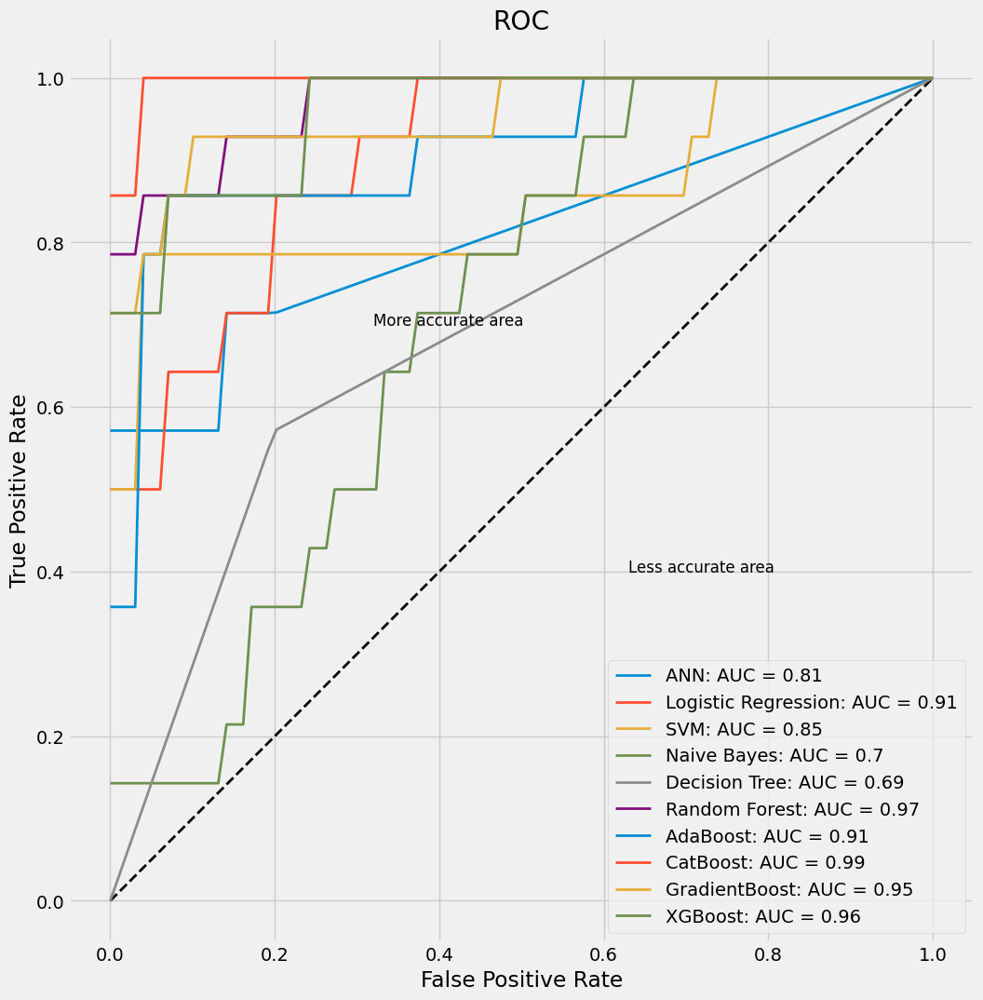

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.642857,0.866667,0.692308,0.666667,0.809094
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.905123
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.851732
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.704906
Decision Tree,0.727273,0.571429,0.8,0.571429,0.571429,0.685695
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.970779
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.913059
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.952381
XGBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.95671


In [ ]:
new_df_NB_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_8020.csv')
result_NB_8020=k_fold_results(new_df_NB_8020[new_df_NB_8020.columns[:-1]],new_df_NB_8020[new_df_NB_8020.columns[-1]], create_models(new_df_NB_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_8020.T

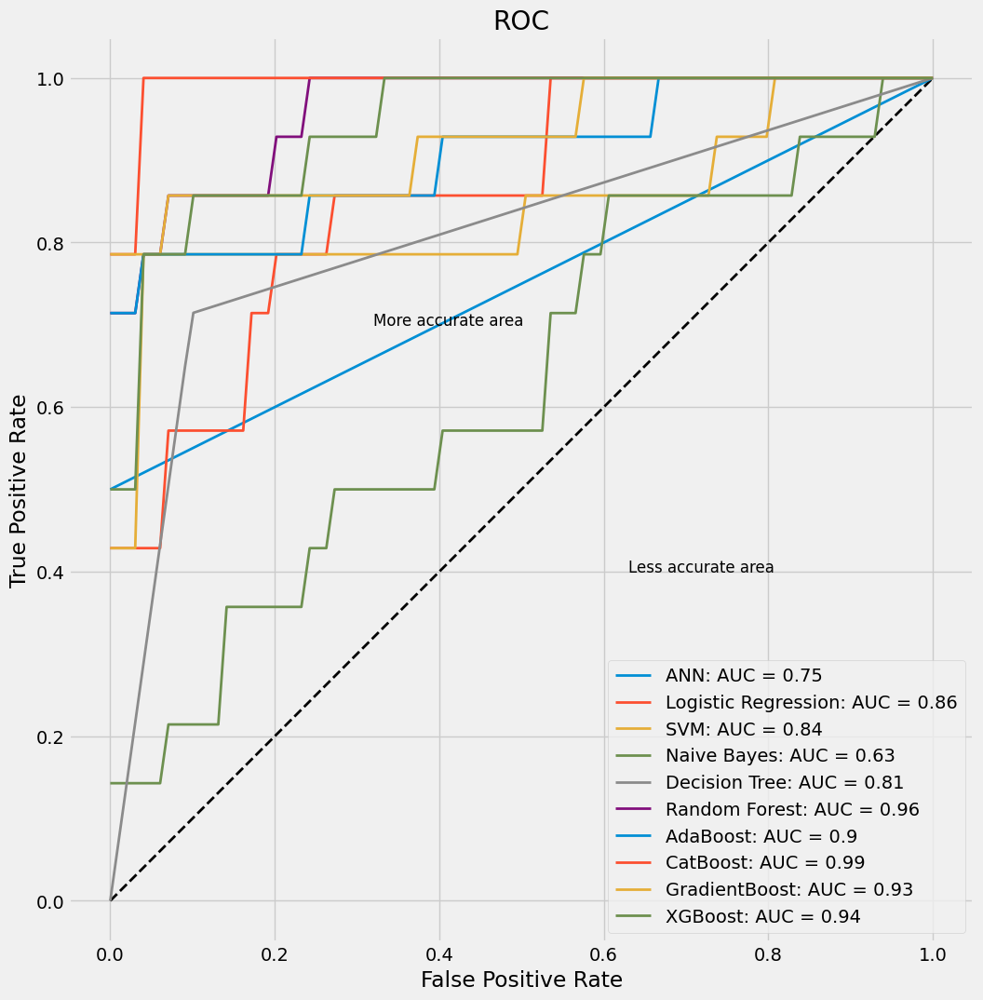

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.840909,0.5,1.0,1.0,0.666667,0.75
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.857864
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.841991
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.625541
Decision Tree,0.840909,0.714286,0.9,0.769231,0.740741,0.807112
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.96176
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.904762
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992424
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.928211
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.942641


In [ ]:
new_df_NB_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_00100.csv')
result_NB_00100=k_fold_results(new_df_NB_00100[new_df_NB_00100.columns[:-1]],new_df_NB_00100[new_df_NB_00100.columns[-1]], create_models(new_df_NB_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_00100.T

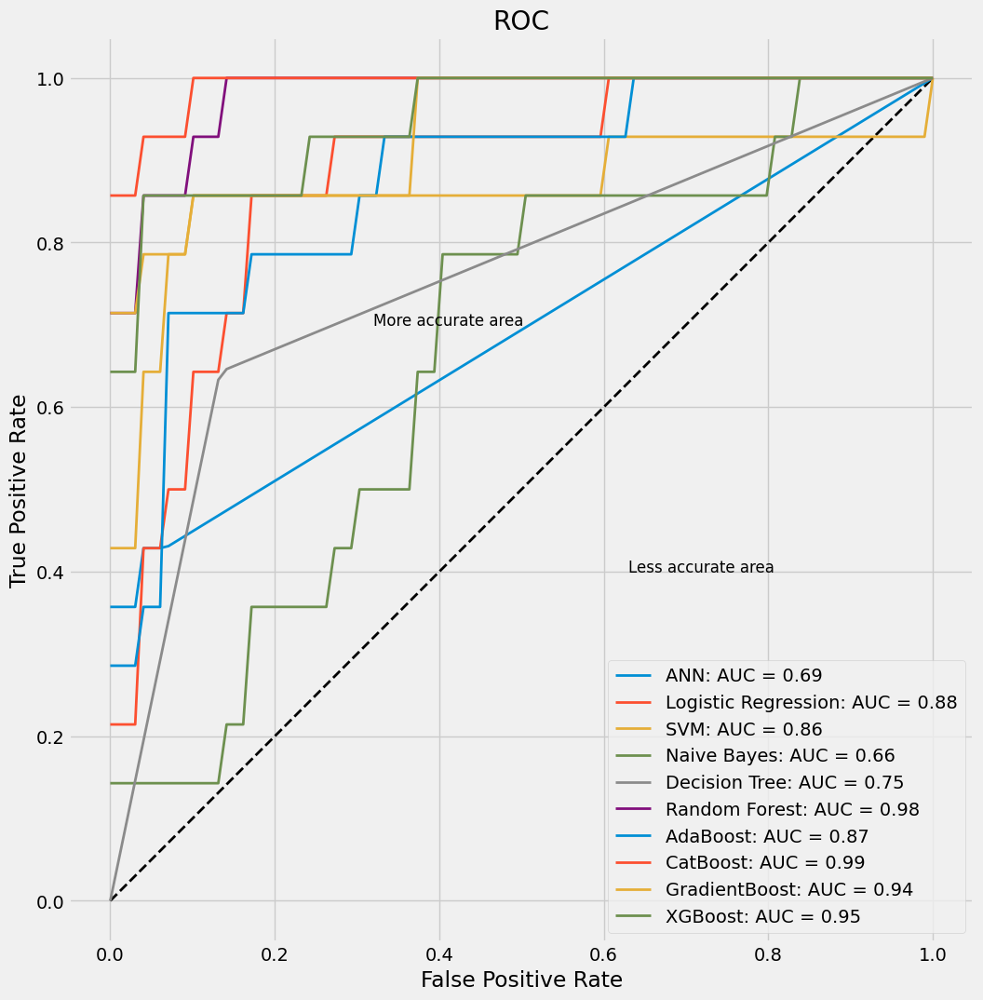

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.428571,0.933333,0.75,0.545455,0.69272
Logistic Regression,0.772727,0.5,0.9,0.7,0.583333,0.878427
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.862193
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.663781
Decision Tree,0.795455,0.642857,0.866667,0.692308,0.666667,0.754726
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.978355
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.872294
CatBoost,0.909091,0.714286,1.0,1.0,0.833333,0.99062
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.937951
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.949134


In [ ]:
new_df_DT_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_DT_10000.csv')
result_DT_10000=k_fold_results(new_df_DT_10000[new_df_DT_10000.columns[:-1]],new_df_DT_10000[new_df_DT_10000.columns[-1]], create_models(new_df_DT_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_DT_10000.T

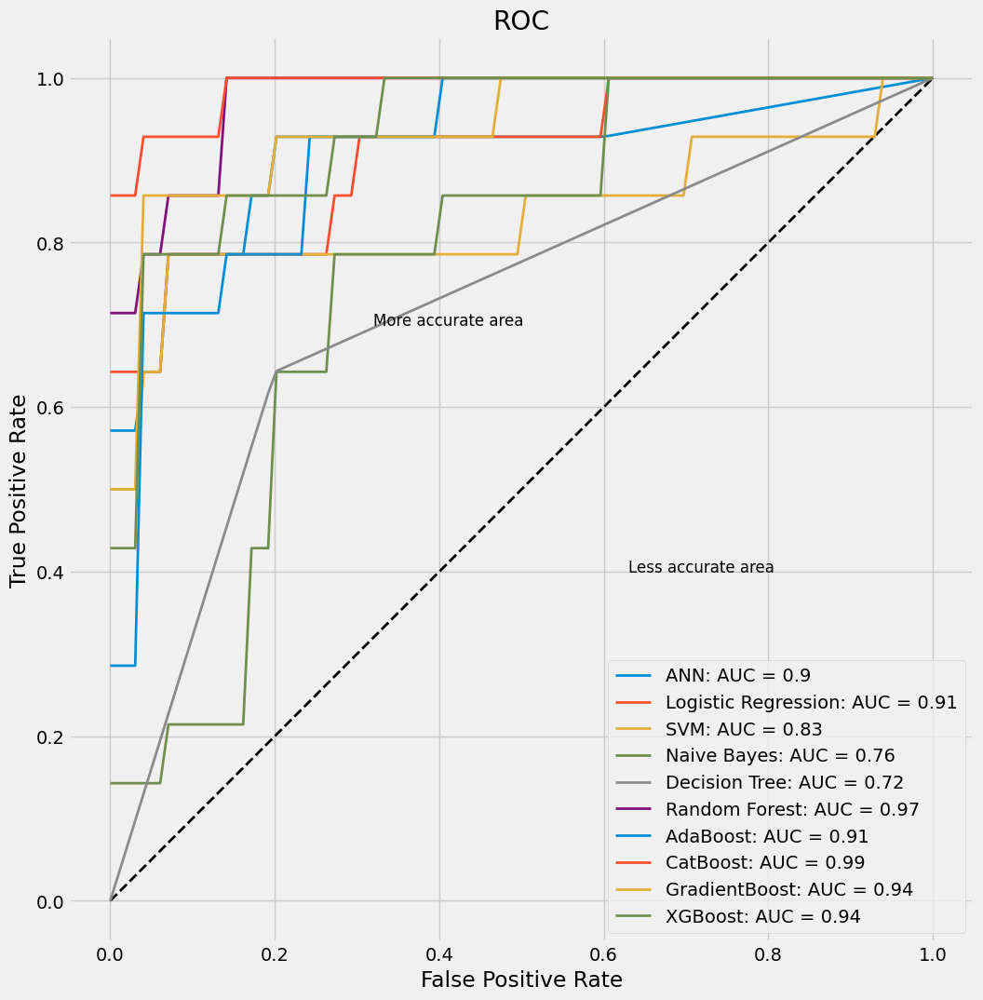

In [ ]:
new_df_DT_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_DT_2080.csv')
result_DT_2080= k_fold_results(new_df_DT_2080[new_df_DT_2080.columns[:-1]],new_df_DT_2080[new_df_DT_2080.columns[-1]], create_models(new_df_DT_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_DT_2080.T

In [ ]:
new_df_DT_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_DT_5050.csv')
result_DT_5050=k_fold_results(new_df_DT_5050[new_df_DT_5050.columns[:-1]],new_df_DT_5050[new_df_DT_5050.columns[-1]], create_models(new_df_DT_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_DT_5050.T

In [ ]:
new_df_DT_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_DT_8020.csv')
result_DT_8020=k_fold_results(new_df_DT_8020[new_df_DT_8020.columns[:-1]],new_df_DT_8020[new_df_DT_8020.columns[-1]], create_models(new_df_DT_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_DT_8020.T

In [ ]:
new_df_DT_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_DT_00100.csv')
result_DT_00100=k_fold_results(new_df_DT_00100[new_df_DT_00100.columns[:-1]],new_df_DT_00100[new_df_DT_00100.columns[-1]], create_models(new_df_DT_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_DT_00100.T

In [ ]:
new_df_RF_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_10000.csv')
result_RF_10000=k_fold_results(new_df_RF_10000[new_df_RF_10000.columns[:-1]],new_df_RF_10000[new_df_RF_10000.columns[-1]], create_models(new_df_RF_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_10000.T

In [ ]:
new_df_RF_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_2080.csv')
result_RF_2080= k_fold_results(new_df_RF_2080[new_df_RF_2080.columns[:-1]],new_df_RF_2080[new_df_RF_2080.columns[-1]], create_models(new_df_RF_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_2080.T

In [ ]:
new_df_RF_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_5050.csv')
result_RF_5050=k_fold_results(new_df_RF_5050[new_df_RF_5050.columns[:-1]],new_df_RF_5050[new_df_RF_5050.columns[-1]], create_models(new_df_RF_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_5050.T

In [ ]:
new_df_RF_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_8020.csv')
result_RF_8020=k_fold_results(new_df_RF_8020[new_df_RF_8020.columns[:-1]],new_df_RF_8020[new_df_RF_8020.columns[-1]], create_models(new_df_RF_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_8020.T

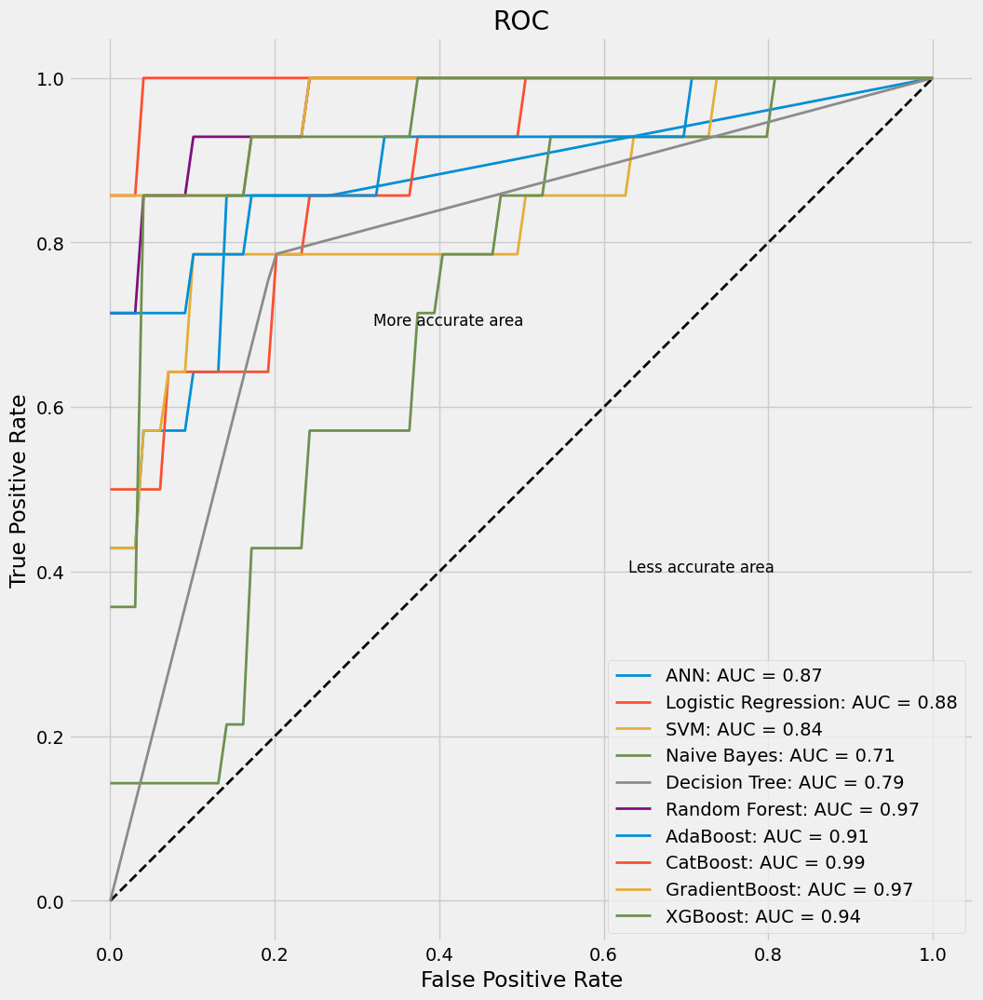

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.428571,0.966667,0.857143,0.571429,0.868401
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.883478
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.843434
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.710678
Decision Tree,0.795455,0.785714,0.8,0.647059,0.709677,0.792827
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.97114
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.907648
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.97114
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.944084


In [ ]:
new_df_RF_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_00100.csv')
result_RF_00100=k_fold_results(new_df_RF_00100[new_df_RF_00100.columns[:-1]],new_df_RF_00100[new_df_RF_00100.columns[-1]], create_models(new_df_RF_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_00100.T

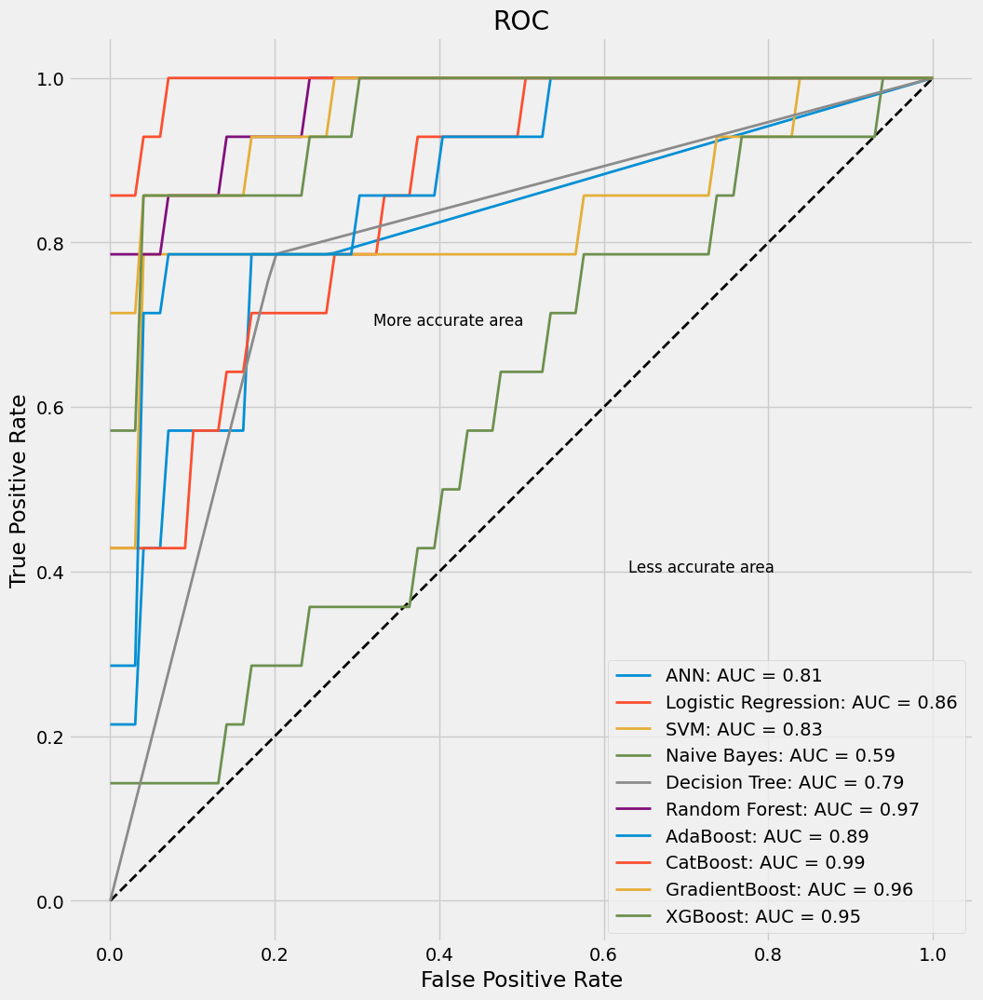

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.5,0.933333,0.777778,0.608696,0.81162
Logistic Regression,0.772727,0.5,0.9,0.7,0.583333,0.860029
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.834776
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.590188
Decision Tree,0.795455,0.785714,0.8,0.647059,0.709677,0.792827
Random Forest,0.886364,0.785714,0.933333,0.846154,0.814815,0.968615
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.892496
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.963925
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.951659


In [ ]:
new_df_Ada_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_Ada_10000.csv')
result_Ada_10000=k_fold_results(new_df_Ada_10000[new_df_Ada_10000.columns[:-1]],new_df_Ada_10000[new_df_Ada_10000.columns[-1]], create_models(new_df_Ada_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_10000.T

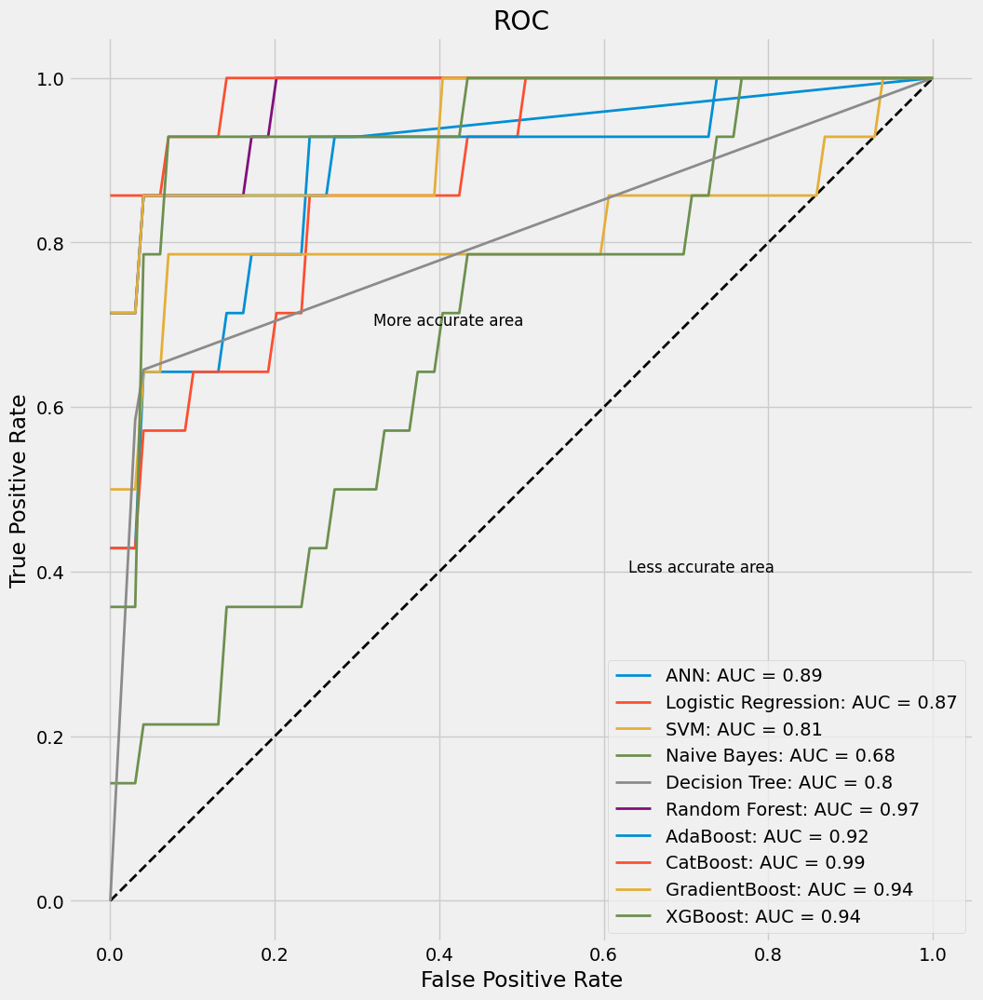

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.840909,0.642857,0.933333,0.818182,0.72,0.890441
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.873737
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.814214
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.676046
Decision Tree,0.863636,0.642857,0.966667,0.9,0.75,0.804559
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.968975
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.923521
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.98557
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.937951
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.944805


In [ ]:
new_df_Ada_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_Ada_2080.csv')
result_Ada_2080= k_fold_results(new_df_Ada_2080[new_df_Ada_2080.columns[:-1]],new_df_Ada_2080[new_df_Ada_2080.columns[-1]], create_models(new_df_Ada_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_2080.T

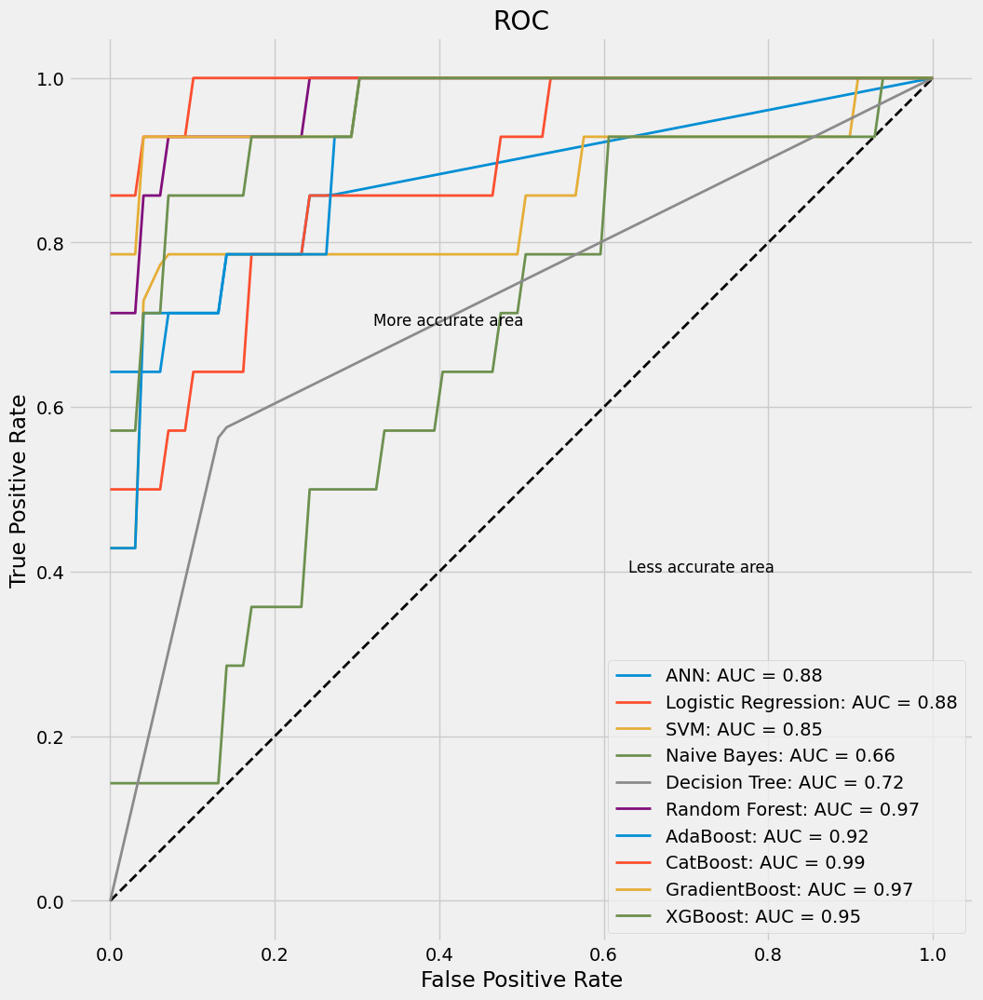

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.863636,0.571429,1.0,1.0,0.727273,0.878141
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.876263
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.845271
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.660895
Decision Tree,0.772727,0.571429,0.866667,0.666667,0.615385,0.719017
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.973304
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.920635
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.973665
XGBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.952381


In [ ]:
new_df_Ada_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_Ada_5050.csv')
result_Ada_5050=k_fold_results(new_df_Ada_5050[new_df_Ada_5050.columns[:-1]],new_df_Ada_5050[new_df_Ada_5050.columns[-1]], create_models(new_df_Ada_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_5050.T

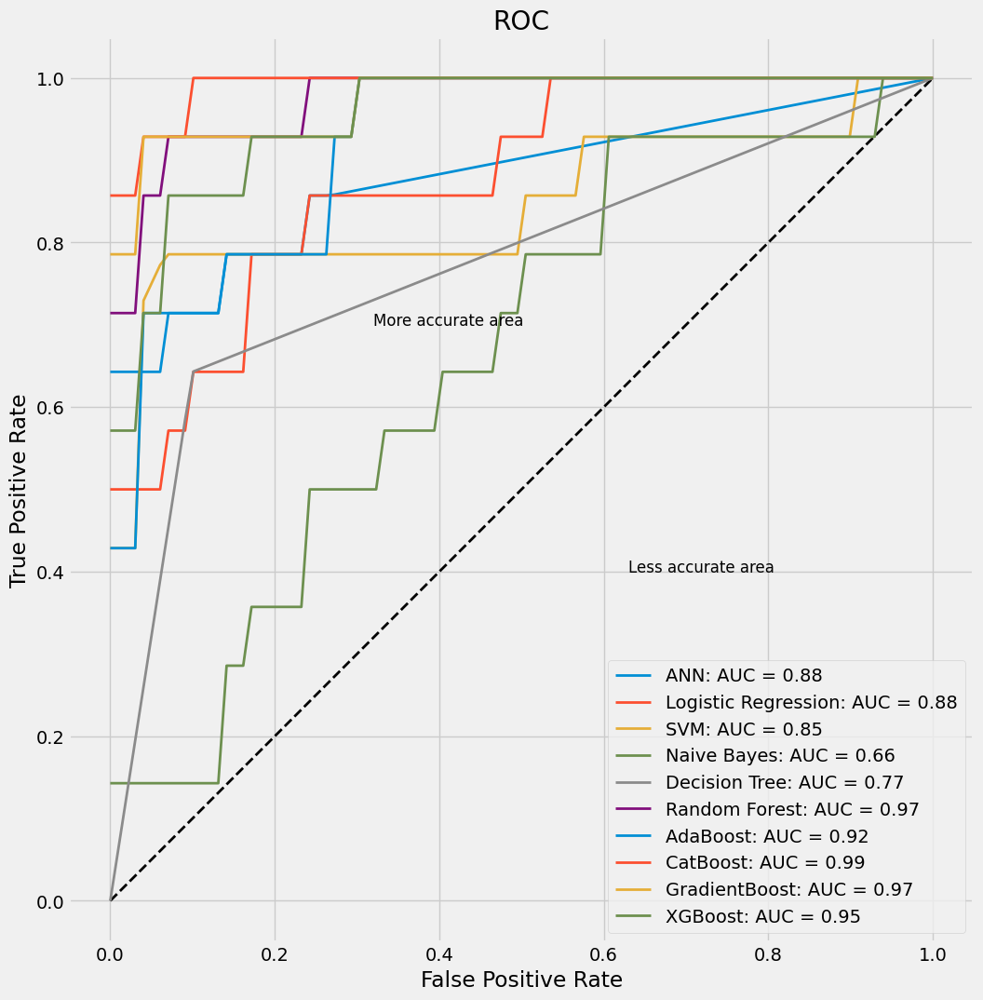

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.863636,0.571429,1.0,1.0,0.727273,0.878141
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.876263
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.845271
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.660895
Decision Tree,0.818182,0.642857,0.9,0.75,0.692308,0.771401
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.973304
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.920635
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.973665
XGBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.952381


In [ ]:
result_Ada_5050=k_fold_results(new_df_Ada_5050[new_df_Ada_5050.columns[:-1]],new_df_Ada_5050[new_df_Ada_5050.columns[-1]], create_models(new_df_Ada_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_5050.T

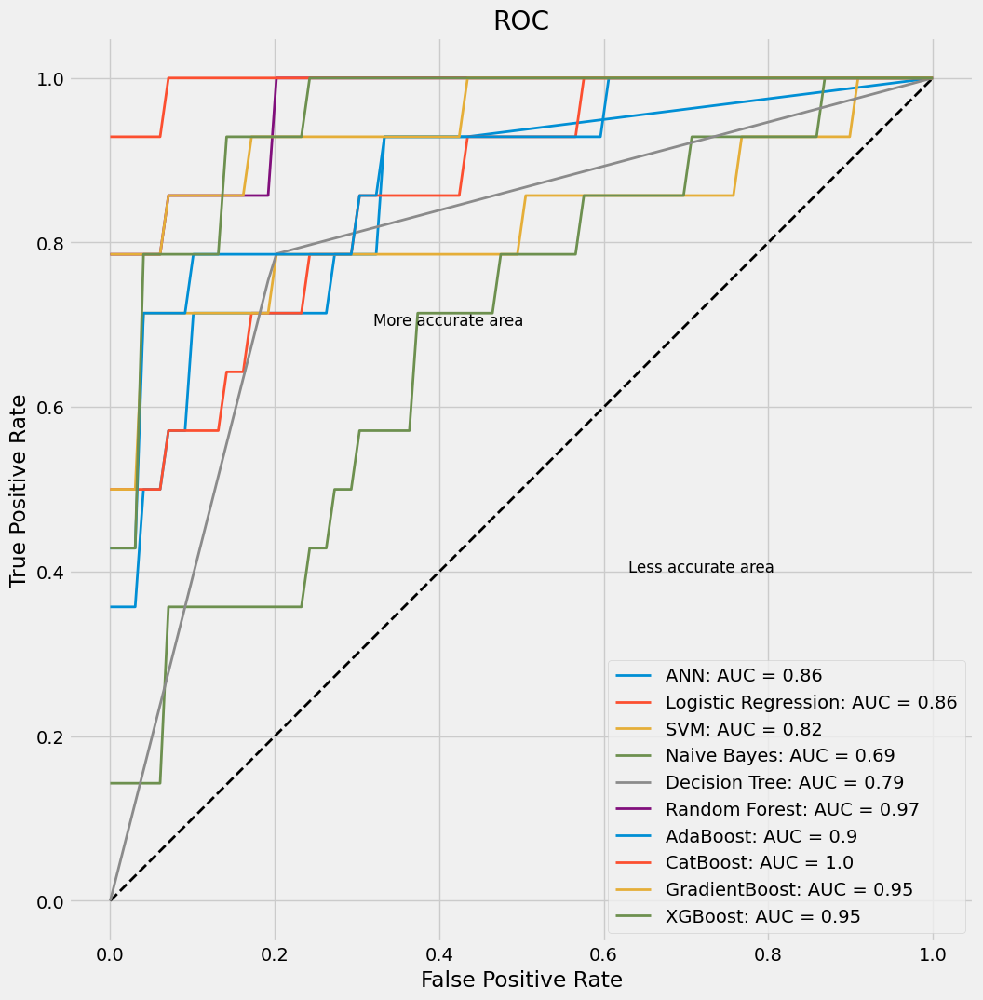

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.5,0.966667,0.875,0.636364,0.859344
Logistic Regression,0.818182,0.5,0.966667,0.875,0.636364,0.863997
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.823593
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.689755
Decision Tree,0.795455,0.785714,0.8,0.647059,0.709677,0.792827
Random Forest,0.886364,0.785714,0.933333,0.846154,0.814815,0.967172
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.895382
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99531
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.952742
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.950938


In [ ]:
new_df_Ada_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_Ada_8020.csv')
result_Ada_8020=k_fold_results(new_df_Ada_8020[new_df_Ada_8020.columns[:-1]],new_df_Ada_8020[new_df_Ada_8020.columns[-1]], create_models(new_df_Ada_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_8020.T

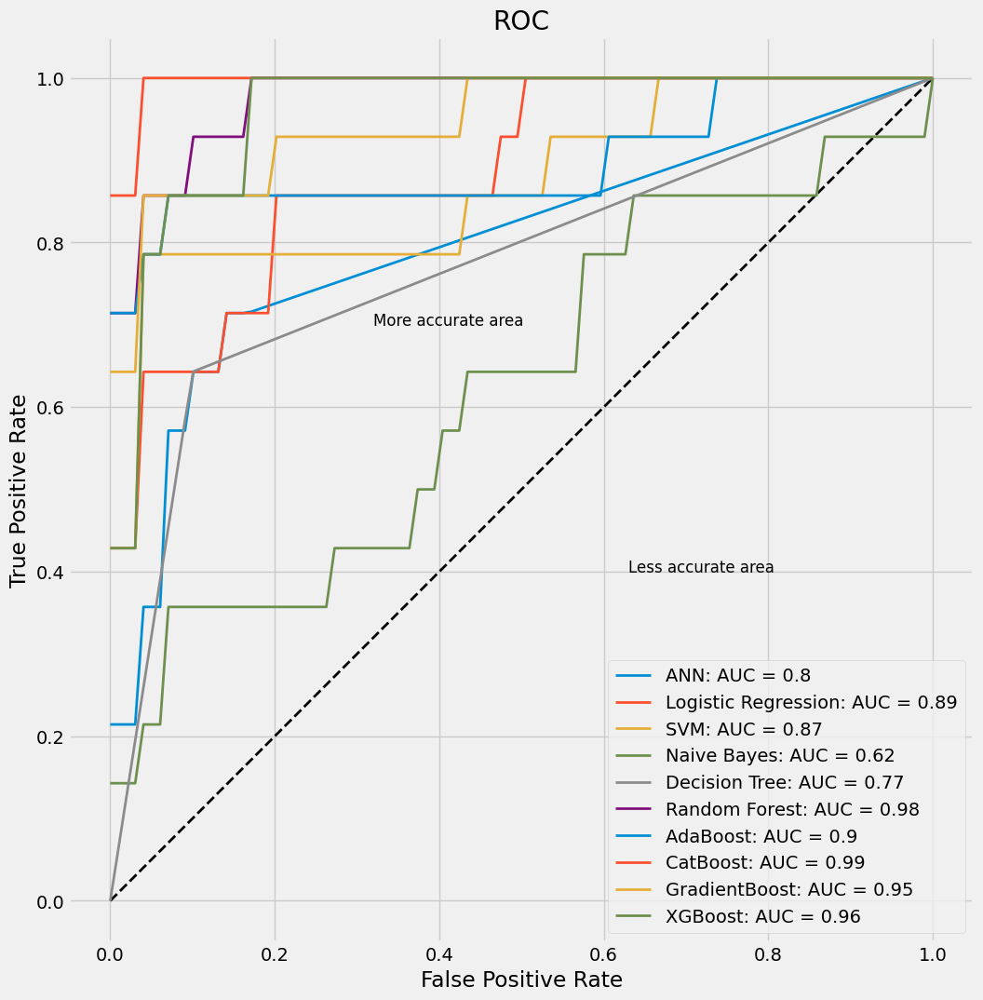

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.797623
Logistic Regression,0.818182,0.5,0.966667,0.875,0.636364,0.885281
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.871573
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.624098
Decision Tree,0.818182,0.642857,0.9,0.75,0.692308,0.771401
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.97619
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.897547
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.947691
XGBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.958874


In [ ]:
new_df_Ada_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_Ada_00100.csv')
result_Ada_00100=k_fold_results(new_df_Ada_00100[new_df_Ada_00100.columns[:-1]],new_df_Ada_00100[new_df_Ada_00100.columns[-1]], create_models(new_df_Ada_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Ada_00100.T

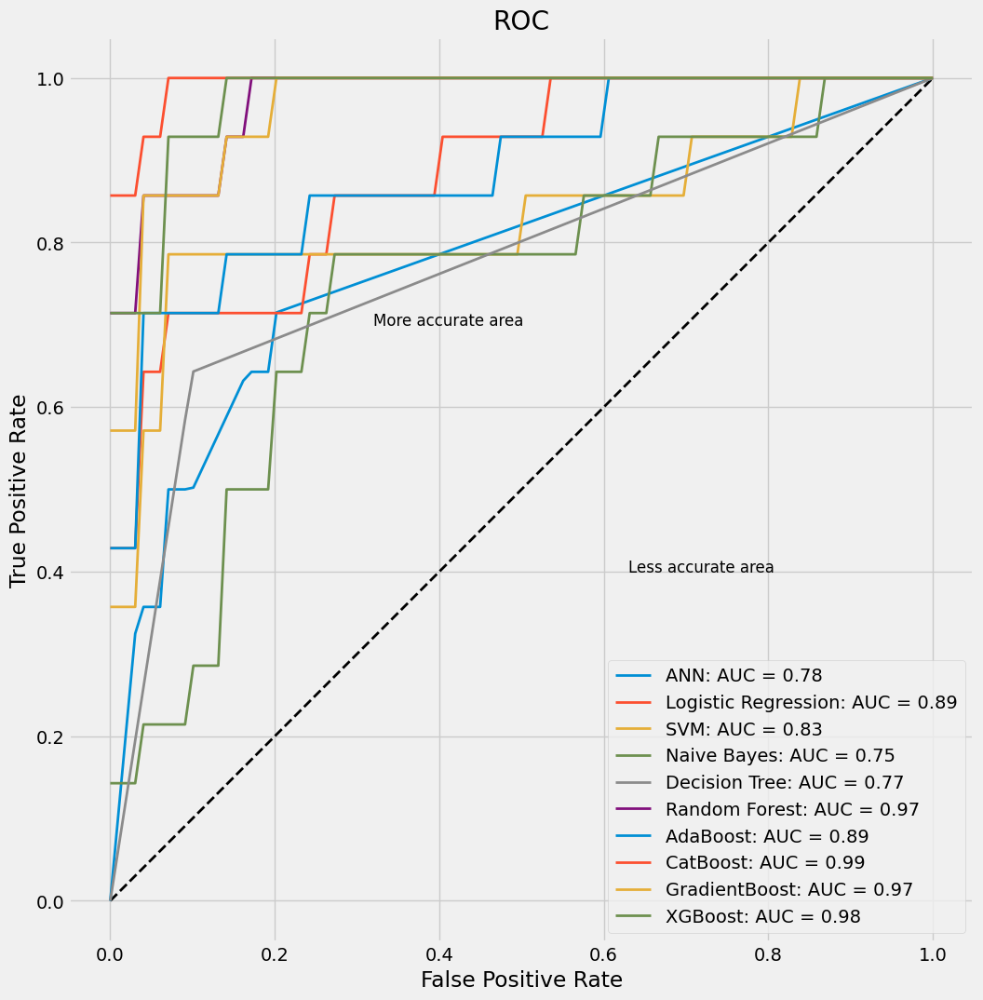

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.75,0.642857,0.8,0.6,0.62069,0.779993
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.885281
SVM,0.818182,0.571429,0.933333,0.8,0.666667,0.832973
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.747475
Decision Tree,0.818182,0.642857,0.9,0.75,0.692308,0.771401
Random Forest,0.931818,0.857143,0.966667,0.923077,0.888889,0.973304
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.886724
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.966089
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.97619


In [ ]:
new_df_XGB_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_10000.csv')
result_XGB_10000=k_fold_results(new_df_XGB_10000[new_df_XGB_10000.columns[:-1]],new_df_XGB_10000[new_df_XGB_10000.columns[-1]], create_models(new_df_XGB_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_10000.T

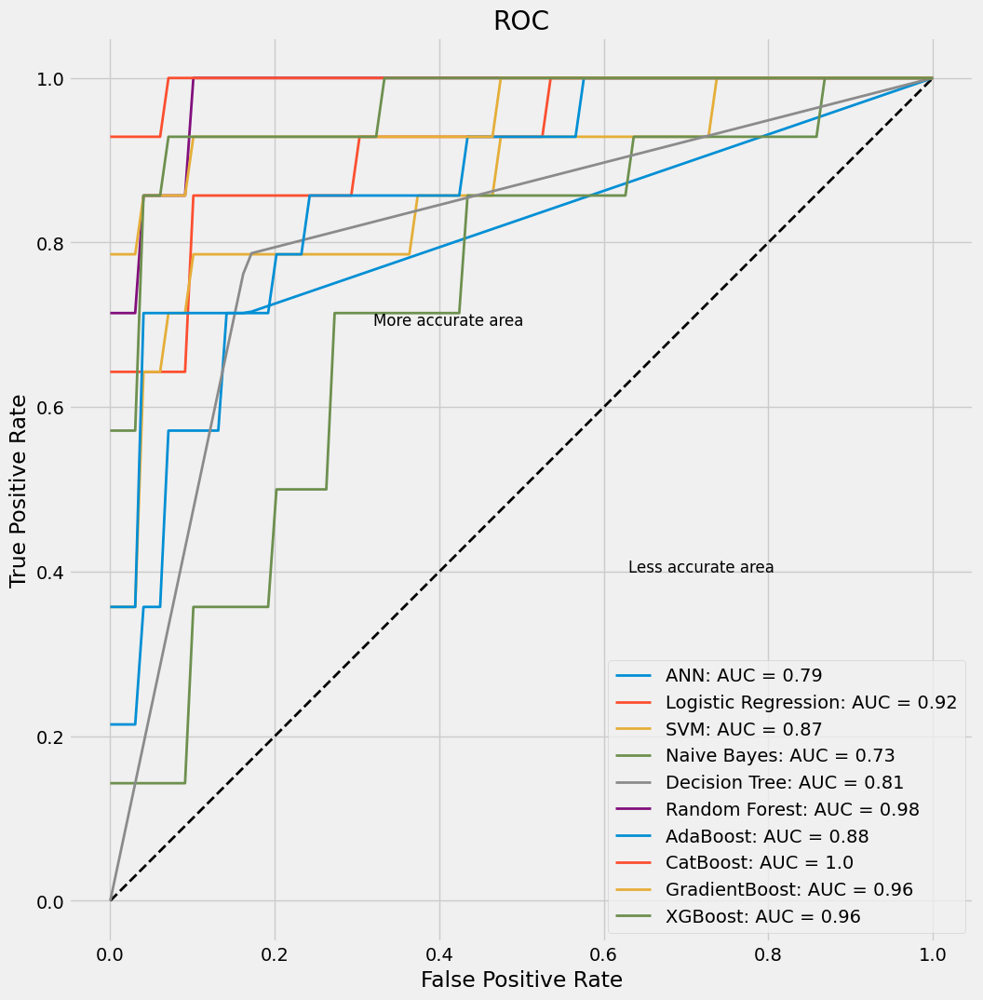

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.714286,0.866667,0.714286,0.714286,0.794737
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.920274
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.866162
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.72583
Decision Tree,0.818182,0.785714,0.833333,0.6875,0.733333,0.809467
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.981241
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.884921
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99531
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.957071
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.96176


In [ ]:
new_df_XGB_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_2080.csv')
result_XGB_2080= k_fold_results(new_df_XGB_2080[new_df_XGB_2080.columns[:-1]],new_df_XGB_2080[new_df_XGB_2080.columns[-1]], create_models(new_df_XGB_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_2080.T

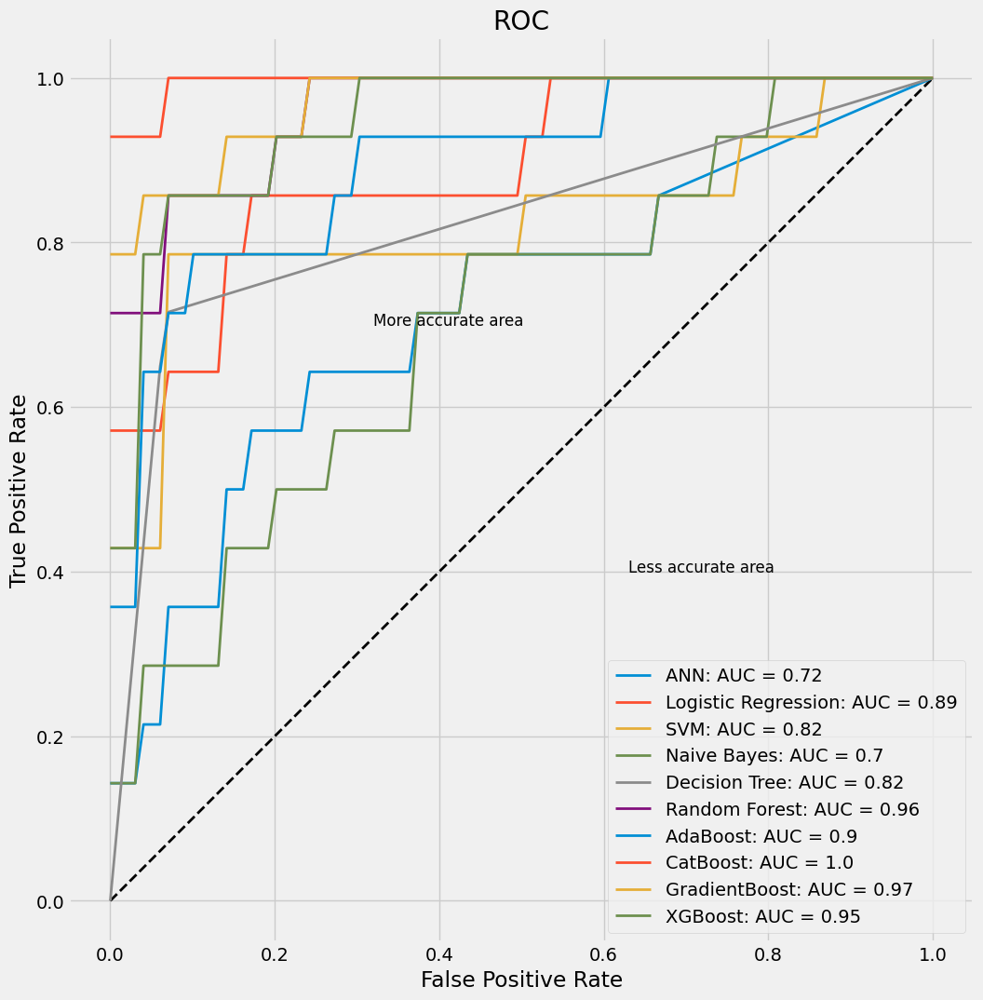

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.704545,0.571429,0.766667,0.533333,0.551724,0.71645
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.890332
SVM,0.818182,0.571429,0.933333,0.8,0.666667,0.824675
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.70202
Decision Tree,0.863636,0.714286,0.933333,0.833333,0.769231,0.823682
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.959596
AdaBoost,0.840909,0.714286,0.9,0.769231,0.740741,0.895022
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99531
GradientBoost,0.863636,0.571429,1.0,1.0,0.727273,0.970779
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.94733


In [ ]:
new_df_XGB_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_5050.csv')
result_XGB_5050=k_fold_results(new_df_XGB_5050[new_df_XGB_5050.columns[:-1]],new_df_XGB_5050[new_df_XGB_5050.columns[-1]], create_models(new_df_XGB_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_5050.T

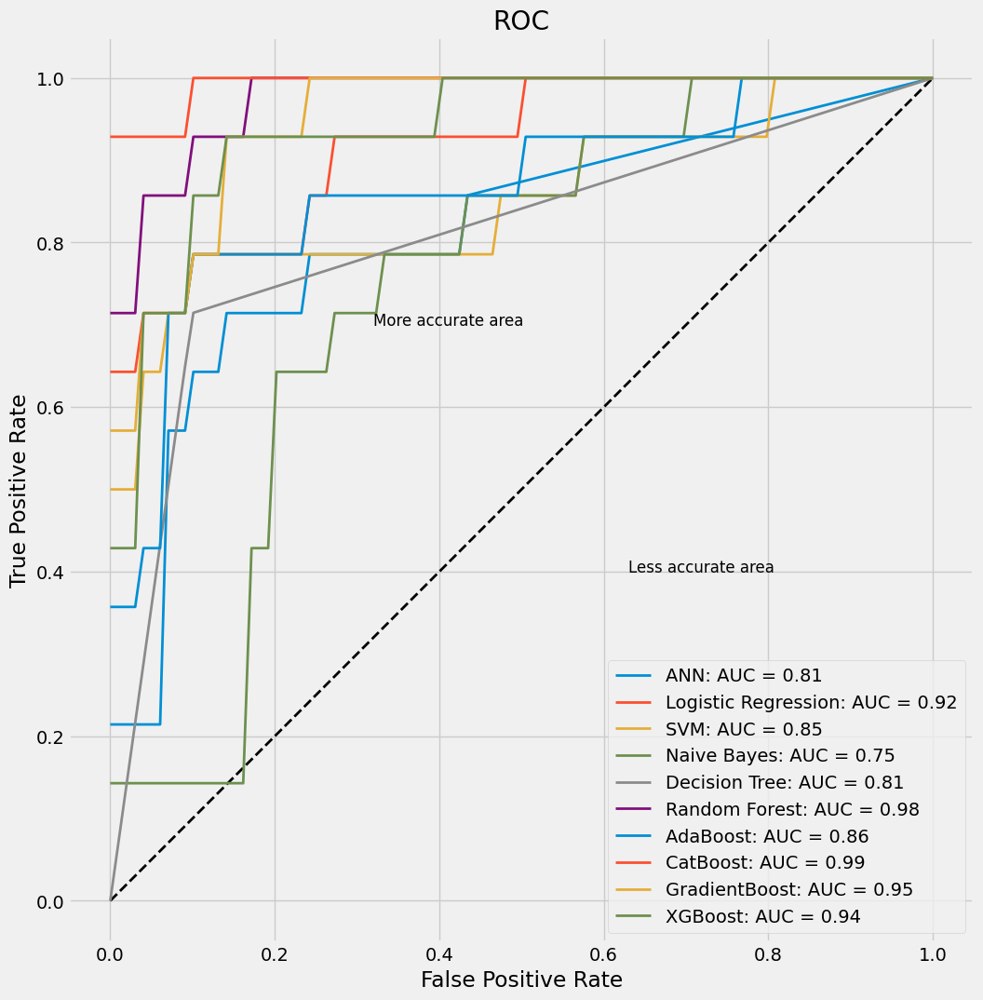

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.642857,0.866667,0.692308,0.666667,0.809958
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.918831
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.851732
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.746032
Decision Tree,0.840909,0.714286,0.9,0.769231,0.740741,0.807112
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97619
AdaBoost,0.840909,0.714286,0.9,0.769231,0.740741,0.864719
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.993146
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.951659
XGBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.937951


In [ ]:
new_df_XGB_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_8020.csv')
result_XGB_8020=k_fold_results(new_df_XGB_8020[new_df_XGB_8020.columns[:-1]],new_df_XGB_8020[new_df_XGB_8020.columns[-1]], create_models(new_df_XGB_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_8020.T

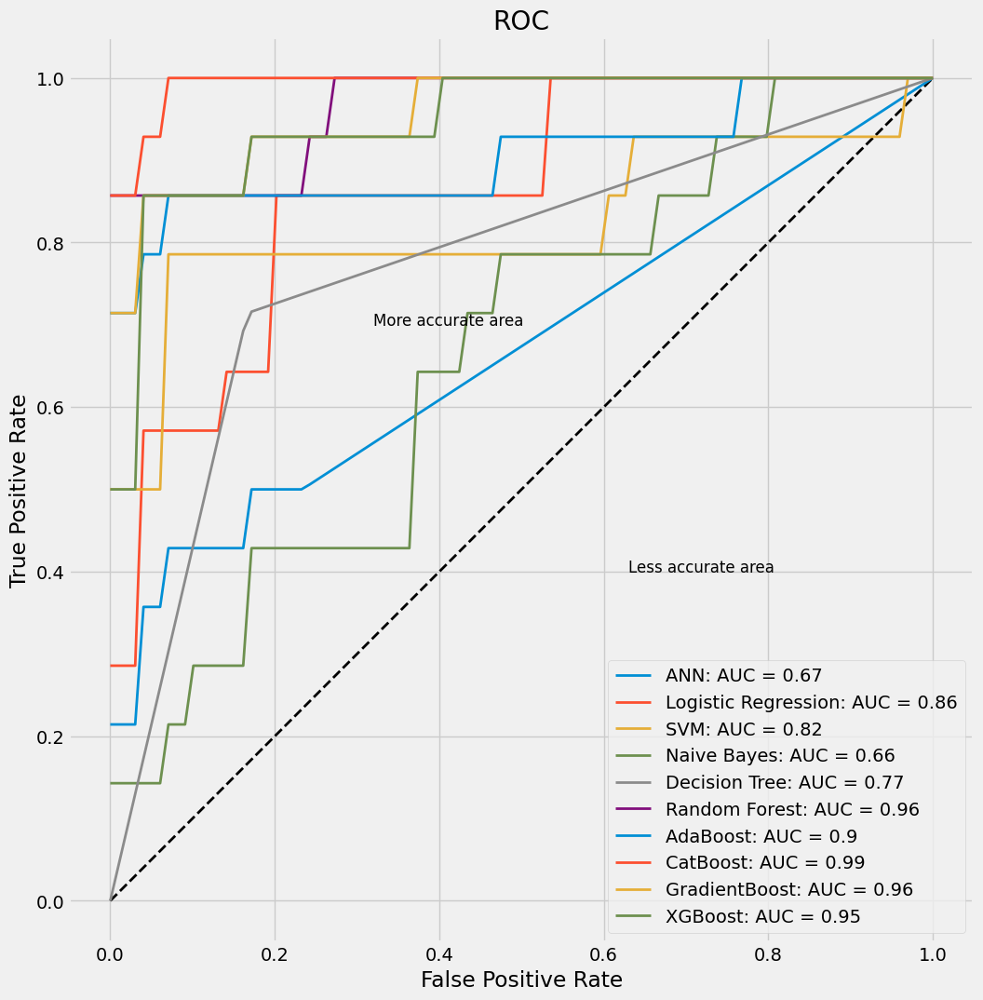

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.727273,0.428571,0.866667,0.6,0.5,0.670025
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.862193
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.824315
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.664502
Decision Tree,0.795455,0.714286,0.833333,0.666667,0.689655,0.773759
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.963925
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.904762
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.95671
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.94697


In [ ]:
new_df_XGB_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_00100.csv')
result_XGB_00100=k_fold_results(new_df_XGB_00100[new_df_XGB_00100.columns[:-1]],new_df_XGB_00100[new_df_XGB_00100.columns[-1]], create_models(new_df_XGB_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_00100.T

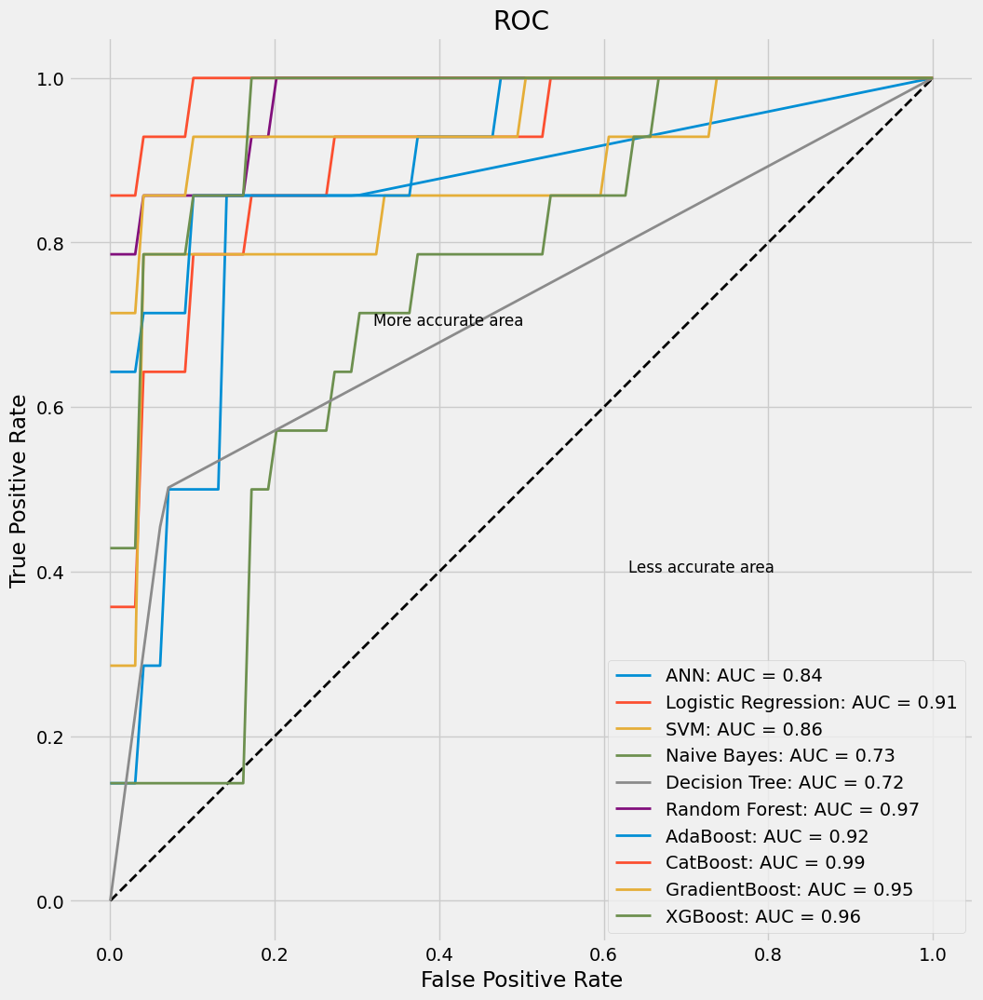

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.5,0.9,0.7,0.583333,0.839324
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.907287
SVM,0.886364,0.714286,0.966667,0.909091,0.8,0.863636
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.729437
Decision Tree,0.795455,0.5,0.933333,0.777778,0.608696,0.716581
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.971501
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.923882
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.952381
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.95671


In [ ]:
new_df_Cat_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_Cat_10000.csv')
result_Cat_10000=k_fold_results(new_df_Cat_10000[new_df_Cat_10000.columns[:-1]],new_df_Cat_10000[new_df_Cat_10000.columns[-1]], create_models(new_df_Cat_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Cat_10000.T

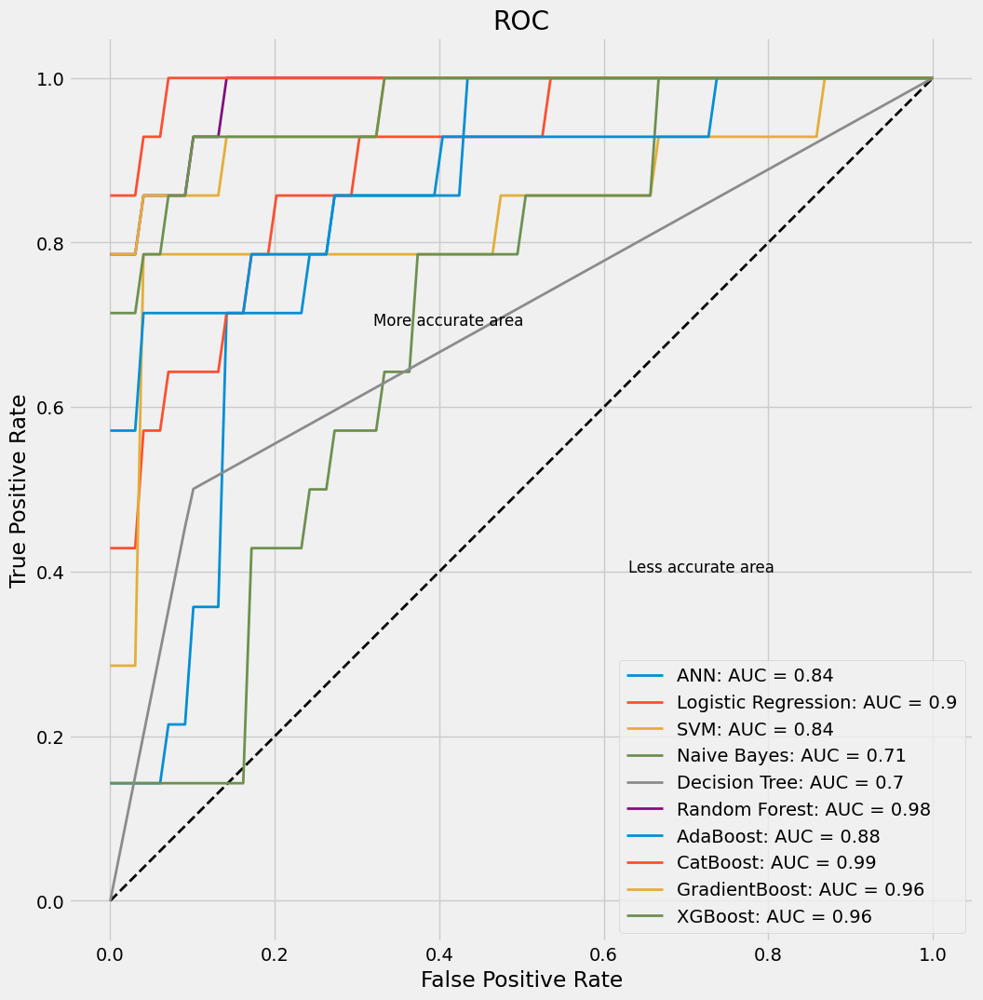

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.642857,0.866667,0.692308,0.666667,0.835498
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.895382
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.839827
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.709957
Decision Tree,0.772727,0.5,0.9,0.7,0.583333,0.69998
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.98088
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.883117
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.886364,0.642857,1.0,1.0,0.782609,0.964286
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.962482


In [ ]:
new_df_Cat_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_Cat_2080.csv')
result_Cat_2080= k_fold_results(new_df_Cat_2080[new_df_Cat_2080.columns[:-1]],new_df_Cat_2080[new_df_Cat_2080.columns[-1]], create_models(new_df_Cat_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Cat_2080.T

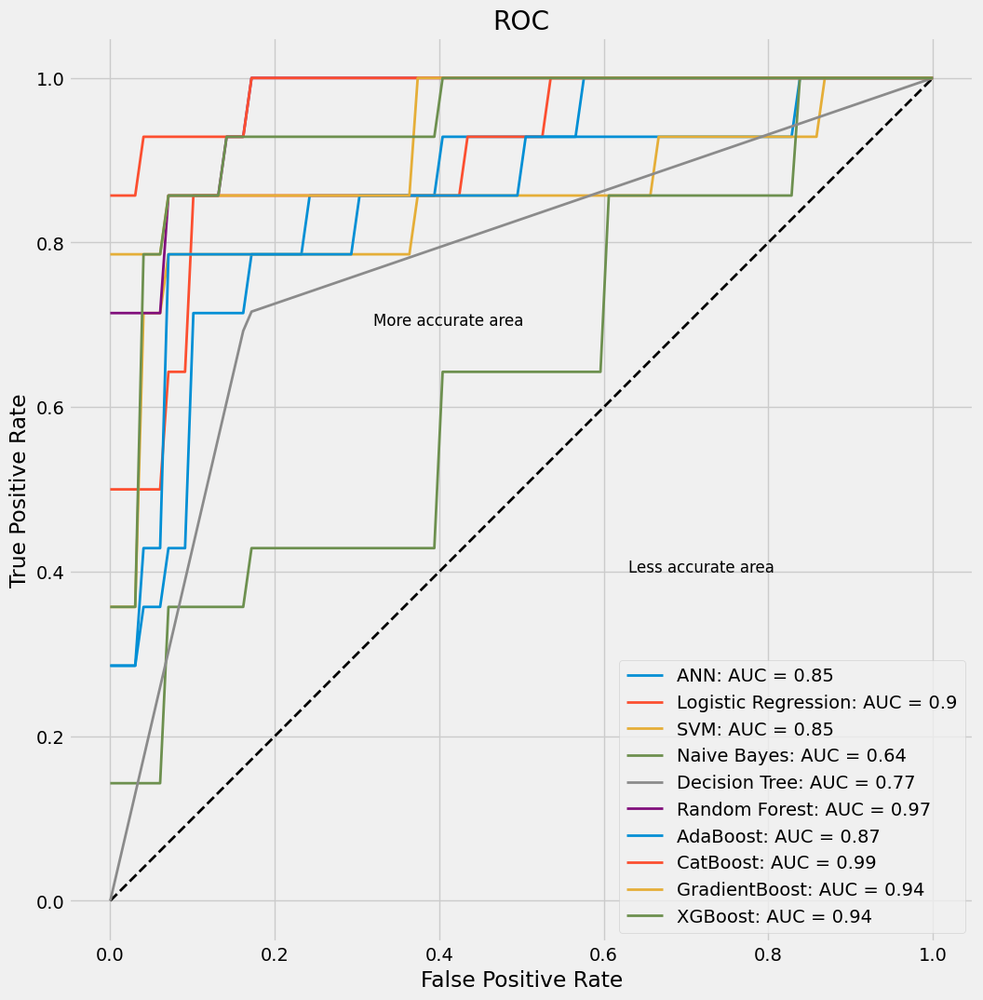

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.642857,0.9,0.75,0.692308,0.848485
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.901515
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.847403
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.640693
Decision Tree,0.795455,0.714286,0.833333,0.666667,0.689655,0.773759
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.968975
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.873737
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.98557
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.942641
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.941919


In [ ]:
new_df_Cat_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_Cat_5050.csv')
result_Cat_5050=k_fold_results(new_df_Cat_5050[new_df_Cat_5050.columns[:-1]],new_df_Cat_5050[new_df_Cat_5050.columns[-1]], create_models(new_df_Cat_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Cat_5050.T

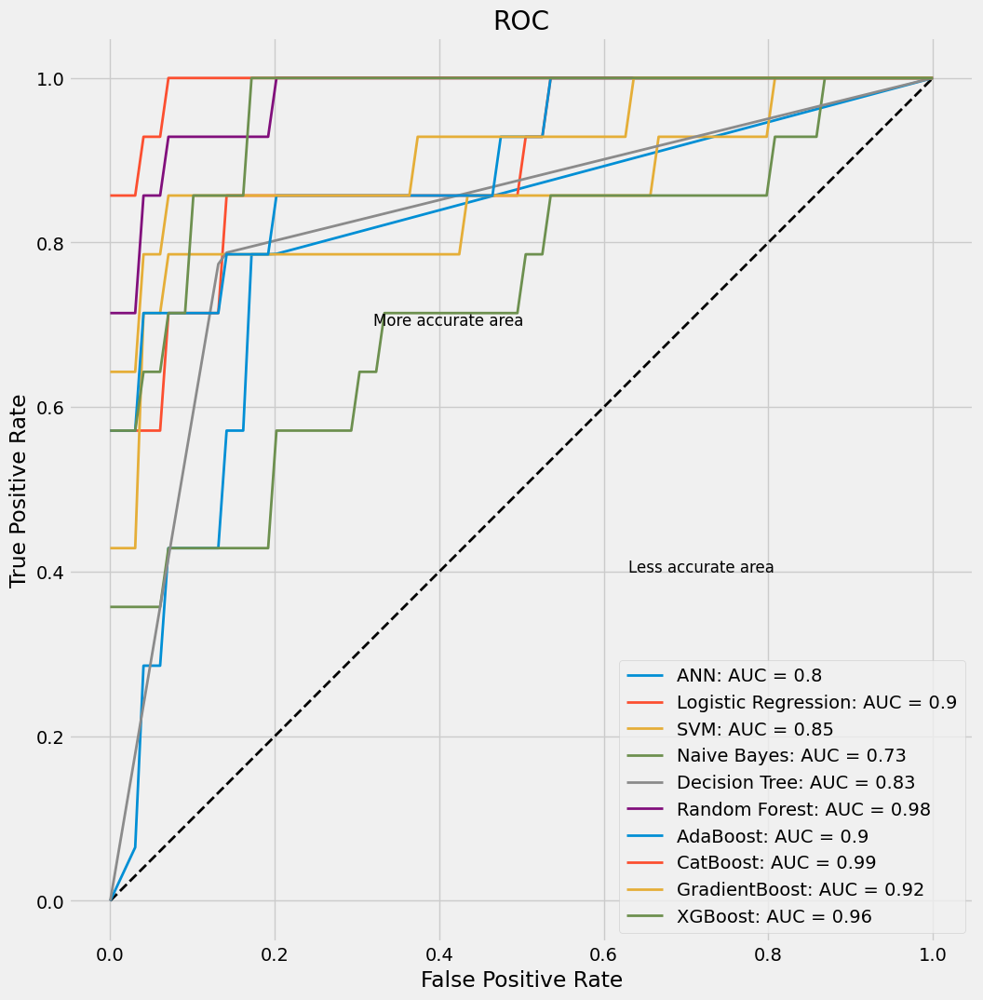

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.727273,0.428571,0.866667,0.6,0.5,0.798067
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.897547
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.849928
Naive Bayes,0.772727,0.285714,1.0,1.0,0.444444,0.729798
Decision Tree,0.840909,0.785714,0.866667,0.733333,0.758621,0.826144
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.97619
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.899711
CatBoost,0.909091,0.714286,1.0,1.0,0.833333,0.992785
GradientBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.918831
XGBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.955267


In [ ]:
new_df_Cat_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_Cat_8020.csv')
result_Cat_8020=k_fold_results(new_df_Cat_8020[new_df_Cat_8020.columns[:-1]],new_df_Cat_8020[new_df_Cat_8020.columns[-1]], create_models(new_df_Cat_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Cat_8020.T

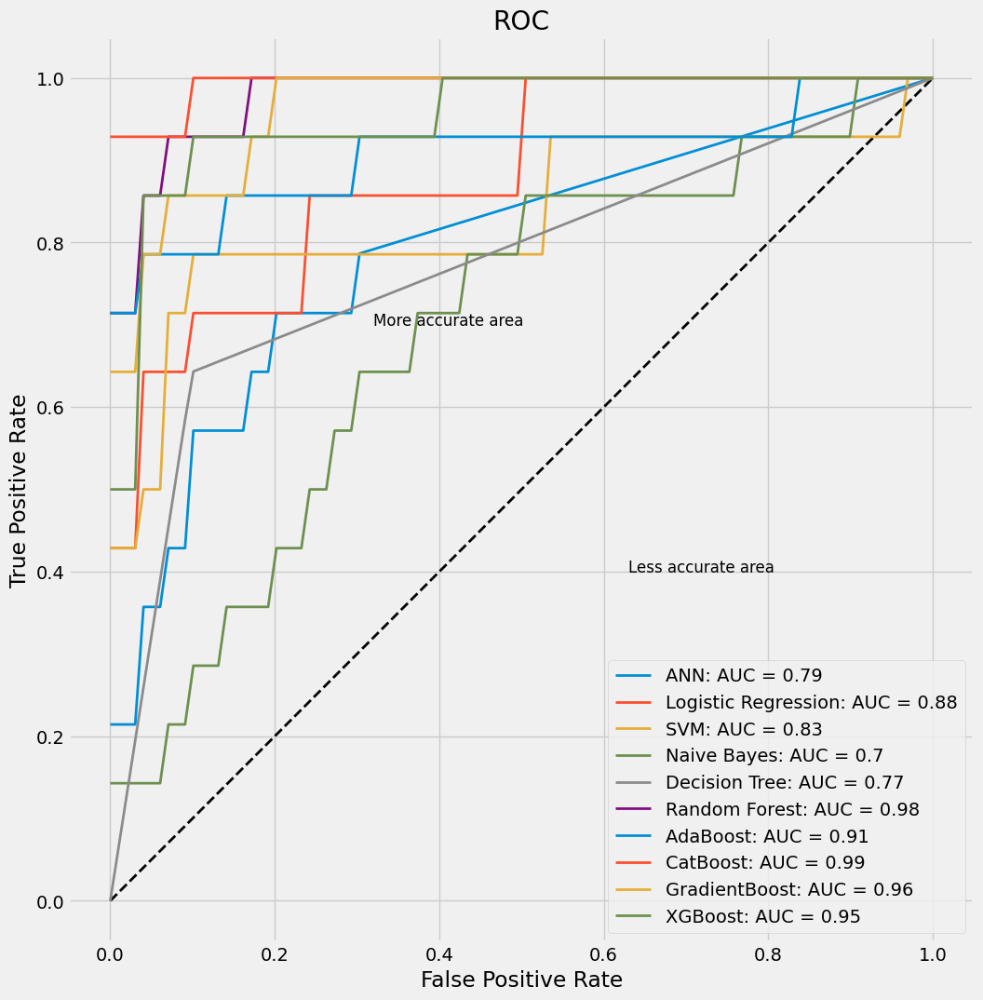

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.642857,0.833333,0.642857,0.642857,0.79001
Logistic Regression,0.818182,0.5,0.966667,0.875,0.636364,0.880231
SVM,0.840909,0.642857,0.933333,0.818182,0.72,0.83189
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.695527
Decision Tree,0.818182,0.642857,0.9,0.75,0.692308,0.771401
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.978355
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.906926
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.993146
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.964286
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.95202


In [ ]:
new_df_Cat_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_Cat_00100.csv')
result_Cat_00100=k_fold_results(new_df_Cat_00100[new_df_Cat_00100.columns[:-1]],new_df_Cat_00100[new_df_Cat_00100.columns[-1]], create_models(new_df_Cat_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_Cat_00100.T

.

.

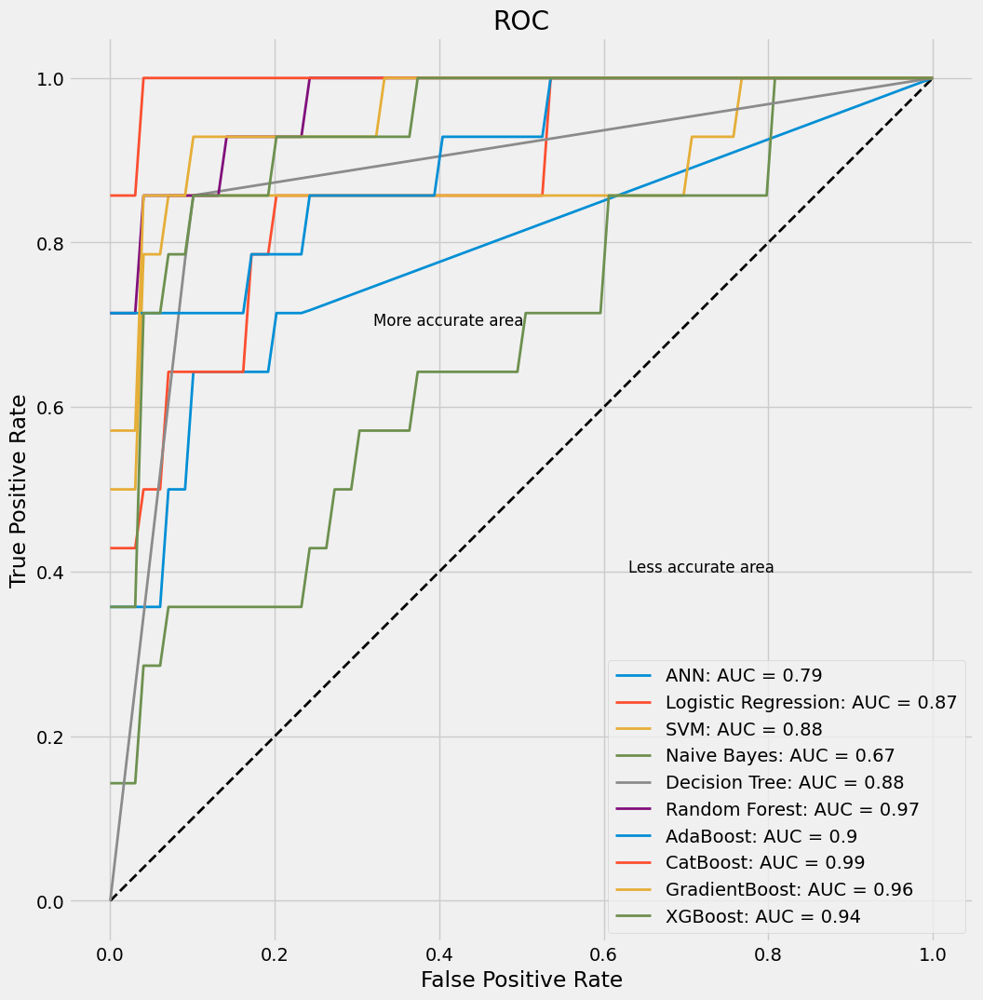

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.571429,0.9,0.727273,0.64,0.786654
Logistic Regression,0.795455,0.5,0.933333,0.777778,0.608696,0.874459
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.880592
Naive Bayes,0.727273,0.214286,0.966667,0.75,0.333333,0.670274
Decision Tree,0.886364,0.857143,0.9,0.8,0.827586,0.878533
Random Forest,0.909091,0.714286,1.0,1.0,0.833333,0.968254
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.904762
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.959596
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.935426


In [ ]:
new_df_GB_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_GB_10000.csv')
result_GB_10000=k_fold_results(new_df_GB_10000[new_df_GB_10000.columns[:-1]],new_df_GB_10000[new_df_GB_10000.columns[-1]], create_models(new_df_GB_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_GB_10000.T

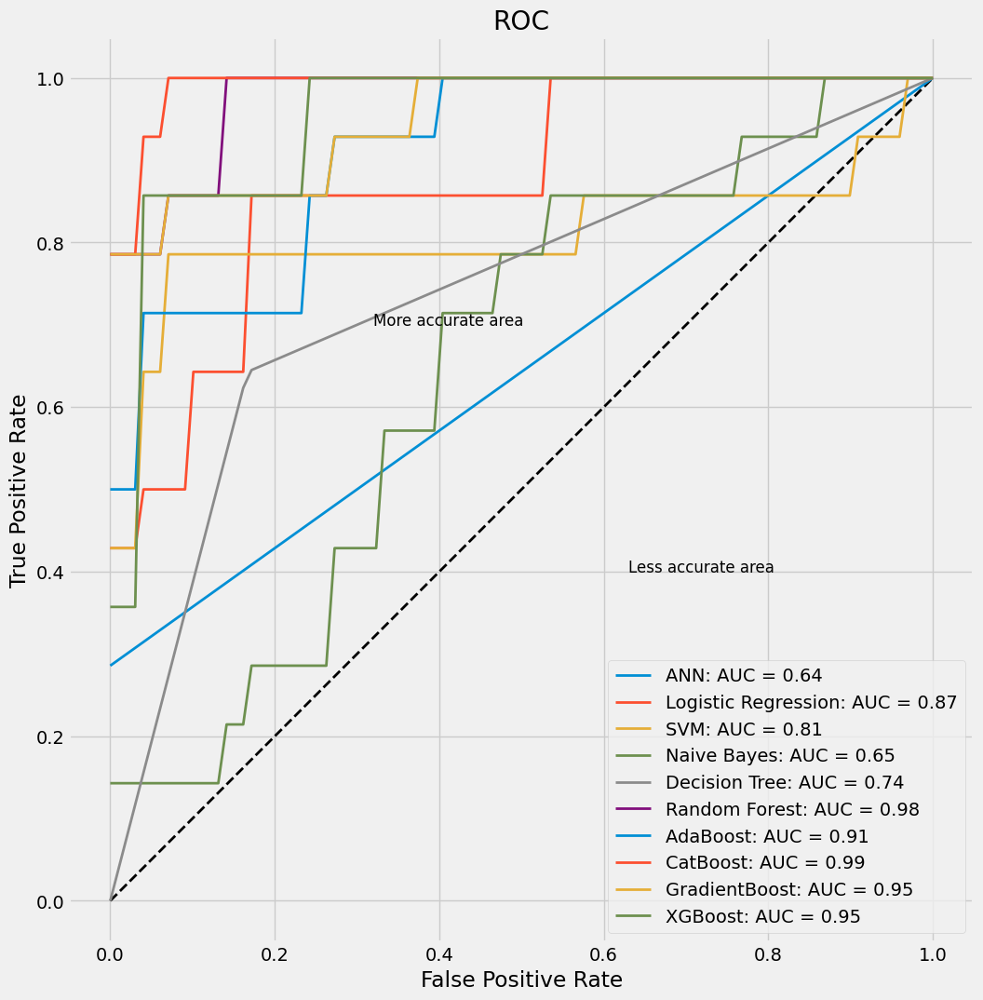

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.285714,1.0,1.0,0.444444,0.642857
Logistic Regression,0.772727,0.5,0.9,0.7,0.583333,0.872294
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.808802
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.648629
Decision Tree,0.772727,0.642857,0.833333,0.642857,0.642857,0.738052
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97583
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.910895
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99026
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.949856
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.948413


In [ ]:
new_df_GB_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_GB_2080.csv')
result_GB_2080= k_fold_results(new_df_GB_2080[new_df_GB_2080.columns[:-1]],new_df_GB_2080[new_df_GB_2080.columns[-1]], create_models(new_df_GB_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_GB_2080.T

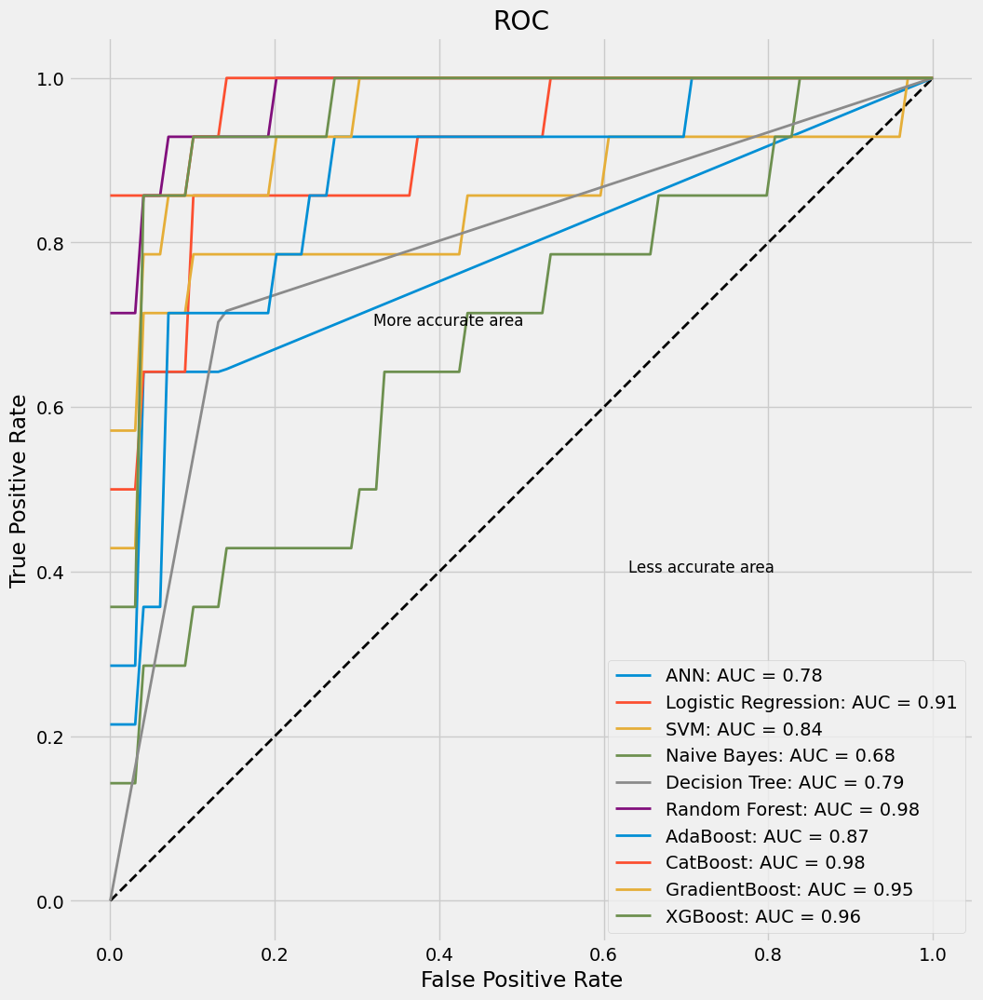

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.5,0.966667,0.875,0.636364,0.784996
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.910173
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.840548
Naive Bayes,0.727273,0.214286,0.966667,0.75,0.333333,0.677489
Decision Tree,0.818182,0.714286,0.866667,0.714286,0.714286,0.790435
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97619
AdaBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.871212
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.983405
GradientBoost,0.863636,0.642857,0.966667,0.9,0.75,0.952381
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.956349


In [ ]:
new_df_GB_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_GB_5050.csv')
result_GB_5050=k_fold_results(new_df_GB_5050[new_df_GB_5050.columns[:-1]],new_df_GB_5050[new_df_GB_5050.columns[-1]], create_models(new_df_GB_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_GB_5050.T

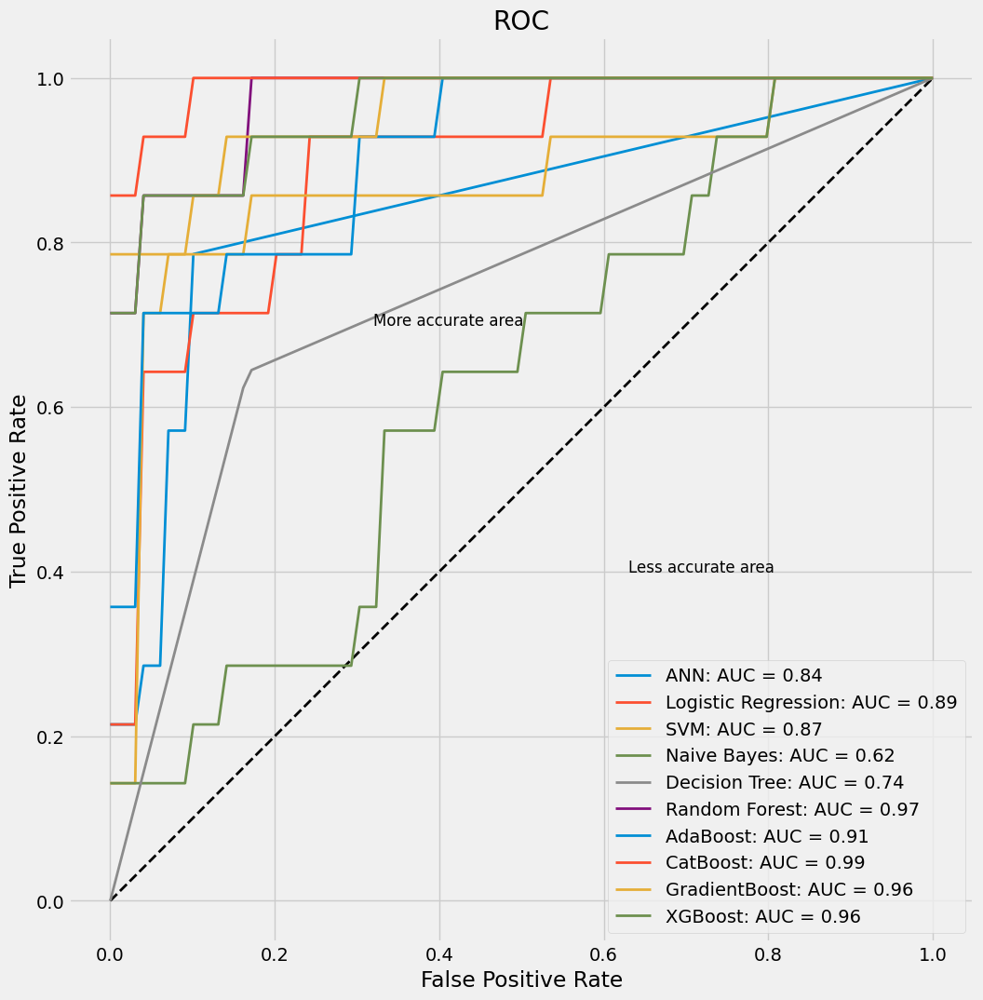

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.840297
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.892136
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.867965
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.62482
Decision Tree,0.772727,0.642857,0.833333,0.642857,0.642857,0.738052
Random Forest,0.886364,0.714286,0.966667,0.909091,0.8,0.97114
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.906566
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.959957
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.96176


In [ ]:
new_df_GB_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_GB_8020.csv')
result_GB_8020=k_fold_results(new_df_GB_8020[new_df_GB_8020.columns[:-1]],new_df_GB_8020[new_df_GB_8020.columns[-1]], create_models(new_df_GB_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_GB_8020.T

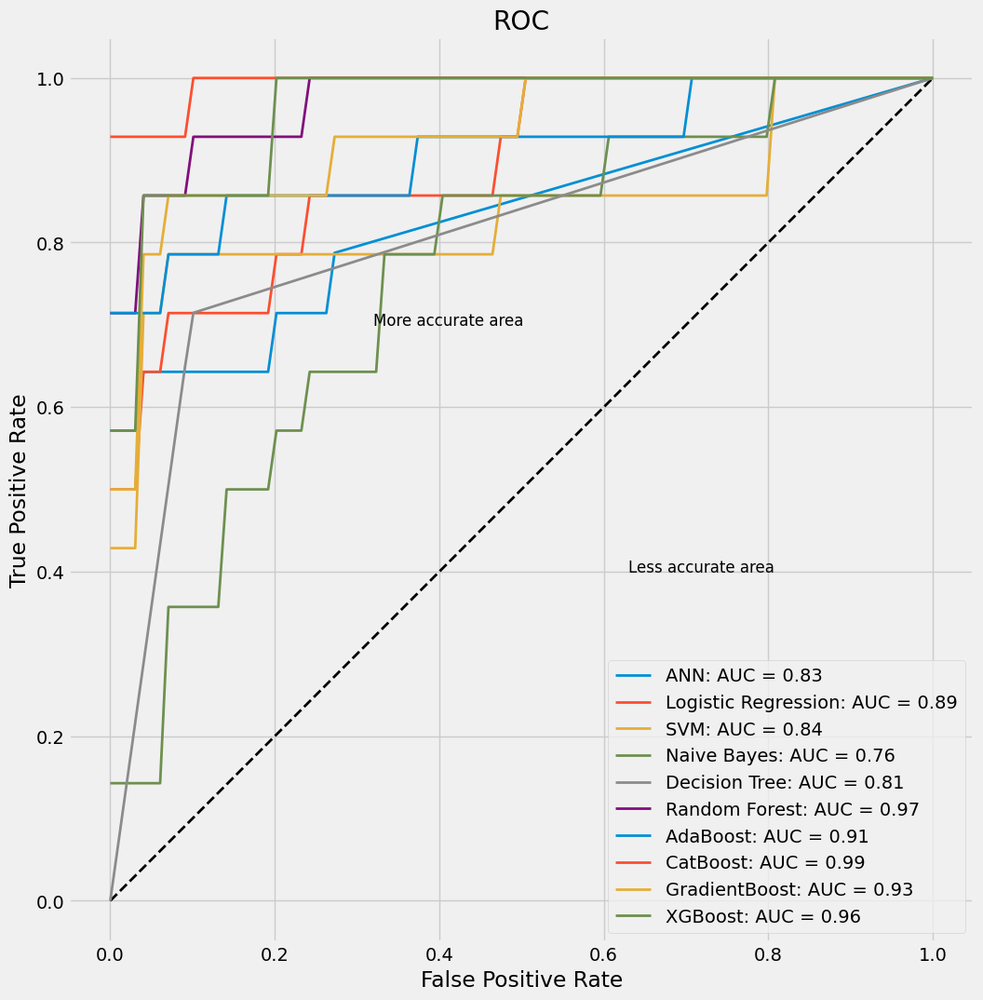

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.863636,0.642857,0.966667,0.9,0.75,0.828575
Logistic Regression,0.840909,0.571429,0.966667,0.888889,0.695652,0.889971
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.836941
Naive Bayes,0.727273,0.142857,1.0,1.0,0.25,0.75974
Decision Tree,0.840909,0.714286,0.9,0.769231,0.740741,0.807112
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97114
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.909091
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.993146
GradientBoost,0.818182,0.5,0.966667,0.875,0.636364,0.930375
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.96176


In [ ]:
new_df_GB_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_GB_00100.csv')
result_GB_00100=k_fold_results(new_df_GB_00100[new_df_GB_00100.columns[:-1]],new_df_GB_00100[new_df_GB_00100.columns[-1]], create_models(new_df_GB_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_GB_00100.T

.

.

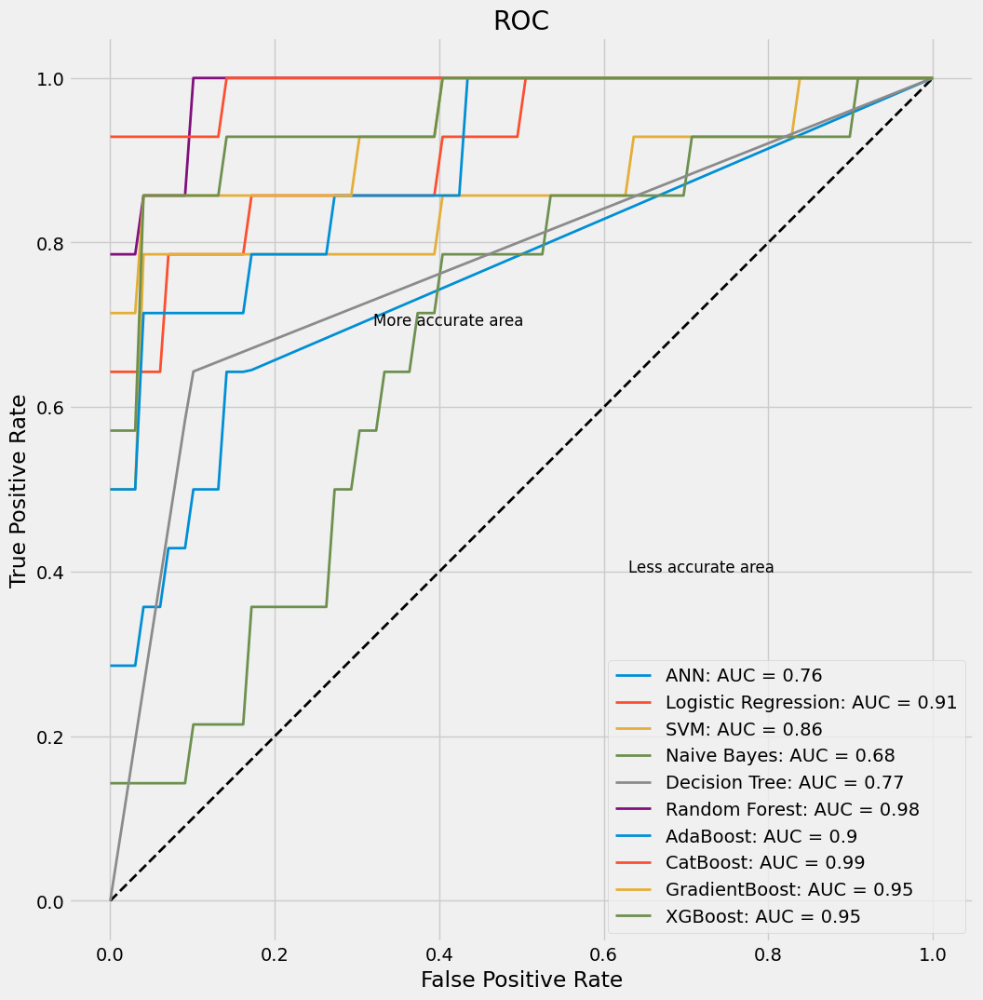

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.75,0.5,0.866667,0.636364,0.56,0.758122
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.914502
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.856782
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.678932
Decision Tree,0.818182,0.642857,0.9,0.75,0.692308,0.771401
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.983766
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.900072
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99026
GradientBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.945166
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.951659


In [ ]:
new_df_ANN_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_10000.csv')
result_ANN_10000=k_fold_results(new_df_ANN_10000[new_df_ANN_10000.columns[:-1]],new_df_ANN_10000[new_df_ANN_10000.columns[-1]], create_models(new_df_ANN_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_10000.T

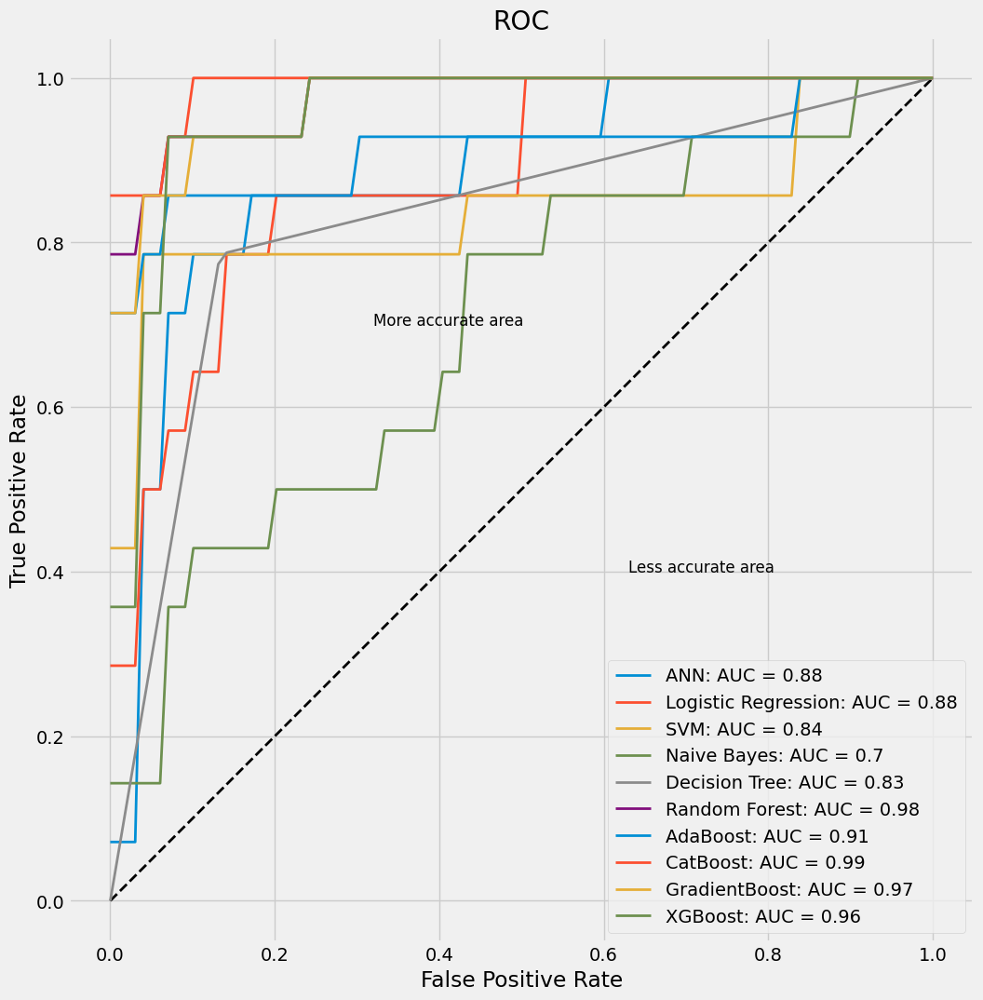

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.878427
Logistic Regression,0.795455,0.571429,0.9,0.727273,0.64,0.875902
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.837662
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.699134
Decision Tree,0.840909,0.785714,0.866667,0.733333,0.758621,0.826144
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.97583
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.911977
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.988456
GradientBoost,0.886364,0.642857,1.0,1.0,0.782609,0.97114
XGBoost,0.863636,0.642857,0.966667,0.9,0.75,0.956349


In [ ]:
new_df_ANN_2080 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_2080.csv')
result_ANN_2080= k_fold_results(new_df_ANN_2080[new_df_ANN_2080.columns[:-1]],new_df_ANN_2080[new_df_ANN_2080.columns[-1]], create_models(new_df_ANN_2080), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_2080.T

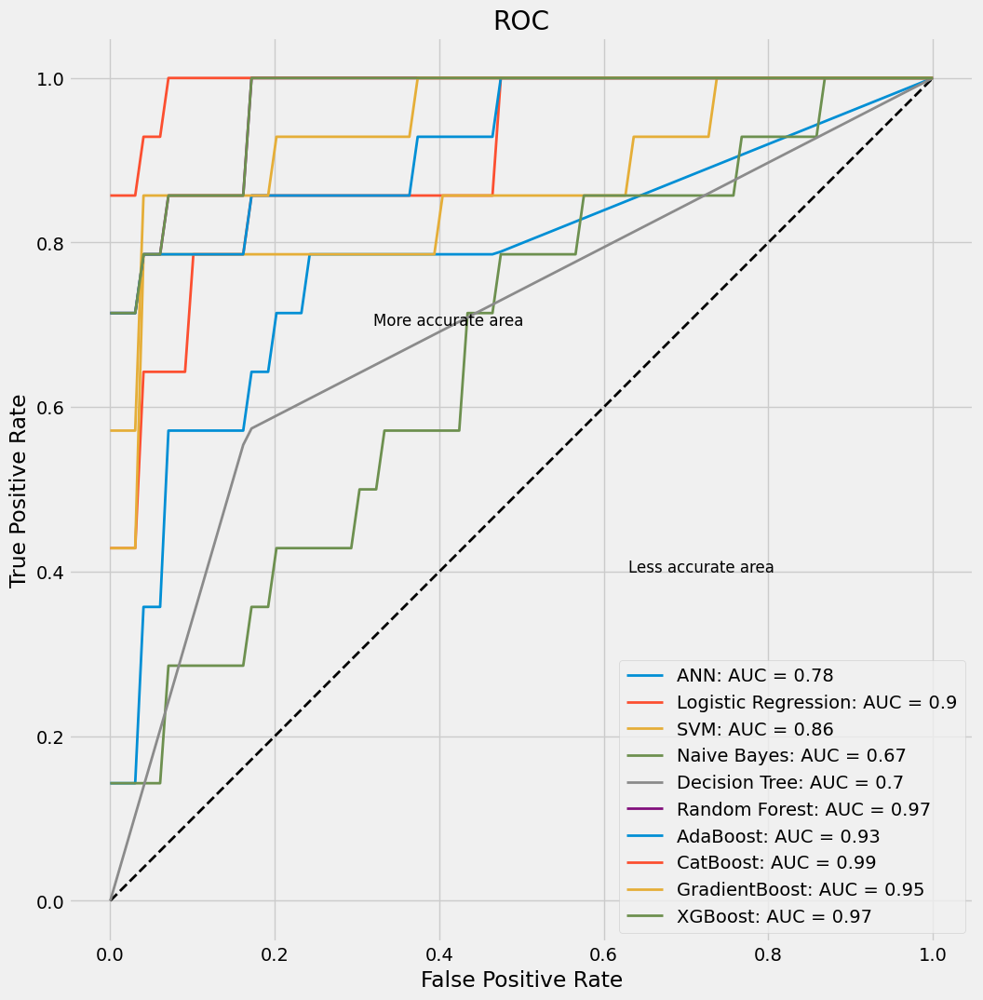

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.571429,0.9,0.727273,0.64,0.778286
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.899711
SVM,0.863636,0.642857,0.966667,0.9,0.75,0.861472
Naive Bayes,0.704545,0.142857,0.966667,0.666667,0.235294,0.66811
Decision Tree,0.75,0.571429,0.833333,0.615385,0.592593,0.702344
Random Forest,0.886364,0.785714,0.933333,0.846154,0.814815,0.968975
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.925685
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.863636,0.642857,0.966667,0.9,0.75,0.949495
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.968975


In [ ]:
new_df_ANN_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_5050.csv')
result_ANN_5050=k_fold_results(new_df_ANN_5050[new_df_ANN_5050.columns[:-1]],new_df_ANN_5050[new_df_ANN_5050.columns[-1]], create_models(new_df_ANN_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_5050.T

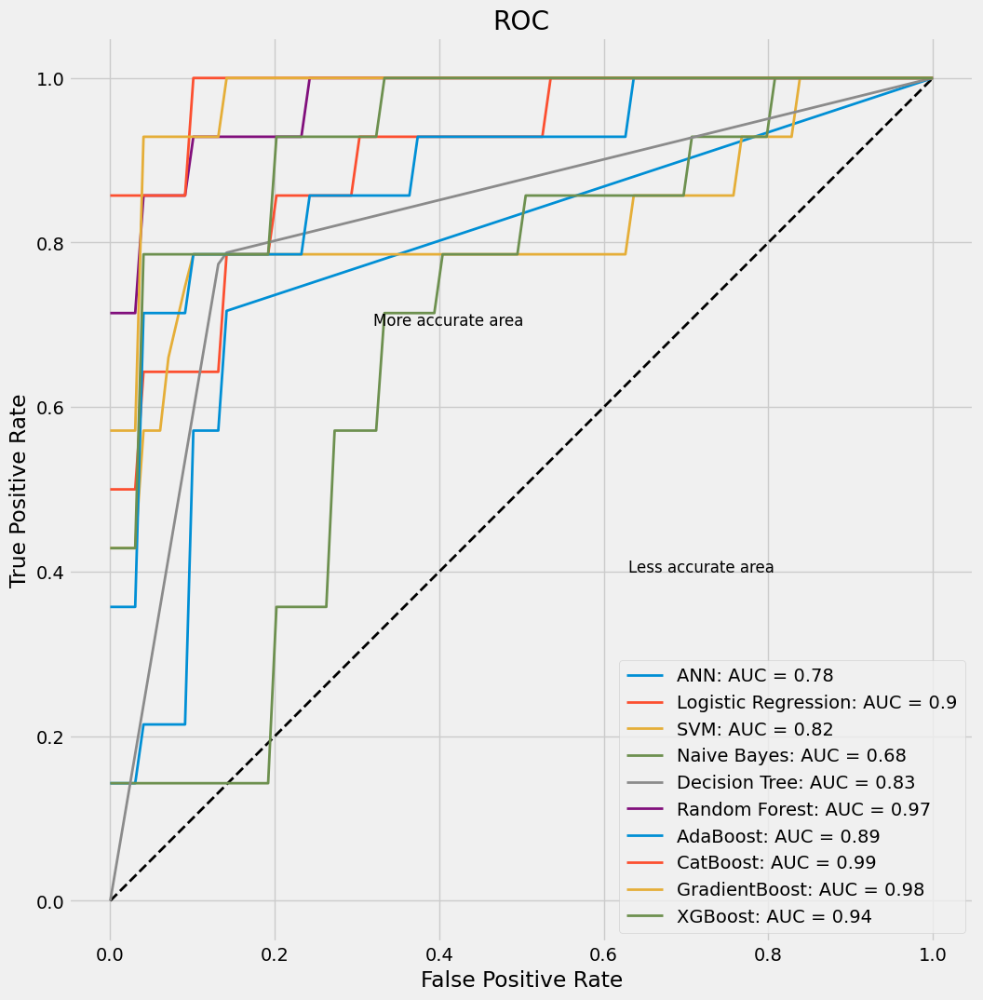

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.571429,0.866667,0.666667,0.615385,0.781821
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.902237
SVM,0.840909,0.571429,0.966667,0.888889,0.695652,0.819297
Naive Bayes,0.681818,0.142857,0.933333,0.5,0.222222,0.681818
Decision Tree,0.840909,0.785714,0.866667,0.733333,0.758621,0.826144
Random Forest,0.909091,0.714286,1.0,1.0,0.833333,0.97114
AdaBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.892136
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.986291
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.977633
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.935786


In [ ]:
new_df_ANN_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_8020.csv')
result_ANN_8020=k_fold_results(new_df_ANN_8020[new_df_ANN_8020.columns[:-1]],new_df_ANN_8020[new_df_ANN_8020.columns[-1]], create_models(new_df_ANN_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_8020.T

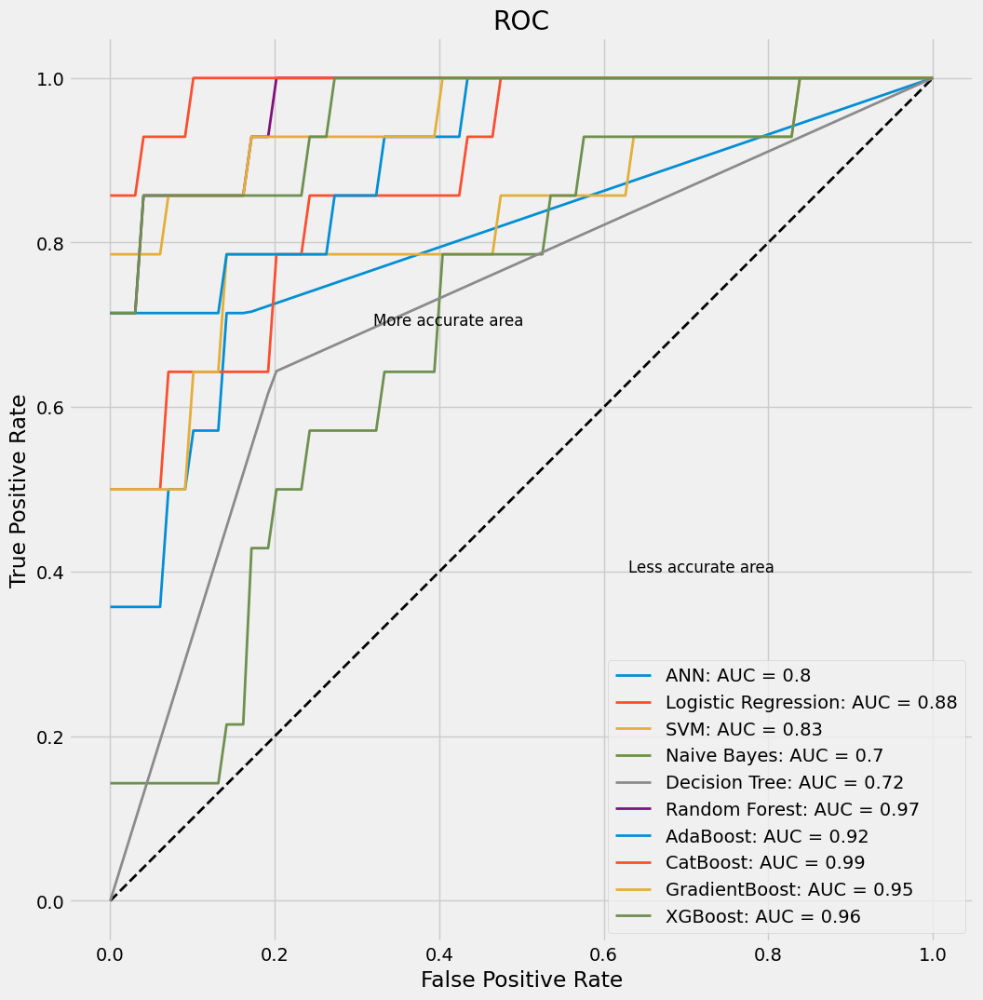

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.571429,0.9,0.727273,0.64,0.797623
Logistic Regression,0.818182,0.571429,0.933333,0.8,0.666667,0.881313
SVM,0.818182,0.642857,0.9,0.75,0.692308,0.828644
Naive Bayes,0.681818,0.142857,0.933333,0.5,0.222222,0.704906
Decision Tree,0.75,0.642857,0.8,0.6,0.62069,0.721406
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.968975
AdaBoost,0.909091,0.714286,1.0,1.0,0.833333,0.917027
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.99062
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.954906
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.958874


In [ ]:
new_df_ANN_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_00100.csv')
result_ANN_00100=k_fold_results(new_df_ANN_00100[new_df_ANN_00100.columns[:-1]],new_df_ANN_00100[new_df_ANN_00100.columns[-1]], create_models(new_df_ANN_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_00100.T

In [ ]:
variable = 'result'
models_name = list(result_Cat_5050.columns)
models_name_ab = ['ANN','LR', 'SVM', 'NB', 'DT', 'RF', 'Ada', 'Cat', 'GB', 'XGB']
ratios = ['100 : 00', '80 : 20', '50 : 50', '20 : 80']
models_dict = { key:value for key, value in zip(models_name, models_name_ab)}

In [ ]:
list(result_Cat_5050.columns)

In [ ]:
variables = []
columns = [[], []]
for name in models_name:
  for rate in ratios:
    variables.append(f"{variable}_{models_dict[name]}_{rate.replace(':', '').replace(' ', '')}")
    columns[0].append(models_dict[name]+' : '+'EmbLoss')
    columns[1].append(rate)


In [ ]:
tuples = list(zip(*columns))
tuples.append(('EmbLoss','00 : 100'))
index = pd.MultiIndex.from_tuples(tuples, names=["Fitness Function", "Ratio"])
result_df = pd.DataFrame(np.random.randn(10, 41), index=list(result_Cat_00100.T.index), columns=index)

In [ ]:
metric = 'accuracy'
test = 2

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  result_df[result_df.columns[i]] = temp_df.T[metric]

variables = [
 'result_ANN_10000',
 'result_ANN_8020',
 'result_ANN_5050',
 'result_ANN_2080',
 'result_LR_10000',
 'result_LR_8020',
 'result_LR_5050',
 'result_LR_2080',
 'result_SVM_10000',
 'result_SVM_8020',
 'result_SVM_5050',
 'result_SVM_2080',
 'result_NB_10000',
 'result_NB_8020',
 'result_NB_5050',
 'result_NB_2080',
 'result_DT_10000',
 'result_DT_8020',
 'result_DT_5050',
 'result_DT_2080',
 'result_RF_10000',
 'result_RF_8020',
 'result_RF_5050',
 'result_RF_2080',
 'result_Ada_10000',
 'result_Ada_8020',
 'result_Ada_5050',
 'result_Ada_2080',
 'result_Cat_10000',
 'result_Cat_8020',
 'result_Cat_5050',
 'result_Cat_2080',
 'result_GB_10000',
 'result_GB_8020',
 'result_GB_5050',
 'result_GB_2080',
 'result_XGB_10000',
 'result_XGB_8020',
 'result_XGB_5050',
 'result_XGB_2080',
]

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  temp_df.to_csv(f'/content/gdrive/MyDrive/{variable}.csv')

result_df[result_df.columns[-1]] = result_XGB_00100.T[metric]
result_df.to_csv(f'/content/gdrive/MyDrive/new_{metric}_result_test{test}.csv')


In [ ]:
metric = 'precision'
test = 2

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  result_df[result_df.columns[i]] = temp_df.T[metric]

variables = [
 'result_ANN_10000',
 'result_ANN_8020',
 'result_ANN_5050',
 'result_ANN_2080',
 'result_LR_10000',
 'result_LR_8020',
 'result_LR_5050',
 'result_LR_2080',
 'result_SVM_10000',
 'result_SVM_8020',
 'result_SVM_5050',
 'result_SVM_2080',
 'result_NB_10000',
 'result_NB_8020',
 'result_NB_5050',
 'result_NB_2080',
 'result_DT_10000',
 'result_DT_8020',
 'result_DT_5050',
 'result_DT_2080',
 'result_RF_10000',
 'result_RF_8020',
 'result_RF_5050',
 'result_RF_2080',
 'result_Ada_10000',
 'result_Ada_8020',
 'result_Ada_5050',
 'result_Ada_2080',
 'result_Cat_10000',
 'result_Cat_8020',
 'result_Cat_5050',
 'result_Cat_2080',
 'result_GB_10000',
 'result_GB_8020',
 'result_GB_5050',
 'result_GB_2080',
 'result_XGB_10000',
 'result_XGB_8020',
 'result_XGB_5050',
 'result_XGB_2080',
]

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  temp_df.to_csv(f'/content/gdrive/MyDrive/{variable}.csv')

result_df[result_df.columns[-1]] = result_XGB_00100.T[metric]
result_df.to_csv(f'/content/gdrive/MyDrive/new_{metric}_result_test{test}.csv')


In [ ]:
metric = 'recall'
test = 2

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  result_df[result_df.columns[i]] = temp_df.T[metric]

variables = [
 'result_ANN_10000',
 'result_ANN_8020',
 'result_ANN_5050',
 'result_ANN_2080',
 'result_LR_10000',
 'result_LR_8020',
 'result_LR_5050',
 'result_LR_2080',
 'result_SVM_10000',
 'result_SVM_8020',
 'result_SVM_5050',
 'result_SVM_2080',
 'result_NB_10000',
 'result_NB_8020',
 'result_NB_5050',
 'result_NB_2080',
 'result_DT_10000',
 'result_DT_8020',
 'result_DT_5050',
 'result_DT_2080',
 'result_RF_10000',
 'result_RF_8020',
 'result_RF_5050',
 'result_RF_2080',
 'result_Ada_10000',
 'result_Ada_8020',
 'result_Ada_5050',
 'result_Ada_2080',
 'result_Cat_10000',
 'result_Cat_8020',
 'result_Cat_5050',
 'result_Cat_2080',
 'result_GB_10000',
 'result_GB_8020',
 'result_GB_5050',
 'result_GB_2080',
 'result_XGB_10000',
 'result_XGB_8020',
 'result_XGB_5050',
 'result_XGB_2080',
]

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  temp_df.to_csv(f'/content/gdrive/MyDrive/{variable}.csv')

result_df[result_df.columns[-1]] = result_XGB_00100.T[metric]
result_df.to_csv(f'/content/gdrive/MyDrive/new_{metric}_result_test{test}.csv')


In [ ]:
metric = 'F1'
test = 2

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  result_df[result_df.columns[i]] = temp_df.T[metric]

variables = [
 'result_ANN_10000',
 'result_ANN_8020',
 'result_ANN_5050',
 'result_ANN_2080',
 'result_LR_10000',
 'result_LR_8020',
 'result_LR_5050',
 'result_LR_2080',
 'result_SVM_10000',
 'result_SVM_8020',
 'result_SVM_5050',
 'result_SVM_2080',
 'result_NB_10000',
 'result_NB_8020',
 'result_NB_5050',
 'result_NB_2080',
 'result_DT_10000',
 'result_DT_8020',
 'result_DT_5050',
 'result_DT_2080',
 'result_RF_10000',
 'result_RF_8020',
 'result_RF_5050',
 'result_RF_2080',
 'result_Ada_10000',
 'result_Ada_8020',
 'result_Ada_5050',
 'result_Ada_2080',
 'result_Cat_10000',
 'result_Cat_8020',
 'result_Cat_5050',
 'result_Cat_2080',
 'result_GB_10000',
 'result_GB_8020',
 'result_GB_5050',
 'result_GB_2080',
 'result_XGB_10000',
 'result_XGB_8020',
 'result_XGB_5050',
 'result_XGB_2080',
]

for i, variable in enumerate(variables):
  temp_df = globals()[variable]
  temp_df.to_csv(f'/content/gdrive/MyDrive/{variable}.csv')

result_df[result_df.columns[-1]] = result_XGB_00100.T[metric]
result_df.to_csv(f'/content/gdrive/MyDrive/new_{metric}_result_test{test}.csv')


In [ ]:
result_df

In [ ]:
df = pd.read_csv(f'/content/gdrive/MyDrive/new_accuracy_result_test1.csv')
for i in range(2,6):
  df_temp = pd.read_csv(f'/content/gdrive/MyDrive/new_accuracy_result_test{i}.csv')

  for col in df.columns[1:]:
    df[col].iloc[1:] = df[col].iloc[1:].astype(float) + df_temp[col].iloc[1:].astype(float)


for col in df.columns[1:]:
  df[col].iloc[1:] = df[col].iloc[1:]/5

In [ ]:
df.to_csv('/content/gdrive/MyDrive/new_new_F1.csv')

In [ ]:
accuracy = pd.read_csv('/content/gdrive/MyDrive/new_new_accuracy.csv')
recall = pd.read_csv('/content/gdrive/MyDrive/new_new_recall.csv')

## Test Data

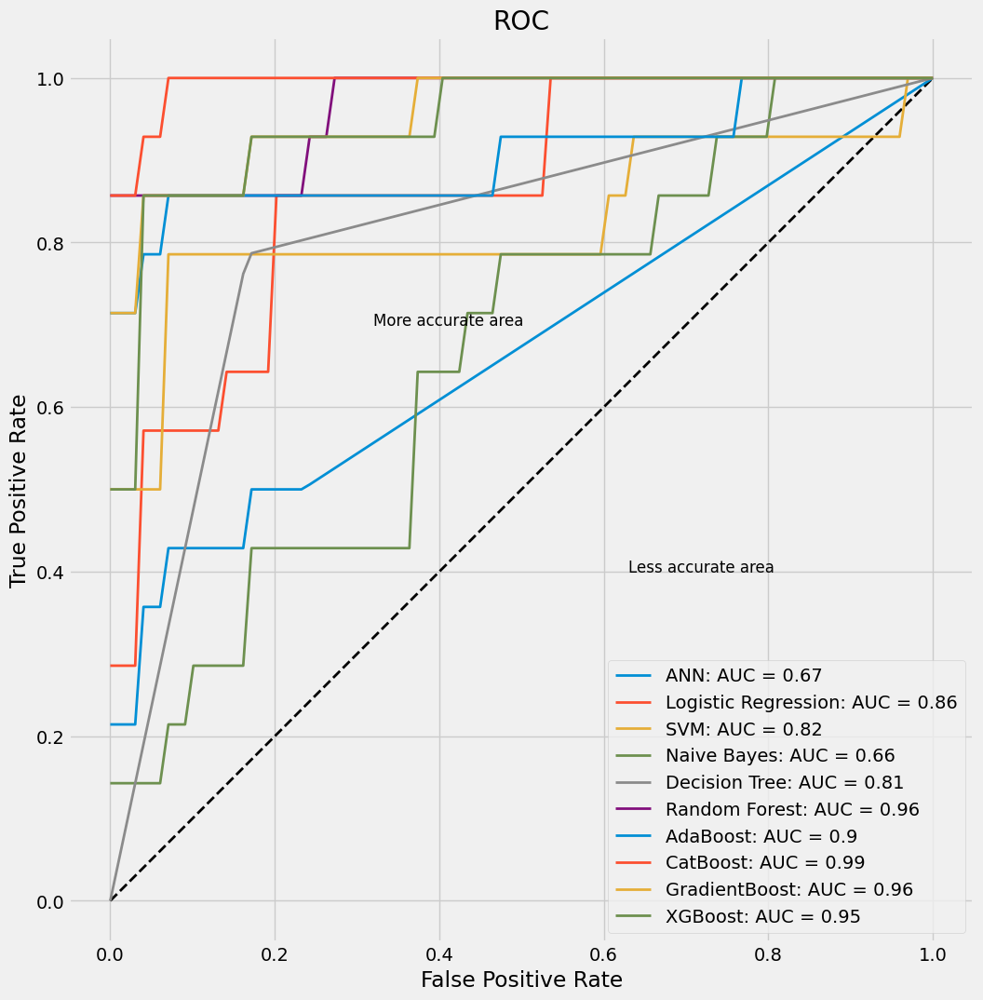

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.727273,0.428571,0.866667,0.6,0.5,0.670025
Logistic Regression,0.772727,0.571429,0.866667,0.666667,0.615385,0.862193
SVM,0.886364,0.785714,0.933333,0.846154,0.814815,0.824315
Naive Bayes,0.681818,0.285714,0.866667,0.5,0.363636,0.664502
Decision Tree,0.818182,0.785714,0.833333,0.6875,0.733333,0.809467
Random Forest,0.931818,0.857143,0.966667,0.923077,0.888889,0.963925
AdaBoost,0.318182,1.0,0.0,0.318182,0.482759,0.904762
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.95671
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.94697


In [ ]:
new_df_XGB_00100 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_00100.csv')
result_XGB_00100=k_fold_results(new_df_XGB_00100[new_df_XGB_00100.columns[:-1]],new_df_XGB_00100[new_df_XGB_00100.columns[-1]], create_models(new_df_XGB_00100), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_00100.T

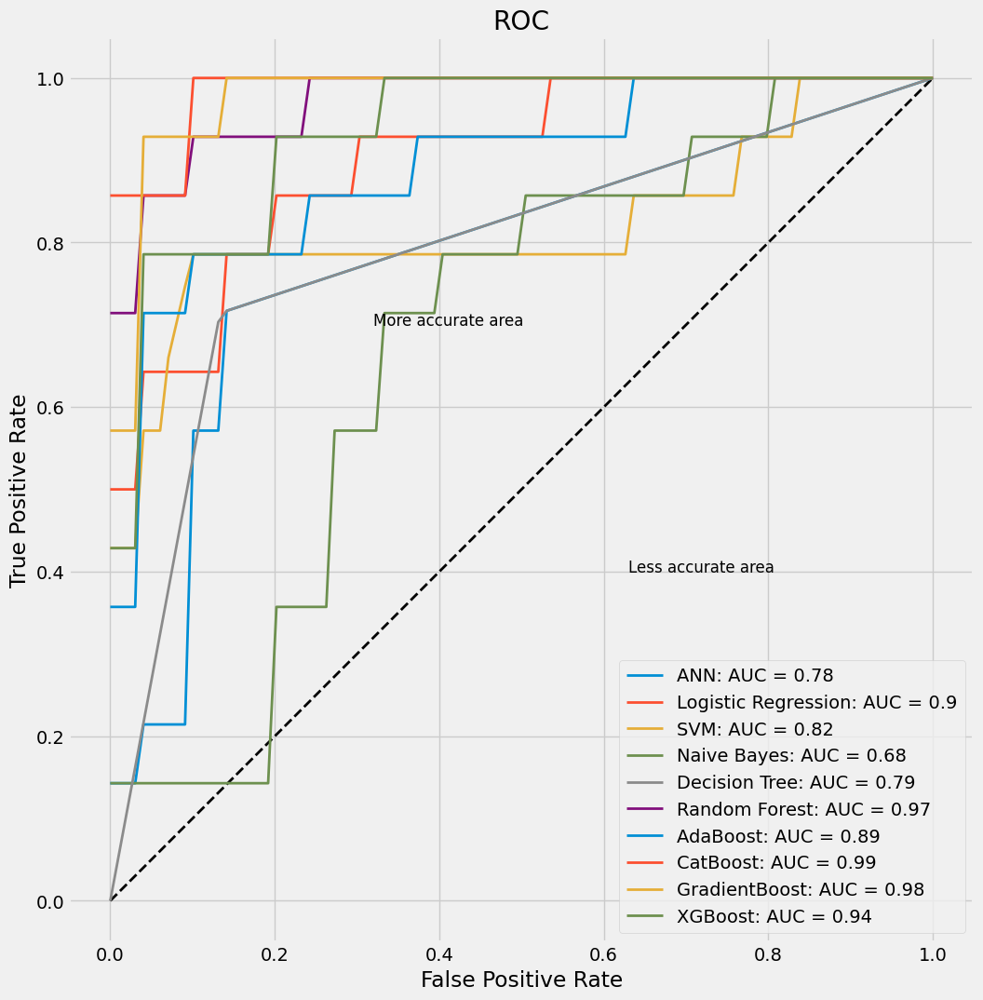

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.571429,0.866667,0.666667,0.615385,0.781821
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.902237
SVM,0.863636,0.785714,0.9,0.785714,0.785714,0.819297
Naive Bayes,0.613636,0.214286,0.8,0.333333,0.26087,0.681818
Decision Tree,0.818182,0.714286,0.866667,0.714286,0.714286,0.790435
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.97114
AdaBoost,0.340909,1.0,0.033333,0.325581,0.491228,0.892136
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.986291
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.977633
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.935786


In [ ]:
new_df_ANN_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_ANN_8020.csv')
result_ANN_8020=k_fold_results(new_df_ANN_8020[new_df_ANN_8020.columns[:-1]],new_df_ANN_8020[new_df_ANN_8020.columns[-1]], create_models(new_df_ANN_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_ANN_8020.T

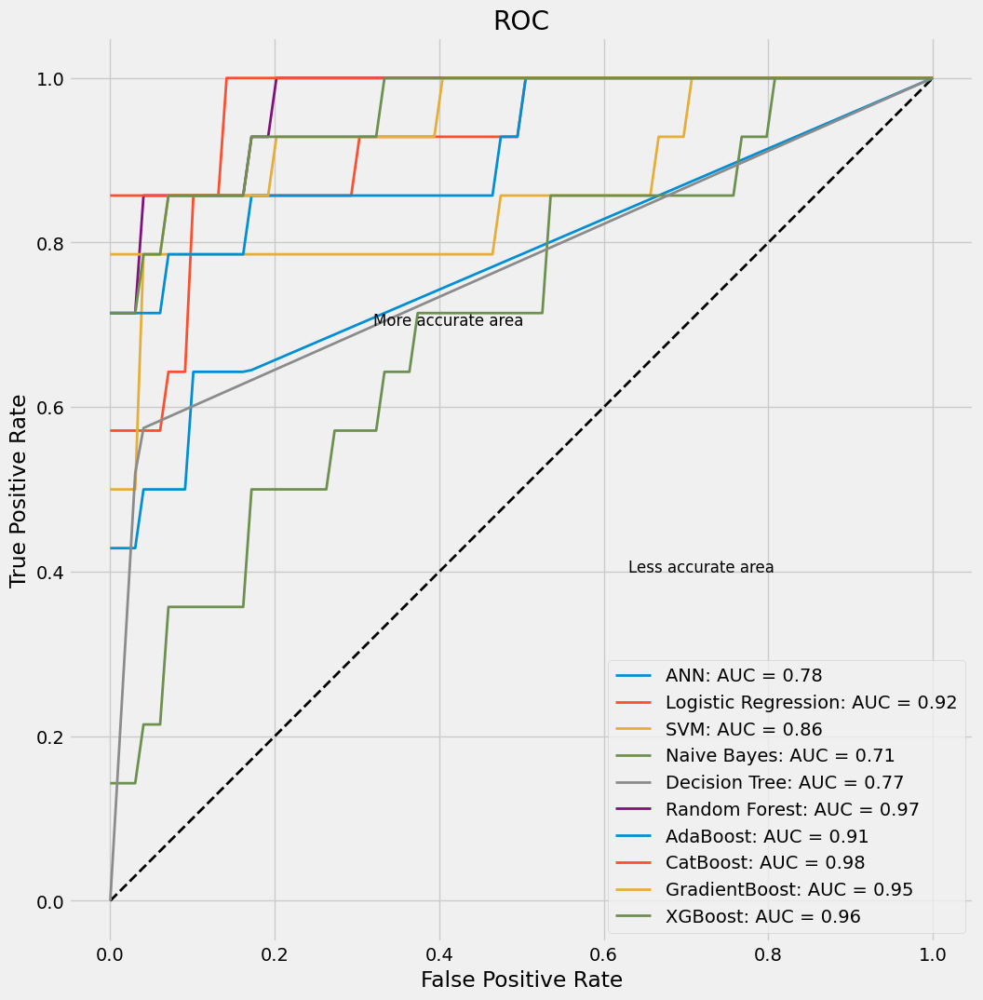

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.428571,0.966667,0.857143,0.571429,0.775438
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.917749
SVM,0.886364,0.785714,0.933333,0.846154,0.814815,0.858947
Naive Bayes,0.75,0.357143,0.933333,0.714286,0.47619,0.707792
Decision Tree,0.840909,0.571429,0.966667,0.888889,0.695652,0.768869
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.968975
AdaBoost,0.340909,1.0,0.033333,0.325581,0.491228,0.914141
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.980519
GradientBoost,0.931818,0.785714,1.0,1.0,0.88,0.952742
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.957431


In [ ]:
new_df_LR_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_LR_10000.csv')
result_LR_10000=k_fold_results(new_df_LR_10000[new_df_LR_10000.columns[:-1]],new_df_LR_10000[new_df_LR_10000.columns[-1]], create_models(new_df_LR_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_LR_10000.T

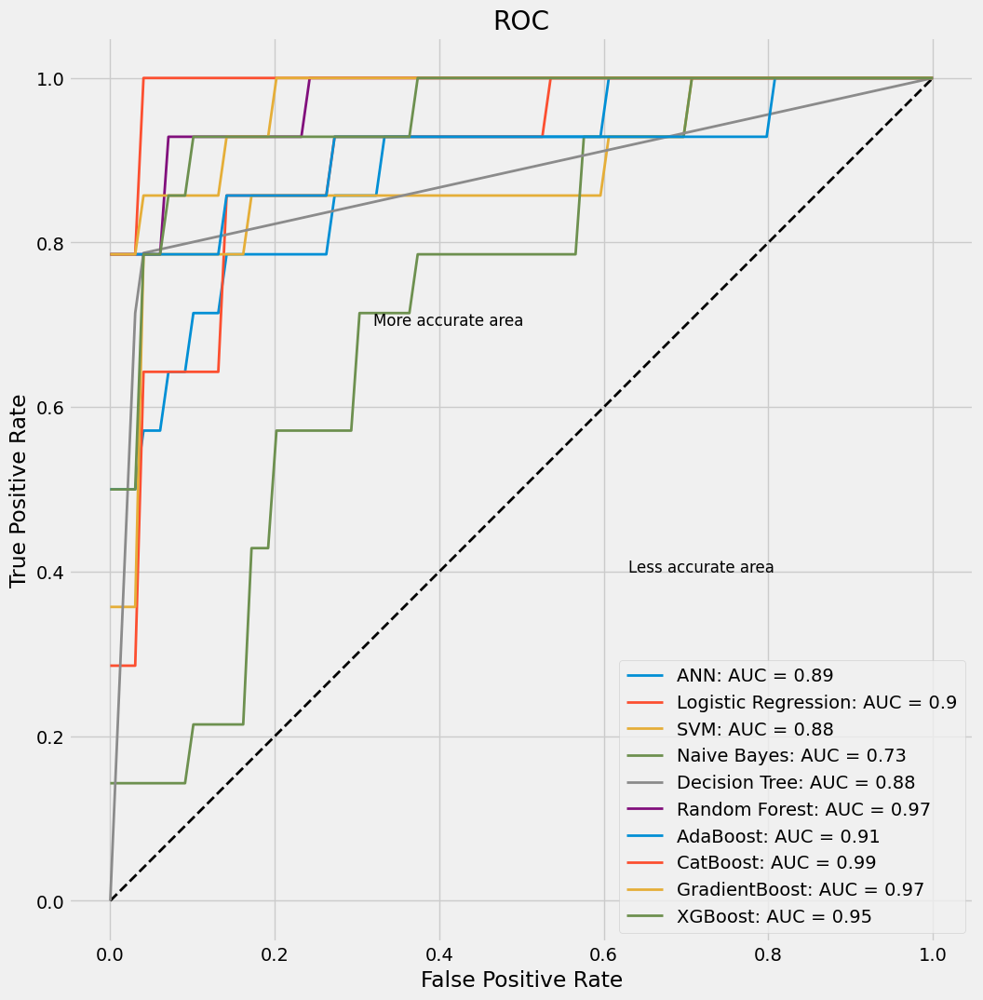

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.818182,0.571429,0.933333,0.8,0.666667,0.890693
Logistic Regression,0.818182,0.642857,0.9,0.75,0.692308,0.901154
SVM,0.886364,0.785714,0.933333,0.846154,0.814815,0.87987
Naive Bayes,0.636364,0.214286,0.833333,0.375,0.272727,0.728716
Decision Tree,0.909091,0.785714,0.966667,0.916667,0.846154,0.87594
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.973665
AdaBoost,0.340909,1.0,0.033333,0.325581,0.491228,0.913781
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992424
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.973665
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.95202


In [ ]:
new_df_SVM_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_SVM_10000.csv')
result_SVM_10000=k_fold_results(new_df_SVM_10000[new_df_SVM_10000.columns[:-1]],new_df_SVM_10000[new_df_SVM_10000.columns[-1]], create_models(new_df_SVM_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_SVM_10000.T

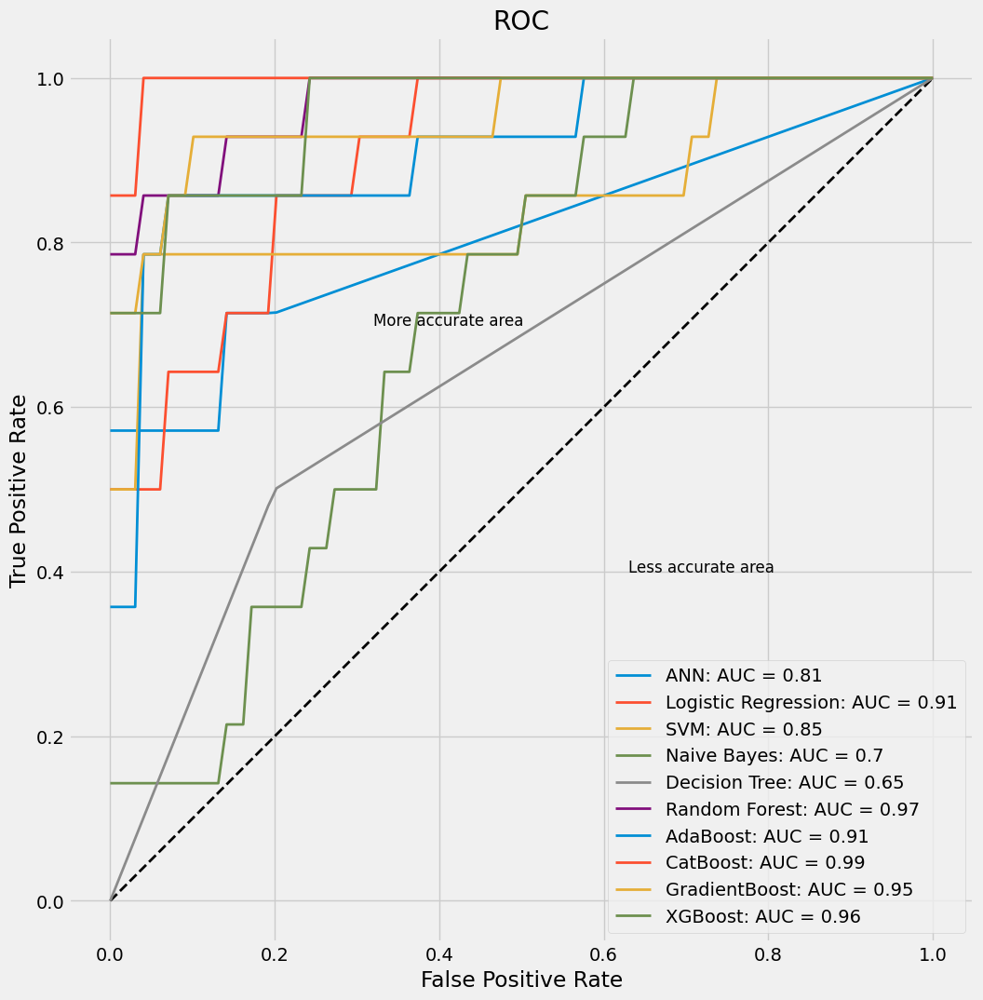

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.642857,0.866667,0.692308,0.666667,0.809094
Logistic Regression,0.840909,0.642857,0.933333,0.818182,0.72,0.905123
SVM,0.886364,0.785714,0.933333,0.846154,0.814815,0.851732
Naive Bayes,0.636364,0.214286,0.833333,0.375,0.272727,0.704906
Decision Tree,0.704545,0.5,0.8,0.538462,0.518519,0.649985
Random Forest,0.931818,0.785714,1.0,1.0,0.88,0.970779
AdaBoost,0.363636,1.0,0.066667,0.333333,0.5,0.913059
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.994949
GradientBoost,0.909091,0.714286,1.0,1.0,0.833333,0.952381
XGBoost,0.886364,0.785714,0.933333,0.846154,0.814815,0.95671


In [ ]:
new_df_NB_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_NB_8020.csv')
result_NB_8020=k_fold_results(new_df_NB_8020[new_df_NB_8020.columns[:-1]],new_df_NB_8020[new_df_NB_8020.columns[-1]], create_models(new_df_NB_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_NB_8020.T

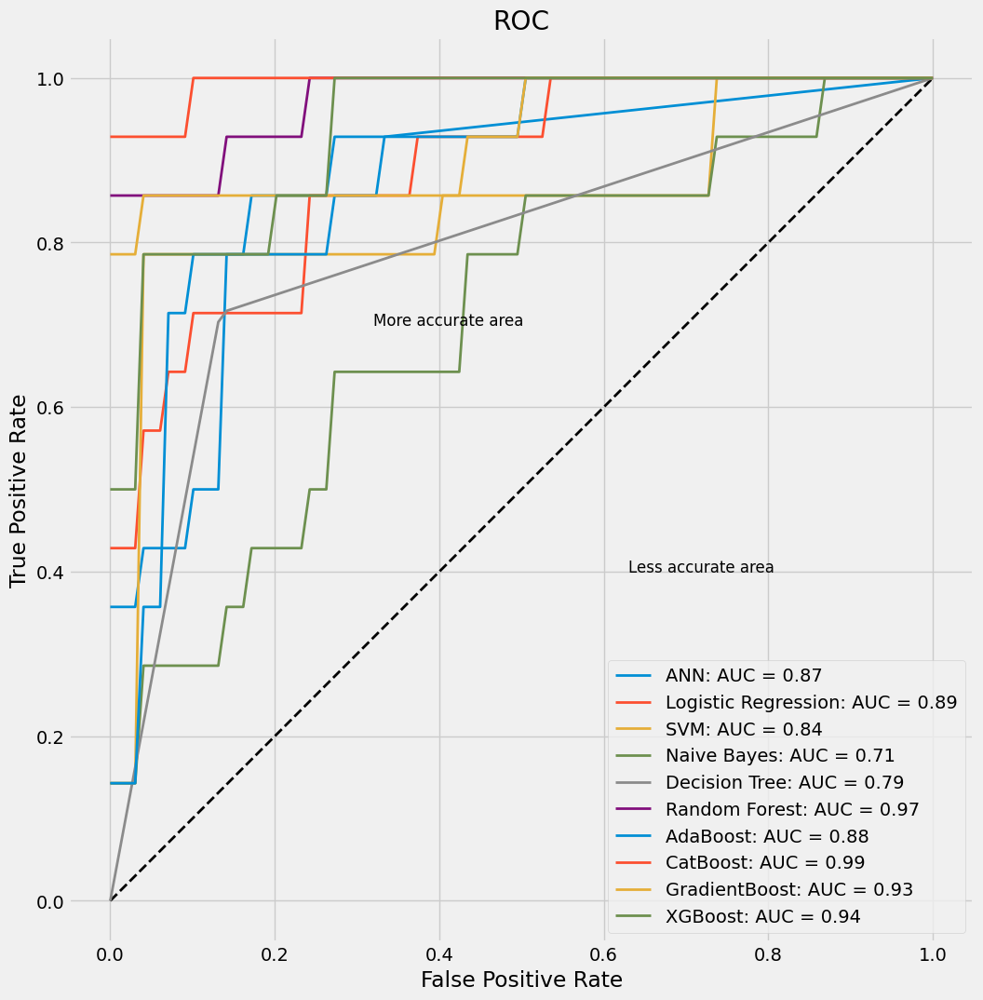

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.772727,0.5,0.9,0.7,0.583333,0.873016
Logistic Regression,0.818182,0.642857,0.9,0.75,0.692308,0.885281
SVM,0.863636,0.785714,0.9,0.785714,0.785714,0.844156
Naive Bayes,0.681818,0.357143,0.833333,0.5,0.416667,0.707071
Decision Tree,0.818182,0.714286,0.866667,0.714286,0.714286,0.790435
Random Forest,0.931818,0.857143,0.966667,0.923077,0.888889,0.973304
AdaBoost,0.318182,1.0,0.0,0.318182,0.482759,0.883838
CatBoost,0.954545,0.857143,1.0,1.0,0.923077,0.993146
GradientBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.931097
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.93759


In [ ]:
new_df_RF_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_10000.csv')
result_RF_10000=k_fold_results(new_df_RF_10000[new_df_RF_10000.columns[:-1]],new_df_RF_10000[new_df_RF_10000.columns[-1]], create_models(new_df_RF_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_10000.T

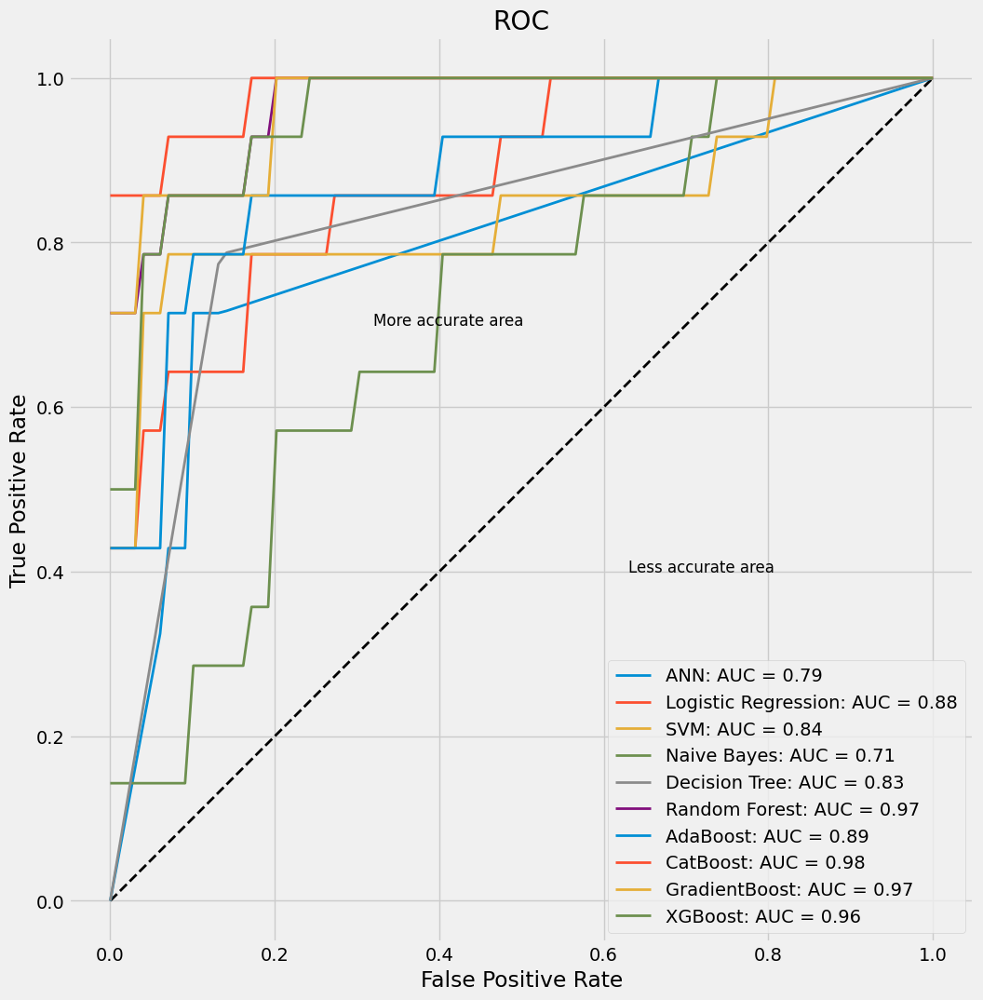

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.840909,0.714286,0.9,0.769231,0.740741,0.794021
Logistic Regression,0.818182,0.642857,0.9,0.75,0.692308,0.875902
SVM,0.886364,0.785714,0.933333,0.846154,0.814815,0.841991
Naive Bayes,0.681818,0.357143,0.833333,0.5,0.416667,0.710678
Decision Tree,0.840909,0.785714,0.866667,0.733333,0.758621,0.826144
Random Forest,0.909091,0.785714,0.966667,0.916667,0.846154,0.966811
AdaBoost,0.340909,1.0,0.033333,0.325581,0.491228,0.886724
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.983405
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.966811
XGBoost,0.909091,0.785714,0.966667,0.916667,0.846154,0.956349


In [ ]:
new_df_RF_5050 = pd.read_csv('/content/gdrive/MyDrive/new_df_RF_5050.csv')
result_RF_5050=k_fold_results(new_df_RF_5050[new_df_RF_5050.columns[:-1]],new_df_RF_5050[new_df_RF_5050.columns[-1]], create_models(new_df_RF_5050), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_RF_5050.T

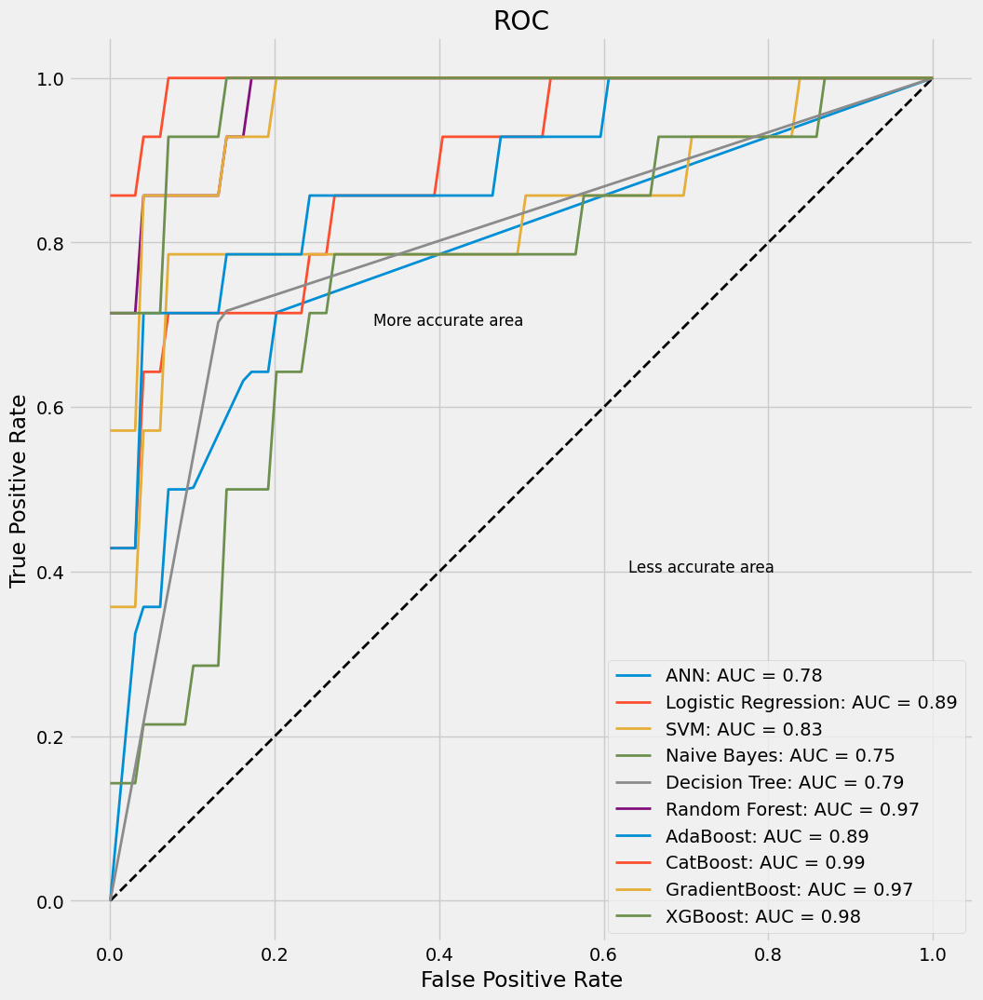

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.75,0.642857,0.8,0.6,0.62069,0.779993
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.885281
SVM,0.863636,0.714286,0.933333,0.833333,0.769231,0.832973
Naive Bayes,0.727273,0.428571,0.866667,0.6,0.5,0.747475
Decision Tree,0.818182,0.714286,0.866667,0.714286,0.714286,0.790435
Random Forest,0.909091,0.857143,0.933333,0.857143,0.857143,0.973304
AdaBoost,0.363636,1.0,0.066667,0.333333,0.5,0.886724
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.992785
GradientBoost,0.840909,0.571429,0.966667,0.888889,0.695652,0.966089
XGBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.97619


In [ ]:
new_df_XGB_10000 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_10000.csv')
result_XGB_10000=k_fold_results(new_df_XGB_10000[new_df_XGB_10000.columns[:-1]],new_df_XGB_10000[new_df_XGB_10000.columns[-1]], create_models(new_df_XGB_10000), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_10000.T

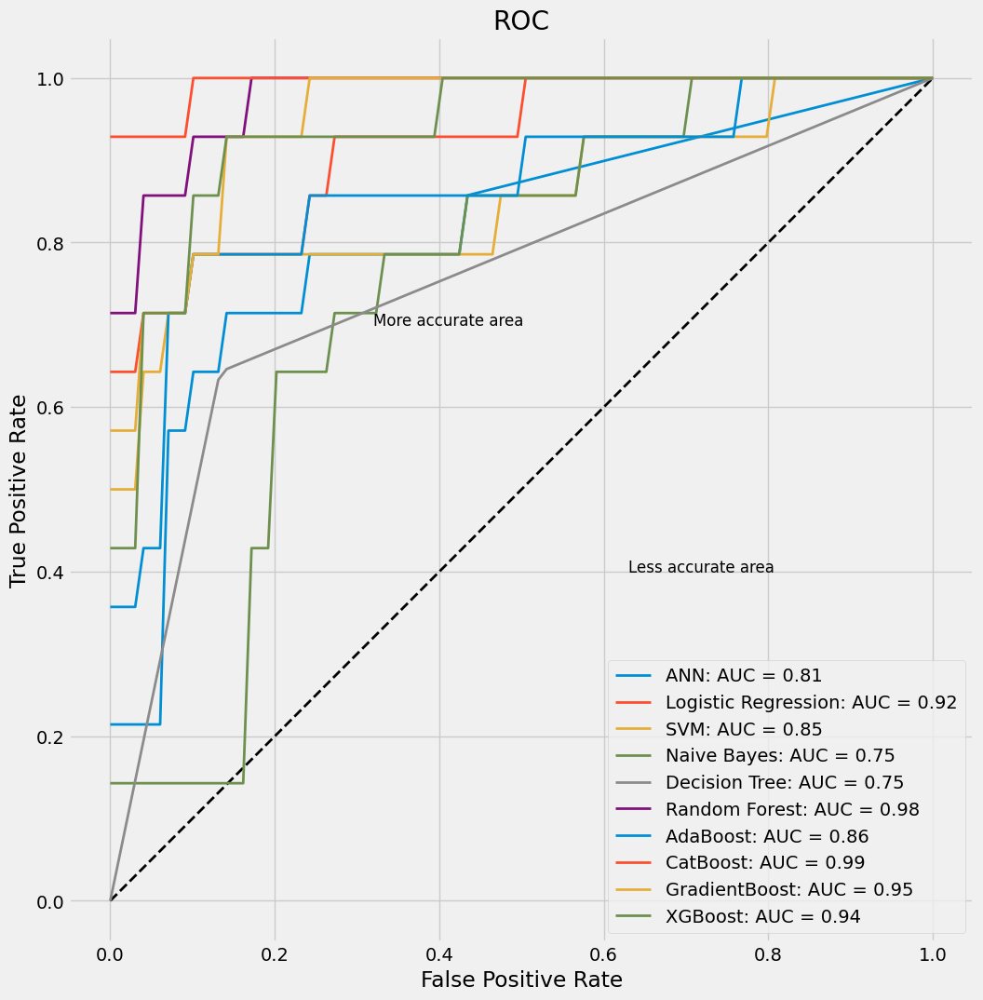

,accuracy,recall,specificity,precision,F1,AUC
ANN,0.795455,0.642857,0.866667,0.692308,0.666667,0.809958
Logistic Regression,0.863636,0.642857,0.966667,0.9,0.75,0.918831
SVM,0.840909,0.714286,0.9,0.769231,0.740741,0.851732
Naive Bayes,0.636364,0.214286,0.833333,0.375,0.272727,0.746032
Decision Tree,0.795455,0.642857,0.866667,0.692308,0.666667,0.754726
Random Forest,0.931818,0.857143,0.966667,0.923077,0.888889,0.97619
AdaBoost,0.318182,1.0,0.0,0.318182,0.482759,0.864719
CatBoost,0.931818,0.785714,1.0,1.0,0.88,0.993146
GradientBoost,0.886364,0.714286,0.966667,0.909091,0.8,0.951659
XGBoost,0.863636,0.714286,0.933333,0.833333,0.769231,0.937951


In [ ]:
new_df_XGB_8020 = pd.read_csv('/content/gdrive/MyDrive/new_df_XGB_8020.csv')
result_XGB_8020=k_fold_results(new_df_XGB_8020[new_df_XGB_8020.columns[:-1]],new_df_XGB_8020[new_df_XGB_8020.columns[-1]], create_models(new_df_XGB_8020), test_samples=(df_validation[df_validation.columns[:-1]].to_numpy(), df_validation[df_validation.columns[-1]].to_numpy()))
result_XGB_8020.T

In [ ]:
result_XGB_00100.T.to_csv(f'/content/gdrive/MyDrive/result_XGB_00100_test.csv')

In [ ]:
result_XGB_00100_validation = result_XGB_00100.copy()
result_XGB_00100_validation[result_XGB_00100_validation.index =='accuracy'] = [75.22, 81.30, 76.09, 70.87, 80.87, 89.13, 83.04, 89.13, 86.96, 88.70, ]
result_XGB_00100_validation[result_XGB_00100_validation.index =='accuracy'] /=100

result_XGB_00100_validation[result_XGB_00100_validation.index =='recall'] = [65.57, 73.57, 61.57, 68.85, 75.51, 86.18, 88.85, 86.18, 86.18, 88.85, ]
result_XGB_00100_validation[result_XGB_00100_validation.index =='recall'] /=100

In [ ]:
result_ANN_8020.T.to_csv(f'/content/gdrive/MyDrive/result_ANN_8020_test.csv')

In [ ]:
result_ANN_8020_validation = result_ANN_8020.copy()
result_ANN_8020_validation[result_ANN_8020_validation.index =='accuracy'] = [77.83, 80.87, 74.35, 70.43, 80.87, 90.43, 80.87, 88.70, 88.70, 87.39]
result_ANN_8020_validation[result_ANN_8020_validation.index =='accuracy'] /=100

result_ANN_8020_validation[result_ANN_8020_validation.index =='recall'] = [60.86, 75.81, 57.05, 58.19, 78.00, 81.05, 81.05, 79.71, 83.71, 83.71, ]
result_ANN_8020_validation[result_ANN_8020_validation.index =='recall'] /=100

In [ ]:
result_LR_10000.T.to_csv(f'/content/gdrive/MyDrive/result_LR_10000_test.csv')

In [ ]:
result_LR_10000_validation = result_LR_10000.copy()
result_LR_10000_validation[result_LR_10000_validation.index =='accuracy'] = [76.52, 83.91, 75.65, 71.74, 80.87, 90.43, 81.74, 89.13, 88.70, 87.83, ]
result_LR_10000_validation[result_LR_10000_validation.index =='accuracy'] /=100

result_LR_10000_validation[result_LR_10000_validation.index =='recall'] = [62.38, 66.00, 54.19, 30.86, 71.62, 81.05, 76.95, 81.05, 76.95, 83.71, ]
result_LR_10000_validation[result_LR_10000_validation.index =='recall'] /=100

In [ ]:
result_SVM_10000.T.to_csv(f'/content/gdrive/MyDrive/result_NB_10000_test.csv')

In [ ]:
result_SVM_10000_validation = result_SVM_10000.copy()
result_SVM_10000_validation[result_SVM_10000_validation.index =='accuracy'] = [74.78, 83.04, 75.65, 71.30, 82.17, 90.43, 81.74, 88.70, 89.13, 87.39, ]
result_SVM_10000_validation[result_SVM_10000_validation.index =='accuracy'] /=100

result_SVM_10000_validation[result_SVM_10000_validation.index =='recall'] = [64.86, 68.86, 54.19, 40.29, 70.19, 79.71, 78.29, 82.38, 78.29, 82.38, ]
result_SVM_10000_validation[result_SVM_10000_validation.index =='recall'] /=100

In [ ]:
result_NB_8020.T.to_csv(f'/content/gdrive/MyDrive/result_NB_8020_test.csv')

In [ ]:
result_NB_8020_validation = result_NB_8020.copy()
result_NB_8020_validation[result_NB_8020_validation.index =='accuracy'] = [76.96, 82.61, 74.35, 71.74, 82.17, 90.43, 83.48, 88.70, 88.70, 86.96, ]
result_NB_8020_validation[result_NB_8020_validation.index =='accuracy'] /=100

result_NB_8020_validation[result_NB_8020_validation.index =='recall'] = [66.29, 64.76, 55.52, 38.95, 75.62, 79.62, 79.62, 83.71, 79.62, 80.95, ]
result_NB_8020_validation[result_NB_8020_validation.index =='recall'] /=100

In [ ]:
result_RF_10000.T.to_csv(f'/content/gdrive/MyDrive/result_RF_10000_test.csv')

In [ ]:
result_RF_10000_validation = result_RF_10000.copy()
result_RF_10000_validation[result_RF_10000_validation.index =='accuracy'] = [77.39, 82.17, 74.35, 70.87, 83.91, 90.43, 81.74, 89.13, 86.52, 86.09, ]
result_RF_10000_validation[result_RF_10000_validation.index =='accuracy'] /=100

result_RF_10000_validation[result_RF_10000_validation.index =='recall'] = [58.19, 75.62, 61.05, 59.33, 67.43, 78.38, 74.29, 83.71, 75.43, 82.38, ]
result_RF_10000_validation[result_RF_10000_validation.index =='recall'] /=100

In [ ]:
result_RF_5050.T.to_csv(f'/content/gdrive/MyDrive/result_RF_5050_test.csv')

In [ ]:
result_RF_5050_validation = result_RF_5050.copy()
result_RF_5050_validation[result_RF_5050_validation.index =='accuracy'] = [75.65, 81.74, 74.78, 70.43, 81.30, 90.43, 82.17, 89.13, 88.26, 85.22,  ]
result_RF_5050_validation[result_RF_5050_validation.index =='accuracy'] /=100

result_RF_5050_validation[result_RF_5050_validation.index =='recall'] = [58.29, 79.81, 59.71, 59.52, 79.52, 79.71, 75.52, 83.71, 79.52, 79.62, ]
result_RF_5050_validation[result_RF_5050_validation.index =='recall'] /=100

In [ ]:
result_XGB_8020.T.to_csv(f'/content/gdrive/MyDrive/result_XGB_8020_test.csv')

In [ ]:
result_XGB_8020_validation = result_XGB_8020.copy()
result_XGB_8020_validation[result_XGB_8020_validation.index =='accuracy'] = [75.65, 82.17, 75.65, 71.74, 84.78, 90.43, 80.87, 88.70, 89.13, 86.96, ]
result_XGB_8020_validation[result_XGB_8020_validation.index =='accuracy'] /=100

result_XGB_8020_validation[result_XGB_8020_validation.index =='recall'] = [59.43, 77.05, 60.95, 57.91, 74.19, 82.38, 78.29, 81.05, 79.62, 83.71,  ]
result_XGB_8020_validation[result_XGB_8020_validation.index =='recall'] /=100

In [ ]:
def result_barPlot(name,df1,df2,cols,sub=None):
    plt.style.use('ggplot')

    n = 1  # This is our first dataset (out of 2)
    t = 2 # Number of datasets
    d = len(cols) # Number of sets of bars
    w = 0.8 # Width of each bar
    x1=[n*w+(i*t) for i in range(d)]
    x2=[(n+1)*w+(i*t) for i in range(d)]
    y1=df1.loc[name].to_numpy()*100
    y2=df2.loc[name].to_numpy()*100

    if sub!=None:
        ax=plt.subplot(sub[0],sub[1],sub[2])
    else:
        ax=plt.subplot()
    ax.margins( y=0.1)
    ax.set_xticks(np.array(range(len(algoNames)))*2+1.2)
    ax.set_xticklabels(cols,rotation=30)

    y_ax=[20,40,60,80,90]
    ax.set_yticks(y_ax)
    ax.set_yticklabels(y_ax)

    plt.bar(x1, y1)
    plt.bar(x2, y2)
    plt.title(name)
    plt.legend(['Validation','Test'],loc='lower left')

def result_barPlot_show(def1,def2,criterion,cols):
    plt.figure(figsize=(20,15))
    plt.subplots_adjust(hspace=0.8)
    for i,crt in enumerate(criterion):
        result_barPlot(crt,def1,def2,cols,(3,2,i+1))


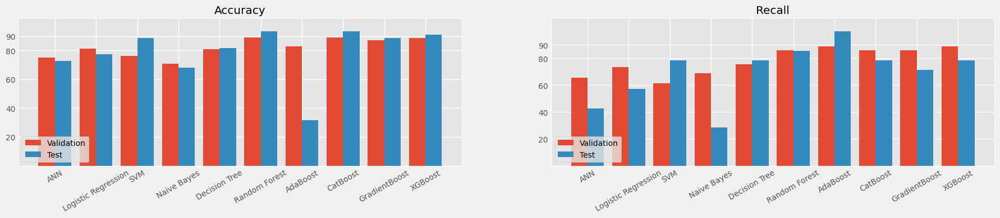

In [ ]:
result_XGB_00100_validation = result_XGB_00100_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_XGB_00100 = result_XGB_00100.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_XGB_00100_validation,result_XGB_00100,criterion,algoNames)

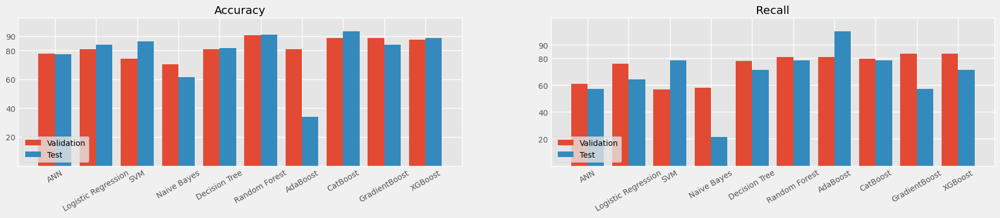

In [ ]:
result_ANN_8020_validation = result_ANN_8020_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_ANN_8020 = result_ANN_8020.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_ANN_8020_validation,result_ANN_8020,criterion,algoNames)

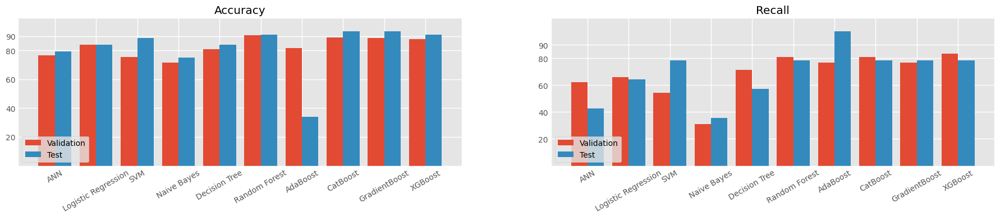

In [ ]:
result_LR_10000_validation = result_LR_10000_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_LR_10000 = result_LR_10000.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_LR_10000_validation,result_LR_10000,criterion,algoNames)

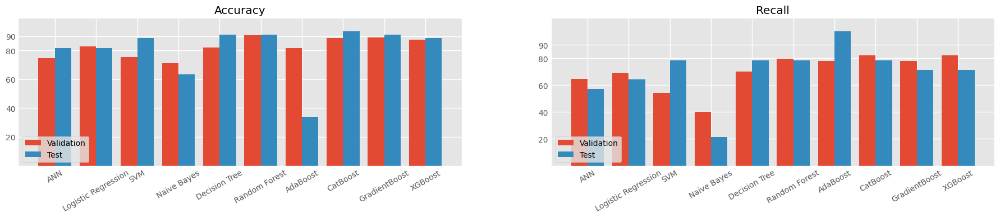

In [ ]:
result_SVM_10000_validation = result_SVM_10000_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_SVM_10000 = result_SVM_10000.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_SVM_10000_validation,result_SVM_10000,criterion,algoNames)

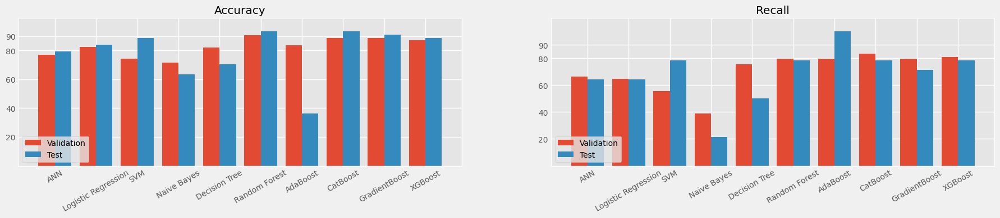

In [ ]:
result_NB_8020_validation = result_NB_8020_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_NB_8020 = result_NB_8020.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_NB_8020_validation,result_NB_8020,criterion,algoNames)

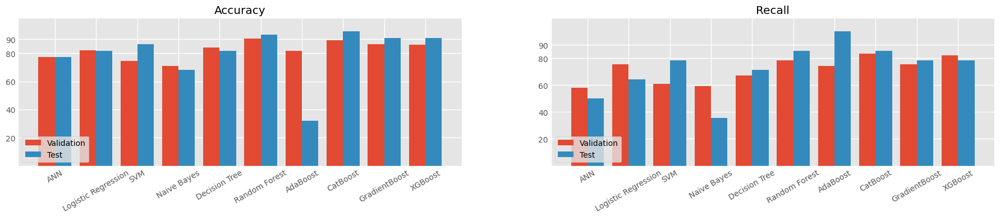

In [ ]:
result_RF_10000_validation = result_RF_10000_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_RF_10000 = result_RF_10000.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_RF_10000_validation,result_RF_10000,criterion,algoNames)

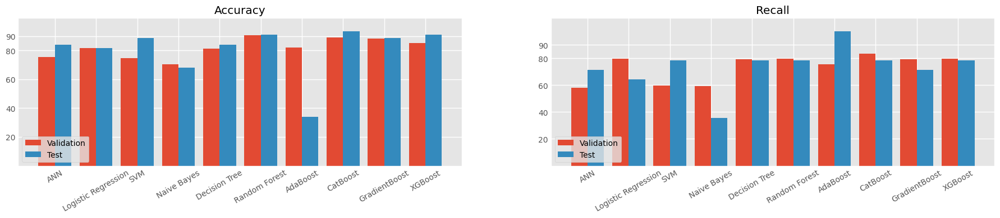

In [ ]:
result_RF_5050_validation = result_RF_5050_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_RF_5050 = result_RF_5050.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_RF_5050_validation,result_RF_5050,criterion,algoNames)

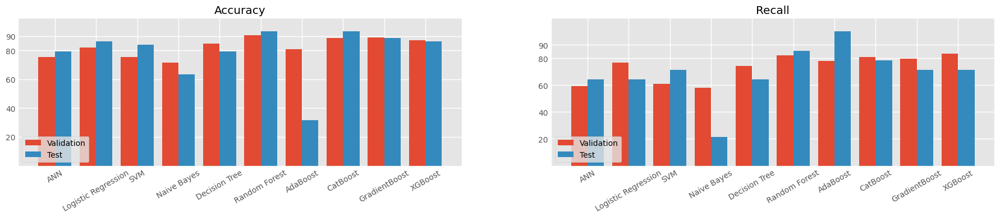

In [ ]:
result_XGB_8020_validation = result_XGB_8020_validation.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
result_XGB_8020 = result_XGB_8020.rename(index={'accuracy':'Accuracy', 'recall':'Recall', 'specificity':'Specificity', 'precision':'Precision', 'F1':'F1-Score'})
algoNames=create_models(df).keys()
criterion=['Accuracy',
            'Recall',
           ]
result_barPlot_show(result_XGB_8020_validation,result_XGB_8020,criterion,algoNames)

.

.

.

.

.

.

.

In [ ]:
def feature_selection(df):
  cat_df = df.copy()
  cat_df[cat_df.columns[:-1][features_mask]] = cat_df[cat_df.columns[:-1][features_mask]].astype(int)
  categorical_features = np.where(features_mask==True)[0]
  catboost_dataset = Pool(data=cat_df[cat_df.columns[:-1]], label=cat_df.target, cat_features=categorical_features)
  model = CatBoostClassifier(iterations=500, depth=6, learning_rate=0.1, loss_function='Logloss', cat_features=categorical_features)
  model.fit(catboost_dataset, verbose=False)

  feature_importance = model.get_feature_importance(catboost_dataset)
  # Create a bar plot of feature importance scores
  feature_names = df.columns[:-1]  # Assuming the last column is the target
  plt.figure(figsize=(10, 6))
  plt.barh(feature_names, feature_importance, color='skyblue')
  plt.xlabel('Feature Importance')
  plt.title('CatBoost Feature Importance')
  plt.gca().invert_yaxis()
  plt.show()
  # Select the top K features
  top_k_features = [feature for _, feature in sorted(zip(feature_importance, feature_names), reverse=True)[:-6]]
  buttom_features = [feature for _, feature in sorted(zip(feature_importance, feature_names))[:6]]
  return df[top_k_features + ['target']]

In [ ]:
 new_df_after_selection = feature_selection(new_df_DT_10000)

In [ ]:
result=k_fold_results(new_df_after_selection[new_df_after_selection.columns[:-1]],new_df_after_selection[new_df_after_selection.columns[-1]], create_models(new_df_after_selection), test_samples=(df_test[new_df_after_selection.columns[:-1]].to_numpy(), df_test[new_df_after_selection.columns[-1]].to_numpy()))
result.T

In [ ]:
new_df_after_selection

In [ ]:
result=k_fold_results(new_df_after_selection[new_df_after_selection.columns[:-1]],new_df_after_selection[new_df_after_selection.columns[-1]],create_algo(new_df_after_selection))
result.T

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(new_df[new_df.columns[:-1]], new_df[new_df.columns[-1]] , test_size=0.50)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(df[df.columns[:-1]], df[df.columns[-1]] , test_size=0.50)

In [ ]:
x_train['target'] = y_train
algo = deep_model(x_train)
algo.compile(optimizer='adam', loss='binary_crossentropy')
history = algo.fit(x_train[new_df.columns[:-1]], x_train[new_df.columns[-1]], epochs=100, verbose=False)
# probability_predictions = algo.predict(X_test)

In [ ]:
x_test = df[df.columns[:-1]][df.target==0]
y_test = df[df.columns[-1]][df.target==0]

In [ ]:
x_test = new_df[new_df.columns[:-1]][new_df.target==1]
y_test = new_df[new_df.columns[-1]][new_df.target==1]
probability_predictions = algo.predict(x_train[new_df.columns[:-1]])
probability_predictions = [[1, ] if i>0.5 else [0,] for i in probability_predictions ]
accuracy_score(probability_predictions, x_train[new_df.columns[-1]].to_numpy())

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score
probability_predictions = algo.predict(x_test[new_df.columns[:-1]])
probability_predictions = [[1, ] if i>0.5 else [0,] for i in probability_predictions ]
accuracy_score(probability_predictions, y_test.to_numpy())

In [ ]:
recall_score(probability_predictions, y_test.to_numpy())

In [ ]:
precision_score(probability_predictions, y_test.to_numpy())

# TSNE

In [ ]:
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap
import seaborn as sns

In [ ]:
# X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3).fit_transform(new_df_ADA_8020[new_df_ADA_8020.columns[:-1]])
# tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3)
tsne = Isomap(n_neighbors=30)
X_embedded = tsne.fit_transform(df[df.columns[:-1]])

In [ ]:
def calculate_distance(point, coordinates, features_mask=features_mask):
  if features_mask is None:
    return 1 - np.absolute(np.dot(coordinates, point)/(np.linalg.norm(point)*np.linalg.norm(coordinates, axis=1)))
  else:
    return HEEM(point, coordinates, features_mask)


def find_nearest_neighbors(point, coordinates):
  distances = calculate_distance(point, coordinates)
  return np.argsort(distances)[0:30]

In [ ]:
find_nearest_neighbors(x[1], x)

In [ ]:
"""
Define minor and major
Find minor and major which are in a same clusters
Find Inlands, Borderlines and majorities which are in a same cluster and in a same neighborhood
Set colors for Inlands, Borderlines and Majorities
"""

In [ ]:
major = x[y==0]
minor = x[y==1]

major_indices = np.where(y==0)[0]
minor_indices = np.where(y==1)[0]

In [ ]:
cluster_1 = np.where(over.cfs_minor.clusters==1)[0]
cluster_1_inlands = np.where(np.in1d(cluster_1, over.cfs_minor.regions['inland']))[0]
cluster_1_borderlines = np.where(np.in1d(cluster_1, over.cfs_minor.regions['borderline']))[0]

In [ ]:
neighbors = find_nearest_neighbors(minor[over.cfs_minor.centers[1]], x)
minor_neighbors = np.where(np.in1d(neighbors, minor_indices))[0]
major_neighbors = np.where(np.in1d(neighbors, major_indices))[0]

In [ ]:
X_embedded = tsne.transform(x[neighbors])

In [ ]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=df[df.columns[-1]], )

In [ ]:
X_embedded = tsne.transform(new_df_DT_10000[new_df_DT_10000.columns[:-1]])

In [ ]:
# plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=new_df_ADA_8020[new_df_ADA_8020.columns[-1]], cmap='viridis',)
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=new_df_DT_10000[new_df_DT_10000.columns[-1]], )

# PCA: Principal component analysis

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
components = 2
pca = PCA(n_components=components)
x_pca = pca.fit_transform(df[df.columns[:-1]])

In [ ]:
features_name_afterPCA = [f'feature{i}' for i in range(components)]
target_name_afterPCA  = df.columns[-1]

In [ ]:
df_afterPCA = pd.DataFrame(x_pca, columns=features_name_afterPCA)
df_afterPCA[target_name_afterPCA] = df.target

In [ ]:
df_afterPCA

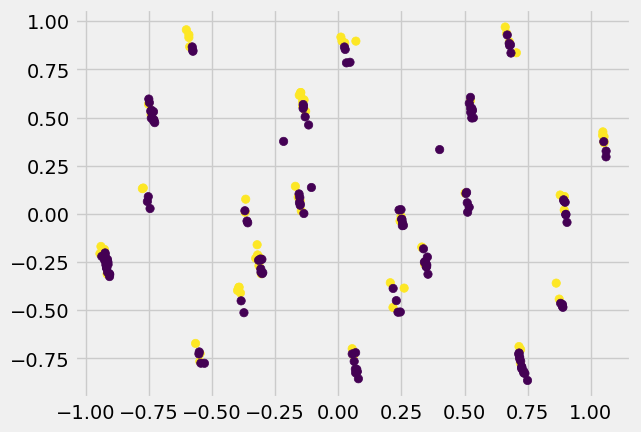

In [ ]:
plt.scatter(df_afterPCA['feature0'], df_afterPCA['feature1'], c=df_afterPCA['target'], cmap='viridis',)

.

.

.

# Evolutionary Neural Network

In [ ]:
import tensorflow as tf
import numpy as np

# Define the neural network architecture
def create_neural_network(input_size):
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(64, activation='relu', input_shape=(input_size,)),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(16, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    return model


In [ ]:
# Define the evaluation function (fitness function)
def evaluate_fitness(model, x_train, y_train, population):
    # Train the model and evaluate its performance on a task
    validation_index = np.random.choice(range(len(population)))
    validation_set = population[validation_index][1]
    x_val = validation_set[:, :-1]
    y_val = validation_set[:, -1]
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[tf.keras.metrics.F1Score()])

    model.fit(x_train, y_train, epochs=40, verbose=0, validation_data=(x_val, y_val))
    _, precision = model.evaluate(x_val, y_val, verbose=1)
    return precision

In [ ]:
def create_population(dataset:pd.DataFrame, population_size=50):
  dataset = dataset.sample(frac=1)
  population_sets_parents= df.iloc[::population_size]
  population = []

  for i, parent in enumerate(population_sets_parents):
    parent_index = population_sets_parents.iloc[i:i+1].index[0]
    population.append(dataset.iloc[parent_index:parent_index+population_size].to_numpy())

  return population

In [ ]:
# Evolutionary algorithm to evolve neural networks
def evolutionary_algorithm(population_size, input_size, generations, df):
    population = [create_neural_network(input_size) for _ in range(population_size)]
    datasets = create_population(df, population_size)

    population = list(zip(population, datasets))
    for generation in range(generations):
        fitness_scores = [evaluate_fitness(model, dataset[:, :-1], dataset[:, -1], population) for model, dataset in population]

        # Select top-performing individuals as parents
        parents_indices = np.argsort(fitness_scores)[-int(0.2 * population_size):]
        parents_indices = parents_indices.flatten()
        parents = [population[i] for i in parents_indices]

        # Create new individuals through crossover and mutation
        offspring = [[tf.keras.models.clone_model(parent), dataset] for parent, dataset in parents]

        for child in offspring:
            # Apply mutation to child (e.g., change random weights)
            for layer in child[0].layers:
                if np.random.rand() < mutation_rate:
                    weights = layer.get_weights()
                    mutated_weights = [w + mutation_strength * np.random.randn(*w.shape) for w in weights]
                    layer.set_weights(mutated_weights)

        # Replace old population with new individuals
        population = parents + offspring

    # Select the best-performing individual from the final generation
    best_model = population[np.argmax(fitness_scores)]
    return best_model


In [ ]:
# Example usage
input_size = len(df.columns) -1
population_size = 10
generations = 10
mutation_rate = 0.1
mutation_strength = 0.1

# Generate random training data for illustration purposes
x_train = new_df_DT_5050[df.columns[:-1]]
y_train =new_df_DT_5050[df.columns[-1]]

best_model = evolutionary_algorithm(population_size, input_size, generations, new_df_DT_5050)



.

.

.

## Spin-Off

## Meta-Learning

In [ ]:

class MetaLearnerModel(tf.keras.Model):
  def __init__(self, shape):
    super().__init__()
    self.inputShape = (shape,)

    self.hidden1 = tf.keras.layers.Dense(64, input_shape=self.inputShape, activation='relu')
    self.hiddenNormalizer1 = tf.keras.layers.BatchNormalization(name='Normalizer1')

    self.hidden2 = tf.keras.layers.Dense(32, activation='relu')
    self.hiddenNormalizer2 = tf.keras.layers.BatchNormalization(name='Normalizer2')

    self.hidden3 = tf.keras.layers.Dense(16, activation='relu')
    self.hiddenNormalizer3 = tf.keras.layers.BatchNormalization(name='Normalizer3')

    self.hidden4 = tf.keras.layers.Dense(8, activation='relu')
    self.hiddenNormalizer4 = tf.keras.layers.BatchNormalization(name='Normalizer4')

    self.hidden5 = tf.keras.layers.Dense(8, activation='relu')
    self.hiddenNormalizer5 = tf.keras.layers.BatchNormalization(name='Normalizer5')

    self.hidden6 = tf.keras.layers.Dense(8, activation='relu')
    self.hiddenNormalizer6 = tf.keras.layers.BatchNormalization(name='Normalizer6')



    self.out = tf.keras.layers.Dense(1, activation='sigmoid')

  def call(self, x):
    x = self.hidden1(x)
    x = self.hiddenNormalizer1(x)

    x = self.hidden2(x)
    x = self.hiddenNormalizer2(x)

    x = self.hidden3(x)
    x = self.hiddenNormalizer3(x)

    x = self.hidden4(x)
    x = self.hiddenNormalizer4(x)

    x = self.hidden5(x)
    x = self.hiddenNormalizer5(x)

    x = self.hidden6(x)
    x = self.hiddenNormalizer6(x)


    x = self.out(x)
    return x

In [ ]:
def loss_function(y)

In [ ]:
def loss_function(y, logits):
  return tf.keras.losses.binary_crossentropy(y, logits)

def compute_loss(model, x,y):
  logits = model(x)
  loss = loss_function(y, logits)
  return loss, logits

def np_to_tensor(x, y, batch_size=1):
  tensors = tf.data.Dataset.from_tensor_slices((x, y))
  tensors = tensors.shuffle(buffer_size=len(x))
  tensors = tensors.batch(batch_size)
  return tensors


def compute_gradients(x, y, model, optimizer):
  with tf.GradientTape() as tape:
    loss, _ = compute_loss(model, x, y)

  return tape.gradient(loss, model.trainable_variables), loss


def apply_gradients(optimizer, gradients, variables):
  optimizer.apply_gradients(zip(gradients, variables))


def train_batch(x, y, model, optimizer):

  gradients, loss = compute_gradients(x, y, model, optimizer)
  apply_gradients(optimizer, gradients, model.trainable_variables)

  return loss

In [ ]:
def copy_model(model, x):
  copied_model = MetaLearnerModel(np.shape(x)[1])
  copied_model(x)
  copied_model.set_weights(model.get_weights())

  return copied_model

In [ ]:
def update_learning_rate(initial_learning_rate, epoch, decay_rate=0.5, decay_epochs=10):
  updated_learning_rate = initial_learning_rate * (decay_rate ** (epoch // decay_epochs))
  return updated_learning_rate


In [ ]:
def train_maml(x, y, model, epochs, lr_inner=0.01, lr_outer = 0.001, batch_size=256, log_steps=5):
  outer_optimizer = tf.keras.optimizers.Adam(lr_outer)
  tensors = np_to_tensor(x, y, batch_size=batch_size)

  for epoch in range(epochs):
    total_loss = 0
    losses = []
    start = time.time()

    for i, (x, y) in enumerate(tensors):
      model(x)
      y = tf.reshape(y, (-1,1))


      with tf.GradientTape() as test_tape:
        # if False:
        with tf.GradientTape() as train_tape:
          train_loss,_ =compute_loss(model, x,y)

        gradients = train_tape.gradient(train_loss, model.trainable_variables)
        k = 0

        model_copy = copy_model(model, x)
        for j in range(len(model_copy.layers)):

          if 'Normalizer' in model_copy.layers[j].name:
            model_copy.layers[j].gamma = tf.subtract(model_copy.layers[j].gamma, tf.multiply(lr_inner, gradients[k]))
            model_copy.layers[j].beta = tf.subtract(model_copy.layers[j].beta, tf.multiply(lr_inner, gradients[k+1]))

          else:
            model_copy.layers[j].kernel = tf.subtract(model_copy.layers[j].kernel, tf.multiply(lr_inner, gradients[k]))
            model_copy.layers[j].bias = tf.subtract(model_copy.layers[j].bias, tf.multiply(lr_inner, gradients[k + 1]))

          k += 2

        test_loss, logits = compute_loss(model_copy, x, y)
        # else:
        #   test_loss, logits = compute_loss(model, x, y)

      gradients = test_tape.gradient(test_loss, model.trainable_variables)
      outer_optimizer.apply_gradients(zip(gradients, model.trainable_variables))

      total_loss += tf.reduce_mean(test_loss)
      loss = total_loss / (i + 1.0)
      losses.append(loss)

    # if epoch % log_steps == 0 and i > 0:
    print(f'Epoch: {epoch+1} loss = {loss}, Time to run  = {time.time() - start}')
    start = time.time()


  plt.plot(losses)
  plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df[df.columns[1:-1]], df[df.columns[-1]] , test_size=0.20)
x_train = new_df_XGB_2080[new_df_XGB_2080.columns[:-1]].to_numpy()
y_train = new_df_XGB_2080[new_df_XGB_2080.columns[-1]].to_numpy()
x_test = df_test[df_test.columns[:-1]].to_numpy()
y_test = df_test[df_test.columns[-1]].to_numpy()

In [ ]:
model = MetaLearnerModel(np.shape(x_train)[1])
train_maml(x_train, y_train, model, 100, batch_size=512)

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score
probability_predictions = model(x_test)
probability_predictions = [[1, ] if i>0.3 else [0,] for i in probability_predictions ]
accuracy_score(probability_predictions, y_test)

In [ ]:
# list(zip(df_test.target,probability_predictions))

In [ ]:
recall_score(y_test, probability_predictions)

In [ ]:
precision_score(y_test, probability_predictions)

## Calculate proximity matrix by Random Forest

In [ ]:
import tensorflow_decision_forests as tfdf
model = tfdf.keras.RandomForestModel(num_trees=1000)
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(df, label="target")
model.fit(train_ds)
leaves = model.predict_get_leaves(train_ds)

def compute_proximity(leaves, step_size=100):
  """Computes the proximity between each pair of examples.

  Args:
    leaves: A matrix of shape [num_example, num_tree] where the value [i,j] is
      the index of the leaf reached by example "i" in the tree "j".
    step_size: Size of the block of examples for the computation of the
      proximity. Does not impact the results.

  Returns:
    The example pair-wise proximity matrix of shape [n,n] with "n" the number of
    examples.
  """

  example_idx = 0
  num_examples = leaves.shape[0]
  t_leaves = np.transpose(leaves)
  proximities = []

  # Instead of computing the proximity in between all the examples at the same
  # time, we compute the similarity in blocks of "step_size" examples. This
  # makes the code more efficient with the the numpy broadcast.
  while example_idx < num_examples:
    end_idx = min(example_idx + step_size, num_examples)
    proximities.append(
        np.mean(
            leaves[..., np.newaxis] == t_leaves[:,
                                                example_idx:end_idx][np.newaxis,
                                                                     ...],
            axis=1))
    example_idx = end_idx
  return np.concatenate(proximities, axis=1)


proximity = compute_proximity(leaves)
print("The shape of proximity is", proximity.shape)

### The first version of CFSFDP clustering method

In [ ]:
import numpy as np

class CFSFDP_v1:
    def __init__(self, coordinates: list, k: int, distance_type: int = 2):
        """Initialize CFSFDP clustering algorithm.

        Args:
            coordinates (list): An array of 2-dimensional points in the map.
            k (int): The number of neighbors.
            distance_type (int, optional): The type of distance measurement. Defaults to 2 (Euclidean distance).
        """
        self.coordinates = coordinates  # Array of 2D points
        self.k = k  # Number of neighbors
        self.distance_type = distance_type  # Type of distance measurement: 1 for Manhattan, 2 for Euclidean, np.inf for Chebyshev

    def calculate_distance(self, point: np.array) -> np.array:
        """Calculate distances between a point and the centroids using the specified distance measure.

        Args:
            point (np.array): A point to calculate distances from.

        Returns:
            np.array: Array of distances between the point and centroids.
        """
        return np.linalg.norm(self.coordinates - point, ord=self.distance_type, axis=1)

    def average_distance(self) -> float:
        """Calculate the average distance from each point to other points in the dataset.

        Returns:
            float: The average distance.
        """
        distances = np.array([np.mean(self.calculate_distance(point)) for point in self.coordinates])
        distances_mean = np.sum(distances) / (len(self.coordinates) - 1)
        return distances_mean

    def median_distance(self) -> float:
        """Calculate the median distance from each point to other points in the dataset.

        Returns:
            float: The median distance.
        """
        distances = np.array([np.median(self.calculate_distance(point)) for point in self.coordinates])
        distances_median = np.median(distances)
        return distances_median

    def calculate_density(self, method='median') -> np.array:
        """Calculate the density of points based on the chosen method.

        Args:
            method (str, optional): Method to calculate the cutoff distance, 'median' or 'mean'. Defaults to 'median'.

        Returns:
            np.array: Array of density values for each point.
        """
        if method == 'median':
            dc = self.median_distance()
        elif method == 'mean':
            dc = self.average_distance()

        difference = np.array([self.calculate_distance(point) - dc for point in self.coordinates])
        density = np.sum(difference < 0, axis=1)
        return density

    def calculate_sigma(self, density):
        """Calculate sigma for each point based on density values.

        Args:
            density (np.array): Array of density values for each point.

        Returns:
            np.array: Array of sigma values for each point.
        """
        density_maximum_indices = np.where(density == np.max(density))[0]
        if not isinstance(density_maximum_indices, (list, np.ndarray)):
            density_maximum_indices = [density_maximum_indices]

        sigma = np.array([np.min(self.calculate_distance(point)[density[i] < density]) for i, point in enumerate(self.coordinates) if i not in density_maximum_indices])

        for density_maximum_index in density_maximum_indices:
            maximum_density_sigma = np.max(self.calculate_distance(self.coordinates[density_maximum_index]))
            sigma = np.insert(sigma, density_maximum_index, maximum_density_sigma)

        return sigma

    def find_cluster_centers(self, sigma, num_clusters: int = 2) -> np.array:
        """Find the first {num_clusters} sigma indices as cluster centers.

        Args:
            sigma (np.array): Array of sigma values for each point.
            num_clusters (int, optional): Number of clusters. Defaults to 2.

        Returns:
            np.array: Indices of selected cluster centers.
        """
        sorted_indices = np.argsort(sigma)[::-1]
        centers = sorted_indices[:num_clusters]
        return centers

    def cluster(self, centers: np.array) -> dict:
        """Perform clustering based on selected cluster centers and return cluster labels for each point.

        Args:
            centers (np.array): Indices of selected cluster centers.

        Returns:
            dict: Dictionary with point indices as keys and corresponding cluster labels as values.
        """
        distances = [self.calculate_distance(self.coordinates[cent]) for cent in centers]
        distances = np.array(distances)
        clusters = np.argmin(distances, axis=0)

        return clusters

    def fit_transform(self, num_clusters: int = 2, method='median'):
        """Fit the model and transform data to obtain cluster labels.

        Args:
            num_clusters (int, optional): Number of clusters. Defaults to 2.
            method (str, optional): Method for calculating cutoff distance, 'median' or 'mean'. Defaults to 'median'.

        Returns:
            dict: Dictionary with point indices as keys and corresponding cluster labels as values.
        """
        self.density = self.calculate_density(method=method)
        self.sigma = self.calculate_sigma(self.density)
        self.centers = self.find_cluster_centers(self.sigma, num_clusters=num_clusters)
        self.clusters = self.cluster(self.centers)

        return self.clusters


    def make_border(self, clusters):
      counter = 0
      inland = []
      borderline = []
      trapped = []
      self.border_regions = defaultdict(list)
      self.border_regions_maximum_density = []

      for i, point in enumerate(self.coordinates):
        distances = self.calculate_distance(point)
        # dc = np.quantile(distances, 0.25) - (np.quantile(distances, 0.75) - np.quantile(distances, 0.25))*1.5
        dc = np.quantile(distances, 0.02)
        difference = clusters[distances < dc]

        if len(np.unique(difference)) > 1:
          self.border_regions[clusters[i]].append(i)
          counter += 1

      for cluster_num in range(self.clusters_num):
        border_region = self.border_regions[cluster_num]
        self.border_regions_maximum_density.append(np.max(self.density[border_region]))

        iland_indices = np.where(self.density[clusters == cluster_num] > self.border_regions_maximum_density[cluster_num])[0]
        inland.append(iland_indices)



      for i, point in enumerate(self.coordinates):
        cluster = clusters[i]
        distances = self.calculate_distance(point)[inland[cluster]]
        dc = np.quantile(distances, 0.05)
        if (self.density[i] <= self.border_regions_maximum_density[cluster]):
          if (distances <= dc).any:
            borderline.append(i)
          else:
            trapped.append(i)


      inland = np.concatenate(inland)

      return {
          'inland':inland,
          'borderline':borderline,
          'trapped':trapped,
      }

In [ ]:
cfs = CFSFDP_v1(coordinates, 20)

In [ ]:
clusters = cfs.fit_transform(num_clusters=3, method='median')

In [ ]:
plt.scatter(cfs.density, cfs.sigma)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from scipy.spatial import distance
class Chromosome:
    def __init__(self,gene,prob):
        self.gene=gene
        self.prob=prob

'''ms: minority indexes
   ml: majority indexes
   knn:KNeighborsClassifier model
   d: ms to ml ratio

   '''
class oversampling:

    def __init__(self,x,y,feature_num,beta=0.5,k=5,threshold=1,seed=2021, dataTypeDict=dataTypeDict, describeData=describeData ):
        self.x=x
        self.y=y
        self.dataTypeDict=dataTypeDict
        self.describeData=describeData
        self.feature_num=feature_num
        self.beta=beta
        self.k=k
        self.threshold=threshold
        self.ref_model()
        np.random.seed(seed)

        '''find minority and majority sets'''
        self.tar=1
        self.ms=np.where(self.y==1)[0]
        self.ml=np.where(self.y==0)[0]

        if(len(self.ml)<len(self.ms)):
            temp=self.ms
            self.ms=self.ml
            self.ml=temp
            self.tar=0

        self.ms_count=len(self.ms)
        self.ml_count=len(self.ml)

        self.x_f = np.array([])
        self.y_f = np.array([])

        self.cfs_minor = cluster_coordinates(self.x[self.ms])
        self.cfs_major = cluster_coordinates(self.x[self.ml])


    def ref_model(self):
        self.knn=KNeighborsClassifier(n_neighbors=self.k)
        self.knn.fit(self.x,self.y)

    def calculate_replication_ratio(self, minorities, desired_size):
      minProbabilities = []
      for ms in minorities:
        ratio = self.find_min_maj_ratio(ms)
        minProbabilities.append(ratio)

      minProbabilities = np.array(minProbabilities)
      practical_size = desired_size - len(minorities)
      if practical_size < 0:
        assert False, 'The desired size must be greater than the size of minorities'


      minProbabilitiesNormal = minProbabilities/np.sum(minProbabilities)

      repRatioList = (minProbabilitiesNormal*practical_size)

      return repRatioList

    def train_fitness_function(self):
      self.fitnessFunction = LogisticRegression()
      self.fitnessFunction.fit(self.x, self.y)


    def distro(self,desire=3000,):


        '''calculate the replication ratio of minority samples'''
        replication_ratio = self.calculate_replication_ratio(self.ms, desire)
        self.train_fitness_function()

        for index, i in enumerate(self.ms):
            neighbors=self.find_neighbors(i)
            np.append(neighbors, i)

            h = replication_ratio[index]
            for _ in range(int(np.round(h))):
                temp_x = self.genetic_algorithm(neighbors,50,self.fitnessFunction,self.feature_num)
                temp_y = self.fitnessFunction.predict(temp_x.reshape(1,-1))
                if temp_y == self.tar:
                  self.x = np.append(self.x, temp_x.reshape(1,-1), axis=0)
                  self.y = np.append(self.y, temp_y)

        return self.x,self.y




    def choose_random_samples(self,minority_set,size,prob):
        indices =[np.random.choice(minority_set,p=prob) for _ in range(size)]
        return indices

    def calculate_distance(self, point: np.array) -> np.array:
      return 1 - np.absolute(np.dot(self.x, point)/(np.linalg.norm(point)*np.linalg.norm(self.x, axis=1)))

    def find_neighbors(self, i):
      distances = self.calculate_distance(self.x[i])
      return np.argsort(distances)[:self.k+1]



    def find_major(self,i):
        '''knn.kneighbors returns the neighbors indices'''
        neighbors=self.find_neighbors(i)

        '''number of neighbors which are major'''
        majority=0
        for j in neighbors:
            if(j in self.ml):
                majority=majority + 1

        return majority

    def find_avg_distance(self,i):
        neighbors=self.find_neighbors(i)
        dis=0
        count=0
        for j in neighbors:
            if(j in self.ms):
                dis = distance.euclidean(self.x[i],self.x[j]) + dis
                count=count+1

        return dis/count


    def find_min_maj_ratio(self,i):
        neighbors=self.find_neighbors(i)
        count=0
        for j in neighbors:
            if(j in self.ms):
                count=count+1
        if(self.k-count==0):
            return 1
        else:
            return count/(self.k-count)

    def find_index(self, point, dataset):
      differences = np.sum(dataset - point, axis=1)
      index = np.where(differences == 0)[0][0]
      return index

    def calculate_trapped_loss(self, coordinates: np.array, trapped: np.array, synthesized: np.array, clusters: np.array):
        neighbors = self.find_nearest_neighbors(trapped)
        index = self.find_index(trapped, coordinates)
        neighbors = neighbors[neighbors != index]
        cluster = clusters[self.find_index(trapped, coordinates)]


    '''ch_i:first  choromosome'''
    '''ch_j:second  choromosome'''
    '''fitness:[choromosom, probability]'''
    def genetic_algorithm(self,minority_set,iterations,fit_function,size):
        chromosomes=[]
        for i in minority_set:
            chromosome=Chromosome(self.x[i],fit_function.predict_proba(self.x[i].reshape(1,-1))[0][self.tar])
            chromosomes.append(chromosome)


        chromosomes=np.array(chromosomes)
        probability=np.array([item.prob for item in chromosomes])
        probability=probability/probability.sum()

        for _ in range(iterations):
            ch_i=np.random.choice(chromosomes,1,p=probability)[0]
            ch_j=np.random.choice(chromosomes,1,p=probability)[0]

            new_gene=self.crossover(ch_i,ch_j,size)
            prob=fit_function.predict_proba(new_gene.reshape(1,-1))[:,self.tar][0]
            chromosome=Chromosome(new_gene,prob)
            chromosomes=np.append(chromosomes,chromosome)

            probability=np.array([item.prob for item in chromosomes])
            probability=probability/probability.sum()



        best_ch=np.where(probability==probability.max())[0]
        return chromosomes[best_ch[0]].gene



    def crossover(self,ch_i,ch_j,size,mutation_rate=0.1):
        p=[ch_i.prob,ch_j.prob]
        p=[item/sum(p) for item in p]

        '''bitmask is an array that shows every feature must inherit from which chromosomes'''
        bitmask=np.random.choice([0,1],size,p=p)

        # new_gene=[ch_i.gene[i] if bitmask[i]==0 else ch_j.gene[i] for i in range(size)]
        new_gene = []

        alpha = (ch_i.prob if ch_i.prob > ch_j.prob else ch_j.prob) / (ch_i.prob + ch_j.prob)


        for i, feature in enumerate(self.dataTypeDict.keys()):
          if self.dataTypeDict[feature] == 'binary' or self.dataTypeDict[feature] == 'category':
            if(np.random.random()<mutation_rate):
              random_choice = random.choice(self.describeData[feature])
              new_gene.append(random_choice)
            else:
              if bitmask[i]==0:
                new_gene.append(ch_i.gene[i])
              else:
                new_gene.append(ch_j.gene[i])


          elif self.dataTypeDict[feature] == 'continuous':
            min_val = min(ch_i.gene[i], ch_j.gene[i]) -  (alpha*abs(ch_i.gene[i] - ch_j.gene[i]))
            max_val = max(ch_i.gene[i], ch_j.gene[i]) +  (alpha*abs(ch_i.gene[i] - ch_j.gene[i]))

            rand_val = np.random.uniform(min_val, max_val)
            new_gene.append(rand_val)

            if (np.random.random()<mutation_rate):
              mutated_value  = np.random.normal(self.describeData[feature]['mean'], self.describeData[feature]['std'])
              mutated_value = new_gene[-1] + mutated_value
              mutated_value = np.clip(mutated_value, self.describeData[feature]['min'], self.describeData[feature]['max'])
              new_gene[-1] = mutated_value

        return np.array(new_gene)
